In [1]:
## Python dependencies 
import matplotlib.pyplot as plt
import matplotlib.colors as col
import numpy as np
import pandas as pd

In [2]:
# My Dependencies
from Samples.Data      import Data
from Plotter.Helper    import Helper
from Plotter.Plotter   import Plotter
from Plotter.Plotter   import Plotter
from Cuts.Cuts         import Cuts

Welcome to JupyROOT 6.18/04


/home/jcordero/anaconda3/envs/CMSenv/lib/python3.6/site-packages/root_numpy/__init__.py:34: RuntimeWarning: ROOT 6.18/04 is currently active but you installed root_numpy against ROOT 6.05/02. Please consider reinstalling root_numpy for this ROOT version.
  RuntimeWarning)
/home/jcordero/anaconda3/envs/CMSenv/lib/python3.6/site-packages/root_numpy/__init__.py:46: RuntimeWarning: numpy 1.15.0 is currently installed but you installed root_numpy against numpy 1.12.1. Please consider reinstalling root_numpy for this numpy version.
  RuntimeWarning)


In [3]:
from scipy.optimize  import curve_fit
from scipy.special   import erf, betainc, gamma
from scipy           import asarray as ar,exp
from numpy.random    import uniform
from scipy           import stats
from scipy.integrate import simps
import array

from root_pandas import read_root 

# External Dependencies
from ROOT import TFile, TTree

In [4]:
import os, datetime

In [5]:
def dirStructure(figpath):
    date = datetime.datetime.now()
    fileName = str(date.year) + str(date.month) + str(date.day) + "/"
    
    try:
        os.mkdir(figpath+fileName)    
    except:
        print("Directory "+fileName+ " already exist")

    
    dirSubStructure(figpath + fileName + "Stacked/")
    dirSubStructure(figpath + fileName + "Unstacked/")
    
    dirSubStructure(figpath + fileName + "nJets/")
    for i in range(5):
        dirSubStructure(figpath + fileName + "nJets/Stacked_nJets"+str(i)+"/")
        dirSubStructure(figpath + fileName + "nJets/Unstacked_nJets"+str(i)+"/")
    
    return figpath+fileName  

def dirSubStructure(path):
    try:
        os.mkdir(path)
    except:
        print("Subdirectory for " + path + " already exists or failed.")
    
    try:
        os.mkdir(path+"log")
        os.mkdir(path+"log/Mult")
        os.mkdir(path+"linear")
        os.mkdir(path+"linear/Mult")
    except:
        print("Subdirectory for " + path + " already exists or failed.")

# Analysis

In [6]:
selection = 'mumug'
#selection = 'elelg'
#selection = 'ee'

#era = "2016"
era = "2017"

if selection == "mumug" or selection == "elelg":
    if era == "2016":
        run = ['B','C','D','E','F','G','H']
        #DataGen = 'rereco'
        DataGen = 'legacy'
        if DataGen == 'legacy':
            #SampleSet = 'MatchZGpaper'
            #SampleSet = 'Rerun'
            SampleSet = 'Correction'
        else:
            SampleSet = 'MatchZGpaper_newAna'
    elif era == "2017":
        run = ['B','C','D','E','F']
        DataGen = 'rereco'
        #SampleSet = 'V1'
        #SampleSet = 'V2_puWeight'
        #SampleSet = 'V2_puWeight_phID'
        #SampleSet = 'V4_phID_isConv'
        #SampleSet = 'V4_phID_isConv_MINUIT'
        SampleSet = 'V6_lPhoton'
        
    LoadVars = [
            'runNumber','evtNumber',
            'nPV','nPU','Rho', 'met',
            'genWeight','eventWeight','puWeight','triggerWeight','photonIDWeight',"photonIsConvWeight",
            'leptonOnePt','leptonOneEta','leptonOnePhi','leptonOneIso','leptonOneCharge',
            'leptonTwoPt','leptonTwoEta','leptonTwoPhi','leptonTwoIso','leptonTwoCharge',
            'photonOnePt','photonOneEta','photonOnePhi',
            'photonOneR9','photonOneMVA','photonOneERes','photonOneSieie',
            'photonOneHoverE','photonOneIneu','photonOneIph','photonOneIch',
            'photonOneSieip','photonOneSipip','photonOneSrr','photonOneE2x2','photonOneE5x5',
            'photonOneScEtaWidth','photonOneScPhiWidth',
            'photonOneScRawE','photonOnePreShowerE','photonOneScBrem',
            'genPhotonPt','genPhotonEta','genPhotonPhi',
            'vetoDY','genIsoPass',
            'dileptonPt','dileptonEta','dileptonPhi','dileptonM',
            'llgPt','llgEta','llgPhi','llgM',
            'dileptonDEta','dileptonDPhi','dileptonDR',
            'l1PhotonDEta','l1PhotonDPhi','l1PhotonDR',
            'l2PhotonDEta','l2PhotonDPhi','l2PhotonDR',
            'dileptonPhotonDEta','dileptonPhotonDPhi','dileptonPhotonDR',
            'nMuons','nElectrons','nPhotons','nJets',#'nTaus','nBJets',
            'passElectronVeto',
            ]
elif selection == "ee":
    if era == "2016":
        run = ['B','C','D','E','F','G','H']
        #DataGen = 'rereco'
        DataGen = 'legacy'
        if DataGen == 'legacy':
            #SampleSet = 'MatchZGpaper'
            #SampleSet = 'Rerun'
            SampleSet = 'Correction'
        else:
            SampleSet = 'MatchZGpaper_newAna'
    elif era == "2017":
        run = ['B','C','D','E','F']
        DataGen = 'rereco'
        SampleSet = 'EfficiencyCorrection/files_zee/V4_phID_isConv'    
    
    LoadVars = [
            'runNumber','evtNumber',
            'nPV','nPU','Rho', 
            #'eventWeight','puWeight',
            'genWeight','triggerWeight','photonIDWeight',
            #'leptonOnePt','leptonOneEta','leptonOnePhi','leptonOneCharge',
            #'leptonTwoPt','leptonTwoEta','leptonTwoPhi','leptonTwoCharge',
            #'photonOnePt','photonOneEta','photonOnePhi',
            'photonOneEta',
            #'photonOneR9','photonOneMVA','photonOneERes','photonOneSieie',
            #'photonOneHoverE','photonOneIneu','photonOneIph','photonOneIch',
            #'photonOneSieip','photonOneSipip','photonOneSrr','photonOneE2x2','photonOneE5x5',
            #'photonOneScEtaWidth','photonOneScPhiWidth',
            #'photonOneScRawE','photonOnePreShowerE','photonOneScBrem',
            #'genPhotonPt',
            #'vetoDY','genIsoPass',
            #'dileptonPt','dileptonEta','dileptonPhi','dileptonM',
            #'nMuons','nElectrons','nTaus','nPhotons','nJets','nBJets',
            #'ProbeIDPass','ProbeISOPass','ProbeWorstPass','ProbeSigPass','ProbeIsConv',
            ]
path    = "/home/jcordero/CMS/data_"+era+"/"+DataGen+"/SMP_ZG/Files/"+selection+"/"+SampleSet+"/"
figpath = "/home/jcordero/CMS/JYCMCMS/SMP_ZG/figs/"+era+"/"+DataGen+"/"+selection+"/"
pathSelections = path+"Reduced"

figpath = dirStructure(figpath)


Help    = Helper(era)

Help.SetPath(path)
Help.figpath = figpath

Plotter = Plotter(Help=Help)
Plotter.SetFig(Help.figpath)

Cut = Cuts(path = Help.path)

Directory 202039/ already exist
Subdirectory for /home/jcordero/CMS/JYCMCMS/SMP_ZG/figs/2017/rereco/mumug/202039/Stacked/ already exists or failed.
Subdirectory for /home/jcordero/CMS/JYCMCMS/SMP_ZG/figs/2017/rereco/mumug/202039/Stacked/ already exists or failed.
Subdirectory for /home/jcordero/CMS/JYCMCMS/SMP_ZG/figs/2017/rereco/mumug/202039/Unstacked/ already exists or failed.
Subdirectory for /home/jcordero/CMS/JYCMCMS/SMP_ZG/figs/2017/rereco/mumug/202039/Unstacked/ already exists or failed.
Subdirectory for /home/jcordero/CMS/JYCMCMS/SMP_ZG/figs/2017/rereco/mumug/202039/nJets/ already exists or failed.
Subdirectory for /home/jcordero/CMS/JYCMCMS/SMP_ZG/figs/2017/rereco/mumug/202039/nJets/ already exists or failed.
Subdirectory for /home/jcordero/CMS/JYCMCMS/SMP_ZG/figs/2017/rereco/mumug/202039/nJets/Stacked_nJets0/ already exists or failed.
Subdirectory for /home/jcordero/CMS/JYCMCMS/SMP_ZG/figs/2017/rereco/mumug/202039/nJets/Stacked_nJets0/ already exists or failed.
Subdirectory f

Error in <TFile::TFile>: file output__0.root does not exist


# High Level Functions

In [7]:
def Single_Ploting(Plotter,
                   data,
                   stacked,
                   log,
                   weightCorrection = True,
                   Blind            = True, 
                   Plotting         = True,
                   StatInclude      = False,
                  ):
    #################################################################
    #var = ['nPV','nJets','nBJets','nMuons','nPhotons','met']
    #var = ['nJets','nBJets','nMuons','nPhotons','met']
    var = ['nJets','nMuons','nPhotons','met']
    for v in var:
        print('----------------'+str(v)+'----------------')
        Plotter.Plot(
                    data,
                    v,
                    part             = '',
                    signalInclude    = True,
                    stacked          = stacked,
                    density          = density,
                    log              = log,
                    weightCorrection = weightCorrection,
                    Blind            = Blind,
                    Plotting         = Plotting,
                    StatInclude      = StatInclude,
                    )
        
    #################################################################
    var = ['Pt','Phi','Eta']
    part = ['leptonOne','leptonOne_EE','leptonOne_EB',
            'leptonTwo','leptonTwo_EE','leptonTwo_EB',
            'photonOne','photonOne_EE','photonOne_EB',
            'dilepton','dilepton_EE','dilepton_EB',
            'llg','llg_EE','llg_EB',
           ]
    for p in part:
        for v in var:
            print('----------------'+p+v+'----------------')
            Plotter.Plot(
                         data,
                         v,
                         part             = p,
                         signalInclude    = True,
                         stacked          = stacked,
                         density          = density,
                         log              = log,
                         weightCorrection = weightCorrection,
                         Blind            = Blind,
                         Plotting         = Plotting,
                         StatInclude      = StatInclude,
                        )   
            
    #################################################################
    var = ['DPhi','DEta','DR']
    part = ['l1Photon','l1Photon_EE','l1Photon_EB',
            'l2Photon','l2Photon_EE','l2Photon_EB',
            'dilepton','dilepton_EE','dilepton_EB',
            'dileptonPhoton','dileptonPhoton_EE','dileptonPhoton_EB',
            ]    
    for p in part:
        for v in var:
            print('----------------'+p+v+'----------------')
            Plotter.Plot(
                         data,
                         v,
                         part             = p,
                         signalInclude    = True,
                         stacked          = stacked,
                         density          = density,
                         log              = log,
                         weightCorrection = weightCorrection,
                         Blind            = Blind,
                         Plotting         = Plotting,
                         StatInclude      = StatInclude,
                        )            
    #################################################################            
    var = ['HoverE','R9','MVA']#,'eres']
    part = ['photonOne','photonOne_EE','photonOne_EB']    
    for p in part:
        for v in var:
            print('----------------'+p+v+'----------------')
            Plotter.Plot(
                         data,
                         v,
                         part             = p,
                         signalInclude    = True,
                         stacked          = stacked,
                         density          = density,
                         log              = log,
                         weightCorrection = weightCorrection,
                         Blind            = Blind,
                         Plotting         = Plotting,
                         StatInclude      = StatInclude,
                        )              
    #################################################################            
    var = ['Ich','Ineu','Iph']
    part = ['photonOne','photonOne_EE','photonOne_EB']                
    for p in part:
        for v in var:
            print('----------------'+p+v+'----------------')
            Plotter.Plot(
                         data,
                         v,
                         part             = p,
                         signalInclude    = True,
                         stacked          = stacked,
                         density          = density,
                         log              = log,
                         weightCorrection = weightCorrection,
                         Blind            = Blind,
                         Plotting         = Plotting,
                         StatInclude      = StatInclude,
                        )        
            
    #################################################################            
    var = ['Srr','Sipip','Sieip','Sieie']
    part = ['photonOne','photonOne_EE','photonOne_EB']                
    for p in part:
        for v in var:
            print('----------------'+p+v+'----------------')
            Plotter.Plot(
                         data,
                         v,
                         part             = p,
                         signalInclude    = True,
                         stacked          = stacked,
                         density          = density,
                         log              = log,
                         weightCorrection = weightCorrection,
                         Blind            = Blind,
                         Plotting         = Plotting,
                         StatInclude      = StatInclude,
                        )        
    #################################################################            
    var = ['E2x2','E5x5','ScEtaWidth','ScPhiWidth','ScRawE','ScBrem','PreShowerE']
    part = ['photonOne','photonOne_EE','photonOne_EB']                
    for p in part:
        for v in var:
            print('----------------'+p+v+'----------------')
            Plotter.Plot(
                         data,
                         v,
                         part             = p,
                         signalInclude    = True,
                         stacked          = stacked,
                         density          = density,
                         log              = log,
                         weightCorrection = weightCorrection,
                         Blind            = Blind,
                         Plotting         = Plotting,
                         StatInclude      = StatInclude,
                        )                    

In [8]:
def Multi_Ploting(Plotter,
                  data,
                  stacked,
                  log,
                  density          = False,
                  customRange      = False,
                  weightCorrection = True,
                  Blind            = True,
                  Plotting         = True,
                  StatInclude      = False,
                 ):
    #################################################################
    var = ['Pt','Phi','Eta']
    part = ['leptonOne','leptonTwo','photonOne_EE','dilepton','llg','photonOne_EB']

    for v in var:

        print('----------------'+str(v)+'----------------')
        Plotter.Plot_Mult(
                          data,
                          var              = v,
                          part             = part,
                          signalInclude    = True,
                          figDim           = [2,3],
                          customRange      = customRange,
                          stacked          = stacked,
                          density          = density,
                          log              = log,
                          weightCorrection = weightCorrection,
                          Plotting         = Plotting,
                          StatInclude      = StatInclude,
                         )
    #################################################################
    var = ['DEta','DPhi','DR']
    part = ['l1Photon','l1Photon_EE','l1Photon_EB','l2Photon','l2Photon_EE','l2Photon_EB','dileptonPhoton','dileptonPhoton_EE','dileptonPhoton_EB','dilepton']    
    for v in var:
        print('----------------'+str(v)+'----------------')
        Plotter.Plot_Mult(
                          data,
                          var              = v,
                          part             = part,
                          signalInclude    = True,
                          figDim           = [4,3],
                          customRange      = customRange,
                          stacked          = stacked,
                          density          = density,            
                          log              = log,
                          weightCorrection = weightCorrection,
                          Plotting         = Plotting,
                          StatInclude      = StatInclude,
                         )    
    #################################################################
    var = ['HoverE','R9','MVA']#,'eres']
    part = ['photonOne','photonOne_EE','photonOne_EB']    
    for v in var:
        print('----------------'+str(v)+'----------------')
        Plotter.Plot_Mult(
                          data,
                          var              = v,
                          part             = part,
                          signalInclude    = True,
                          figDim           = [3,1],
                          customRange      = customRange,
                          stacked          = stacked,
                          density          = density,            
                          log              = log,
                          weightCorrection = weightCorrection,
                          Plotting         = Plotting,
                          StatInclude      = StatInclude,
                         )
    #################################################################
    var = ['Ich','Ineu','Iph']
    part = ['photonOne','photonOne_EE','photonOne_EB']    
    for v in var:
        print('----------------'+str(v)+'----------------')
        Plotter.Plot_Mult(
                          data,            
                          var              = v,
                          part             = part,
                          signalInclude    = True,
                          figDim           = [3,1],
                          customRange      = customRange,
                          stacked          = stacked,
                          density          = density,            
                          log              = log,
                          weightCorrection = weightCorrection,
                          Plotting         = Plotting,
                          StatInclude      = StatInclude,
                         )
    #################################################################
    var = ['M']    
    part = ['dilepton','dilepton_EE','dilepton_EB','llg','llg_EE','llg_EB']
    for v in var:
        print('----------------'+str(v)+'----------------')
        Plotter.Plot_Mult(
                          data,            
                          var              = v,
                          part             = part,
                          signalInclude    = True,
                          figDim           = [2,3],
                          customRange      = customRange,
                          stacked          = stacked,
                          density          = density,            
                          log              = log,
                          weightCorrection = weightCorrection,
                          Plotting         = Plotting,
                          StatInclude      = StatInclude,
                         )
    #################################################################        
    var = ['Srr','Sipip','Sieip','Sieie']
    part = ['photonOne','photonOne_EE','photonOne_EB'] 
    for v in var:
        print('----------------'+str(v)+'----------------')
        Plotter.Plot_Mult(
                          data,            
                          var              = v,
                          part             = part,
                          signalInclude    = True,
                          figDim           = [1,3],
                          customRange      = customRange,
                          stacked          = stacked,
                          density          = density,            
                          log              = log,
                          weightCorrection = weightCorrection,
                          Plotting         = Plotting,
                          StatInclude      = StatInclude,
                         )
    #################################################################
    var = ['E2x2','E5x5','PreShowerE']
    part = ['photonOne','photonOne_EE','photonOne_EB']  
    for v in var:
        print('----------------'+str(v)+'----------------')
        Plotter.Plot_Mult(
                          data,
                          var              = v,
                          part             = part,
                          signalInclude    = True,
                          figDim           = [1,3],
                          customRange      = customRange,
                          stacked          = stacked,
                          density          = density,            
                          log              = log,
                          weightCorrection = weightCorrection,
                          Plotting         = Plotting,
                          StatInclude      = StatInclude,
                         )
    #################################################################
    var = ['ScEtaWidth','ScPhiWidth','ScRawE','ScBrem']
    part = ['photonOne','photonOne_EE','photonOne_EB']  
    for v in var:
        print('----------------'+str(v)+'----------------')
        Plotter.Plot_Mult(
                          data,            
                          var              = v,
                          part             = part,
                          signalInclude    = True,
                          figDim           = [1,3],
                          customRange      = customRange,
                          stacked          = stacked,
                          density          = density,            
                          log              = log,
                          weightCorrection = weightCorrection,
                          Plotting         = Plotting,
                          StatInclude      = StatInclude,
                         )

# CSV files

In [9]:
def CSV_Files(figpath,Print=False):
    part = ['leptonOne','leptonTwo','dilepton','llg']
    var = ['Pt','Eta','Phi']#,'E']
    VAR = [p+v for p in part for v in var]
    VAR += ['dileptonM','llgM']


    var = ['Pt','Eta','Phi']#,'E']
    VAR += ["photonOne"+v for v in var]
    VAR += ["photonOneR9","photonOneMVA","passElectronVeto","photonOneSieie","photonOneHoverE","photonOneIneu","photonOneIch","photonOneIph"]


    part = ['dilepton','l1Photon','l2Photon','dileptonPhoton']
    var = ['DEta','DPhi','DR']
    VAR += [p+v for p in part for v in var]

    var2 = ['runNumber','evtNumber','lumiSection','genWeight','eventWeight']+VAR


    for d in data:
        print("---"+d.name)
        df = pd.DataFrame( {v:d.GetWithCuts(v) for v in var2}  )
        df.to_csv(figpath+d.name+".csv")
    if Print:
        print(" Generated individual DataFrames in" + figpath + " for the variables")
        for v in var2:
            print("---- "+v)

# START PLOTING

In [10]:
def ReadFromRegion(Plotter,path, Region):
    Names =['WJets','WWTo2L2Nu','TTTo2L2Nu','DYJets','ZGToLLG', 'DoubleMuon_2017']
    reduced = []
    for name in Names:
        print('----- Reading '+name+' in Region ' +Region+ '--------')
        reduced.append(pd.read_csv(path+'/'+name+'_'+Region.replace(" ","")+'.csv'))
    isData = [True if name == 'DoubleMuon_'+era else False for name in Names]
    data = [Data(df = reduced[i],nameFile = Names[i],data = isData[i], Print=False)  for i in range(len(Names))]

    data, legend, colors, isData = Plotter.Help.SetDataOpt(data,selection = selection,exclude = [''])
    Plotter.SetPlotOpt(legend=legend,colors = colors)

    return data,legend,colors,isData

In [11]:
################################
#stacked = False
stacked = True

Blind  = False
#Blind  = True

#Plotting = False
Plotting = True

LOG = 'both'
#log = False
log = True

weightCorrection = False


#phType = 'ISR'
#phType = 'FSR'
phType = ''

Region = 'Sig'
#Region = 'Inv Sig'
#Region = 'Sideband'
#Region = 'Compare'
#Region = 'A'
#Region = ''

Charge = 'oposite'
#Charge = 'same'

#customRange = True
customRange = False

MVA = False
#MVA = True

#vetoDY = False
vetoDY = True

Print = False
#Print = True

#StatInclude = False
StatInclude = True

###############################
if stacked:
    histtype  = 'stepfilled'
    density   = False
    linewidth = 1
else:
    histtype  = 'step'
    density   = True
    linewidth = 1.7
###############################    

In [12]:
D = {}

#Region = 'Sig'
Region = 'Inv Sig'

#Region = 'A'
#Region = 'B'
#Region = 'C'
#Region = 'D'

pathR = '/home/jcordero/CMS/data_2017/rereco/SMP_ZG/Files/mumug'
if Region == 'Sig':
    D['V4'],legend,color,isData = ReadFromRegion(Plotter,pathR+'/V4_phID_isConv_MINUIT/Reduced',Region)
    D['V6'],legend,color,isData = ReadFromRegion(Plotter,pathR+'/V6_lPhoton/Reduced',Region)
else:    
    D['V4'],legend,color,isData = ReadFromRegion(Plotter,pathR+'/V4_phID_isConv_MINUIT/Reduced',Region)
    D['V6'],legend,color,isData = ReadFromRegion(Plotter,pathR+'/V6_lPhoton/Reduced',Region)                                       

----- Reading WJets in Region Inv Sig--------
----- Reading WWTo2L2Nu in Region Inv Sig--------
----- Reading TTTo2L2Nu in Region Inv Sig--------
----- Reading DYJets in Region Inv Sig--------
----- Reading ZGToLLG in Region Inv Sig--------
----- Reading DoubleMuon_2017 in Region Inv Sig--------
0 WJets cornflowerblue
1 WWTo2L2Nu lightskyblue
2 TTTo2L2Nu lightcoral
3 DYJets plum
4 ZGToLLG pink
5 DoubleMuon_2017 k
----- Reading WJets in Region Inv Sig--------
----- Reading WWTo2L2Nu in Region Inv Sig--------
----- Reading TTTo2L2Nu in Region Inv Sig--------
----- Reading DYJets in Region Inv Sig--------
----- Reading ZGToLLG in Region Inv Sig--------
----- Reading DoubleMuon_2017 in Region Inv Sig--------
0 WJets cornflowerblue
1 WWTo2L2Nu lightskyblue
2 TTTo2L2Nu lightcoral
3 DYJets plum
4 ZGToLLG pink
5 DoubleMuon_2017 k


Error in <TFile::TFile>: file output_WJets_0.root does not exist


No handles with labels found to put in legend.


DoubleMuon_2017


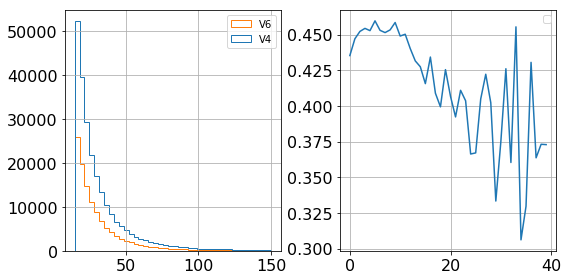

No handles with labels found to put in legend.


ZGToLLG


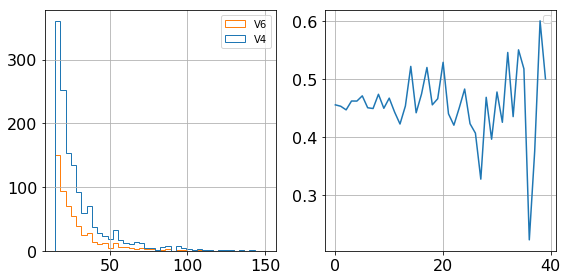

DYJets


No handles with labels found to put in legend.


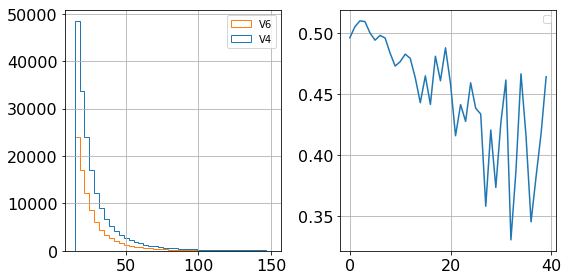

/home/jcordero/anaconda3/envs/CMSenv/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in true_divide
No handles with labels found to put in legend.


TTTo2L2Nu


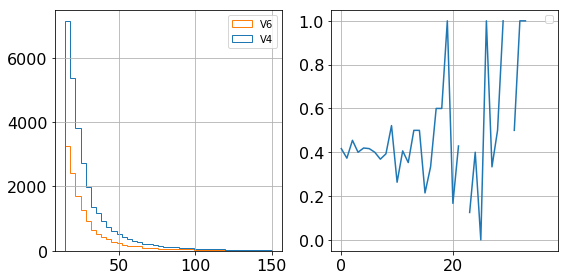

No handles with labels found to put in legend.


WWTo2L2Nu


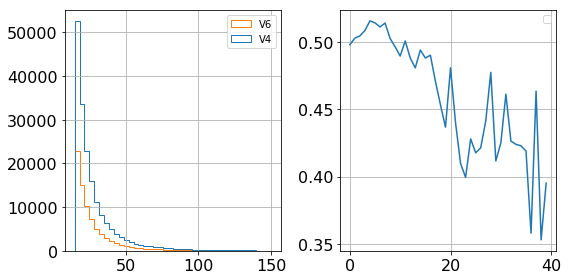

WJets


IndexError: list index out of range

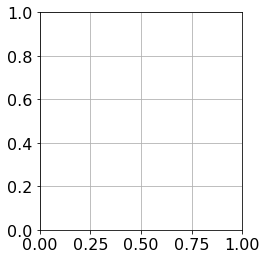

In [13]:
Version = ['V4','V6']

part = 'photonOne'
var  = 'Pt'
ph   = '' 

#part = 'dilepton'
#var  = 'M'
#ph   = '' 

ranges = [15,150]
bins   = 40

variable = part+var+ph

for n in np.arange(1,7,step=1):
    N = -n
    print(D['V6'][N].name)

    ######################
    
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    
    plt.hist([D[V][n].GetWithCuts(variable) for V in Version],
            histtype = 'step',
            range   = ranges,
            stacked = False,
            bins    = bins,
            label   = Version,
            )
    plt.legend()
    
    ######################
    
    plt.subplot(1,2,2)
    
    H = {}
    for V in Version:
        if not D[V][N].df.empty:
            H[V] = np.histogram(D[V][N].GetWithCuts(variable),
                            range = ranges,
                            bins  = bins,
                            )
        else:
            H[V] = np.ones(20)

    plt.plot(H['V6'][0]/H['V4'][0])
    plt.legend()
    plt.tight_layout()
    plt.show()
    

    


In [14]:
del D

In [12]:
data = {}

#Region = ''
#data[Region],legend,color,isData = ReadFromRegion(Plotter,pathSelections,Region)

Region = 'Sig'
data[Region],legend,color,isData = ReadFromRegion(Plotter,pathSelections,Region)

Region = 'Inv Sig'
data[Region],legend,color,isData = ReadFromRegion(Plotter,pathSelections,Region)

----- Reading WJets in Region Sig--------
----- Reading WWTo2L2Nu in Region Sig--------
----- Reading TTTo2L2Nu in Region Sig--------
----- Reading DYJets in Region Sig--------
----- Reading ZGToLLG in Region Sig--------
----- Reading DoubleMuon_2017 in Region Sig--------
0 WJets cornflowerblue
1 WWTo2L2Nu lightskyblue
2 TTTo2L2Nu lightcoral
3 DYJets plum
4 ZGToLLG pink
5 DoubleMuon_2017 k
----- Reading WJets in Region Inv Sig--------
----- Reading WWTo2L2Nu in Region Inv Sig--------
----- Reading TTTo2L2Nu in Region Inv Sig--------
----- Reading DYJets in Region Inv Sig--------
----- Reading ZGToLLG in Region Inv Sig--------
----- Reading DoubleMuon_2017 in Region Inv Sig--------
0 WJets cornflowerblue
1 WWTo2L2Nu lightskyblue
2 TTTo2L2Nu lightcoral
3 DYJets plum
4 ZGToLLG pink
5 DoubleMuon_2017 k


Error in <TFile::TFile>: file output_WJets_0.root does not exist
Error in <TFile::TFile>: file output_WJets_0.root does not exist


In [13]:

region = ""
######## CUTS ##############
for Region in ['Sig','Inv Sig']:
    Cut.PhaseSpace(
                data[Region],
                phType = phType,
                Charge = Charge,
                Region = region,
                Print  = Print,
                MVA    = MVA,
                vetoDY = vetoDY,
              )


In [14]:
Names = np.array([d.name for d in data['Sig']])

# Using the Yield of Background in the signal Region (Data-MCSignal) to use as sampling in the Sideband region

In [15]:
from iminuit import Minuit
from scipy.optimize import minimize

In [16]:
def Fit(data, Yield):
    '''
    chi2  = lambda NSig,NBkg: CHI2(Exp= data,Obs = Yield(NSig,NBkg))
    
    mP = Minuit(chi2,
                NSig        =       1, NBkg       =      1,
                error_NSig  =        1, error_NBkg =       1,
                limit_NSig  =  (0,1e9), limit_NBkg = (0,1e9),
                errordef    = 0.5,
              )  
    '''          
    
    
    chi2  = lambda NSig: Help.CHI2(Exp= data,Obs = Yield(NSig))
    
    mP = Minuit(chi2,
                NSig        =        1,
                error_NSig  =        1,
                limit_NSig  =  (0,1e9),
                errordef    = 0.5,
              )  
    
    mP.migrad()
    
    return mP

# Extracting Ich in sideband region using fit in the Signal Region, binned in Eta and Another variable

In [32]:
part = ['']
var = ['']
ph = ''

IchRanges = {}

for p in part:
    for v in var:
        print('---------',p+v+ph,'-----------')
        IchRanges[p+v+ph] = pd.read_csv(pathSelections+'/OptimalIchRange/IchRange.csv')

---------  -----------


In [18]:
part = ['photonOne','leptonOne','leptonTwo']
var = ['Pt']
ph = ''

IchRanges = {}

for p in part:
    for v in var:
        print('---------',p+v+ph,'-----------')
        IchRanges[p+v+ph] = pd.read_csv(pathSelections+'/OptimalIchRange/'+p+v+ph+'.csv')

--------- photonOnePt -----------


FileNotFoundError: [Errno 2] File b'/home/jcordero/CMS/data_2017/rereco/SMP_ZG/Files/mumug/V6_lPhoton/Reduced/OptimalIchRange/photonOnePt.csv' does not exist: b'/home/jcordero/CMS/data_2017/rereco/SMP_ZG/Files/mumug/V6_lPhoton/Reduced/OptimalIchRange/photonOnePt.csv'

In [ ]:
part = ['dilepton','llg']
var = ['Pt','M']
ph = ''


for p in part:
    for v in var:
        print('---------',p+v+ph,'-----------')
        IchRanges[p+v+ph] = pd.read_csv(pathSelections+'/OptimalIchRange/'+p+v+ph+'.csv')

In [ ]:
part = ['dilepton','l1Photon','l2Photon','dileptonPhoton']
var  = ['DEta','DPhi','DR']

ph   = ''

for p in part:
    for v in var:
        print('---------',p+v+ph,'-----------')
        IchRanges[p+v+ph] = pd.read_csv(pathSelections+'/OptimalIchRange/'+p+v+ph+'.csv')

In [20]:
def ExtractFitValues(data,
                     part,var,ph,
                     IchRanges):
    
    ## Initial Cuts ###########
    
    InitialCuts = {}
    for Region in ['Sig','Inv Sig']:
        InitialCuts[Region] = {}
        for d in data[Region]:
            InitialCuts[Region][d.name] = d.cuts
    
    ## Variable Def ##############

    h = {}
    h['Sig']     = {}
    h['Inv Sig'] = {}

    Template = {}
    Yield    = {}
    for d in data['Sig']:
        Template[d.name] = {}
        Yield[d.name]    = {}
    
    ## Set Hist Based on Bins ########

    Region = 'Sig'
    for i in range(len(data[Region])):
        h[Region][data[Region][i].name],Bins = Help.FindRegionInSideband(data[Region][i],part=part,var=var,ph=ph)

    ## Set Hist for BKG Based on Bins ########

    Region = 'Inv Sig'

    DYJets = np.array(data[Region])[Names=='DYJets'][0]

    for i in range(len(data[Region])):
        h[Region][data[Region][i].name],Bins = Help.FindRegionInSideband(data[Region][i],part=part,var=var,ph=ph)


    #Ich = DYJets.GetWithCuts('photonOneIch')   
    Ich = DYJets.df.photonOneIch   

    #############

    FIT= {}


    for eta in Bins['photonOneEta']:
        etaS = str(eta)

        #####################
        FIT[etaS] = {}

        for d in data['Sig']:
            Template[d.name][etaS] = {}
            Yield[d.name][etaS]    = {}

        #####################

        for var1,j in zip(Bins[part+var+ph],range(len(Bins[part+var+ph]))):
            var1S = str(var1)

            ############################

            ichConvert = Help.ConvertString2Float(IchRanges[''][etaS][0])
            ichLow  = ichConvert[0]
            ichHigh = ichConvert[1]

            #############################
            Region = 'Inv Sig'

            DYJets.ResetCuts(InitialCuts[Region]['DYJets'])
            DYJets.AddCuts(np.logical_and(Ich > ichLow, Ich < ichHigh))
            h[Region]['DYJets'],Bins = Help.FindRegionInSideband(DYJets,part=part,var=var,ph=ph)

            #####################
            
            for d in data['Sig']:
                T = int(np.sum(h['Sig'][d.name][etaS][var1S][0]))
                Yield[d.name][etaS][var1S] = T
                if T == 0:
                    Template[d.name][etaS][var1S] = h['Sig'][d.name][etaS][var1S][0]
                else:
                    Template[d.name][etaS][var1S] = h['Sig'][d.name][etaS][var1S][0]/T

            #####################

            T = h['Inv Sig']['DYJets'][etaS][var1S][0]

            if np.sum(T) == 0:
                Template['DYJets'][etaS][var1S] = T
            else:
                Template['DYJets'][etaS][var1S] = T/np.sum(T)

            ##############################################

            NData = int(np.sum(h['Sig']['DoubleMuon_2017'][etaS][var1S][0]))
            
            
            Temp = lambda NSig :  NSig                            * np.array(Template[  'ZGToLLG'][etaS][var1S]) + \
                                  Yield[    'WJets'][etaS][var1S] * np.array(Template[    'WJets'][etaS][var1S]) + \
                                  Yield['WWTo2L2Nu'][etaS][var1S] * np.array(Template['WWTo2L2Nu'][etaS][var1S]) + \
                                  Yield['TTTo2L2Nu'][etaS][var1S] * np.array(Template['TTTo2L2Nu'][etaS][var1S]) + \
                                  (NData-NSig)                    * np.array(Template[   'DYJets'][etaS][var1S])

            ###########
            # FITTING
            
            fit = Fit(data = h['Sig']['DoubleMuon_2017'][etaS][var1S][0],
                      Yield = Temp,
                     )

            NYield = fit.values
            NSigma = fit.errors
            ###########

            FIT[etaS][var1S] = [NYield,NSigma]
            
            '''
            print(etaS,var1S)
            print(' NSig: ' ,NYield,
                  ' Yield: ',int(Yield['ZGToLLG'][etaS][var1S]),
                  #' R: '    ,round(NSigYield/Yield['ZGToLLG'][etaS][var1S],2),
                  '\n',
                  ' Yield: ',int(Yield['DYJets'][etaS][var1S]),
                  ' DYJets: ' ,int(np.sum(h['Sig']['DYJets'][etaS][var1S][0])),
                  ' DATA: ' ,int(np.sum(h['Sig']['DoubleMuon_2017'][etaS][var1S][0])),
                  '\n',
                 )
            '''
            
            for Region in ['Sig','Inv Sig']:
                for d in data[Region]:
                    d.ResetCuts(InitialCuts[Region][d.name])
        
    #########################################
    
    for Region in ['Sig','Inv Sig']:
        for d in data[Region]:
            d.ResetCuts(InitialCuts[Region][d.name])
        
    #########################################
    
    return FIT, h, Template, Bins

In [21]:
def GenerateBkg(part,var,ph,
                FIT,Bins,h):
    Signal, Background = {},{}
    SigmaS, SigmaB = {},{}

    for eta in Bins['photonOneEta']: 
        etaS = str(eta)

        Signal[etaS]     = []
        Background[etaS] = []
        SigmaS[etaS] = []
        SigmaB[etaS] = []
        for var1, j in zip(Bins[part+var+ph], range(len(Bins[part+var+ph]))):
            ############
            
            var1S = str(var1)

            NSig = FIT[etaS][var1S][0][0]
            #NBkg = FIT[etaS][var1S][0][1]
            NBkg = np.sum(h['Sig']['DoubleMuon_2017'][etaS][var1S][0])- NSig

            SigmaSig = FIT[etaS][var1S][1][0]
            SigmaBkg = 0#FIT[etaS][var1S][1][0]
            
            ############
            
            Signal[etaS]    .append(NSig)
            Background[etaS].append(NBkg)

            SigmaS[etaS].append(SigmaSig)
            SigmaB[etaS].append(SigmaBkg)


    return Signal, Background, SigmaS, SigmaB 

In [22]:
def HistogramingVariables(
                         data,
                         part,var,ph,
                         Bins, 
                         Signal, Background,
                         DataDriven = False,
                         ZGDataDriven = False,
                         ):    
    VAR,X = {},{}
    ranges,B = Help.GET_RangeBins(part,var,ph, Blind=False,Plotting=Plotting)

    ####################
    
    InitialCuts = {}
    for d in data:
        InitialCuts[d.name] = d.cuts
        
    ############################
    
    for eta in Bins['photonOneEta']: 
        etaS = str(eta)

        VAR[etaS] = []
        X[etaS]   = []
        for d in data:
            d.ResetCuts(InitialCuts[d.name])
            
            if not d.df.empty:
                d.AddCuts(np.logical_and(np.abs(d.df.photonOneEta) > eta[0],
                                         np.abs(d.df.photonOneEta) < eta[1]
                                        )
                         )

            
            HH = Plotter.BinnedHist(data = d, var = var, part = part)
            

            if DataDriven:
                INDB = np.logical_not(np.isnan(Background[etaS]))
            else:
                INDB = np.ones(len(HH[0]),dtype=np.bool)

            VAR[etaS].append(HH[0][INDB])
            IND = list(INDB)
            IND.append(True)
            IND = np.array(IND)
            X[etaS].append(HH[1][IND])

        xc = []
        for x in X[etaS]:
            xc.append((x[1:]+x[:-1])/2)
            
        X[etaS]   = np.array(X[etaS])
        VAR[etaS] = np.array(VAR[etaS])
        
        if DataDriven:
            VAR[etaS][Names=='DYJets'] = np.array(Background[etaS])[INDB]
            if ZGDataDriven:
                VAR[etaS][Names=='ZGToLLG'] = np.array(Signal[etaS])[INDB]
                

    for d in data:
        d.ResetCuts(InitialCuts[d.name])
    
    return VAR,X,ranges

In [23]:
def Plotting(data,part,var,ph,
             IchRanges,
             DataDriven = True,ZGDataDriven = False):
    
    FIT,h,Template = None,None,None
    
    if DataDriven:
        FIT,h,Template,Bins = ExtractFitValues(data,part,var,ph,IchRanges)        
        Sig,Background, SigmaS, SigmaB  = GenerateBkg(part,var,ph,FIT,Bins,h)
    else: 
        h,Bins = Help.FindRegionInSideband(data['Sig'][-1],part=part,var=var,ph=ph)
        Sig = None
        Background = None



    
    VAR,X,ranges = HistogramingVariables(data = data['Sig'],
                                          part=part,var=var,ph=ph,
                                          Bins=Bins, 
                                          Signal = Sig, Background = Background,
                                          DataDriven = DataDriven,
                                          ZGDataDriven = ZGDataDriven,
                                        ) 
    PlotVars = {}
    for log in [True,False]:
        for eta,phType in zip(Bins['photonOneEta'],['EB','EE']): 
            etaS = str(eta)

            PlotVars[etaS] = Plotter.Plot_Bin(
                                         VAR    = VAR[etaS], wei    =  VAR[etaS],
                                         label  =     Names, colors =      color,
                                         ranges =    ranges, bins   = X[etaS][0],
                                         var              = var,
                                         part             = part,
                                         signalInclude    = True,
                                         stacked          = True,
                                         density          = False,
                                         log              = log,
                                         Plotting         = True,
                                         Blind            = True,
                                         StatInclude      = False,
                                         index            = 'Template_'+phType,
                                        );

    return h,Template,FIT,Bins, Sig, Background, PlotVars

In [24]:
def PLOT(DataDriven=True,ZGDataDriven=False, PlotFits = True,PlotType='All'):
                  
    if not DataDriven:
        PlotFits      = False
        SaveTemplates = False
    else:
        SaveTemplates = True
        
    ##############################
    
    if PlotType == 'Pt' or PlotType == 'All':
        part = ['leptonOne','leptonTwo','photonOne','dilepton','llg']
        var = ['Pt']
        ph = ''
        for p in part:
            for v in var:
                print('-----------',p+v,'-----------')
                h,Template,FIT,Bins,Sig, Bkg, PlotVars = Plotting(data,part=p,var=v,ph=ph,IchRanges=IchRanges,DataDriven = DataDriven,ZGDataDriven = ZGDataDriven)        
                if PlotFits:
                    PlotTemplateFits(data,part=p,var=v,ph=ph,h=h,Template=Template,FIT=FIT,Bins=Bins)
                if SaveTemplates:
                    RecordTemplates(path,Template,part=p,var=v,ph=ph)
                    RecordFits(path,FIT,part=p,var=v,ph=ph)
                

    ##############################

    if PlotType == 'M' or PlotType == 'All':
        part = ['dilepton','llg']
        var = ['M']
        ph = ''
        for p in part:
            for v in var:
                print('-----------',p+v,'-----------')
                h,Template,FIT,Bins,Sig, Bkg, PlotVars = Plotting(data,part=p,var=v,ph=ph,IchRanges=IchRanges,DataDriven = DataDriven,ZGDataDriven = ZGDataDriven)
                if PlotFits:
                    PlotTemplateFits(data,part=p,var=v,ph=ph,h=h,Template=Template,FIT=FIT,Bins=Bins) 
                if SaveTemplates:
                    RecordTemplates(path,Template,part=p,var=v,ph=ph)
                    RecordFits(path,FIT,part=p,var=v,ph=ph)
                
    ##############################
    if PlotType == 'Ang' or PlotType == 'All':
        part = ['dilepton','l1Photon','l2Photon','dileptonPhoton']
        var = ['DEta','DPhi','DR']
        ph = ''
        
        for p in part:
            for v in var:
                print('-----------',p+v,'-----------')
                h,Template,FIT,Bins,Sig, Bkg, PlotVars = Plotting(data,part=p,var=v,ph=ph,IchRanges=IchRanges,DataDriven = DataDriven, ZGDataDriven = ZGDataDriven)
                if PlotFits:
                    PlotTemplateFits(data,part=p,var=v,ph=ph,h=h,Template=Template,FIT=FIT,Bins=Bins)
                if SaveTemplates:
                    RecordTemplates(path,Template,part=p,var=v,ph=ph)
                    RecordFits(path,FIT,part=p,var=v,ph=ph)

In [25]:
def PlotTemplateFits(data,part,var,ph,h,Template,FIT,Bins):
    Names = np.array([d.name for d in data['Sig']])
    DYJets = np.array(data['Inv Sig'])[Names=='DYJets'][0]
    InitialCuts = DYJets.cuts
    
    for eta in Bins['photonOneEta']: 
        etaS = str(eta)
        if etaS == '[0, 1.4442]':
            phType = 'EB'
        else:
            phType = 'EE'

        fig = plt.figure(figsize=(5*4,2*len(Bins[part+var+ph])))


        print(etaS)
        for var1, j in zip(Bins[part+var+ph], range(len(Bins[part+var+ph]))):
            var1S = str(var1)

            #plt.subplot( np.ceil(len(IchRanges[part+var+ph][etaS])/4.0),4, j+1)
            plt.subplot(np.ceil(len(Bins[part+var+ph])/4),4, j+1)

            #####################################

            ichConvert = Help.ConvertString2Float(IchRanges[''][etaS][0])
            ichLow  = ichConvert[0]
            ichHigh = ichConvert[1]
            

            DYJets.ResetCuts(InitialCuts)
            Ich = DYJets.df.photonOneIch
            DYJets.AddCuts(np.logical_and(Ich > ichLow, Ich < ichHigh))
            h['Inv Sig']['DYJets'],Bins = Help.FindRegionInSideband(DYJets,part=part,var=var,ph=ph)

            ######################################

            Temp = lambda NSig:  NSig                                          * np.array(Template[  'ZGToLLG'][etaS][var1S]) + \
                                 np.sum(h['Sig'][    'WJets'][etaS][var1S][0]) * np.array(Template[    'WJets'][etaS][var1S]) + \
                                 np.sum(h['Sig']['WWTo2L2Nu'][etaS][var1S][0]) * np.array(Template['WWTo2L2Nu'][etaS][var1S]) + \
                                 np.sum(h['Sig']['TTTo2L2Nu'][etaS][var1S][0]) * np.array(Template['TTTo2L2Nu'][etaS][var1S]) + \
                                 (NData-NSig)                                  * np.array(Template[   'DYJets'][etaS][var1S])

            NData = np.sum(h['Sig']['DoubleMuon_2017'][etaS][var1S][0])
            NSig  = FIT[etaS][var1S][0][0]
            #NBkg  = FIT[etaS][var1S][0][1]
            NBkg = NData-NSig

            ####################################################################

            x = np.array(h['Sig']['DoubleMuon_2017'][etaS][var1S][1])
            xc = (x[:-1] + x[1:])/2
            bins = np.arange(-1,1.1,step=0.1)


            H = plt.plot(
                    xc,h['Sig']['DoubleMuon_2017'][etaS][var1S][0],
                    color     = 'k',
                    linewidth = 0,
                    marker    = 'o',
                    label     = 'Data',
                    )
     
            plt.hist(
                    xc,
                    bins      = bins,
                    #weights   = Temp(NSig,NBkg),
                    weights   = Temp(NSig),
                    color     = 'b',
                    histtype  = 'step',
                    linewidth = 1.5,
                    label     = 'Template',
                    )

            plt.hist(
                    xc,
                    bins      = bins,
                    weights   = NSig*np.array(Template['ZGToLLG'][etaS][var1S]),
                    color     = 'r',
                    histtype  = 'step',
                    linewidth = 1.5,
                    label     = 'Signal',
                    )

            plt.hist(
                    xc,
                    bins      = bins,
                    weights   = NBkg*np.array(Template['DYJets'][etaS][var1S]),
                    color     = 'g',
                    histtype  = 'step',
                    linewidth = 1.5,
                    label     = 'Bkg',
                    )       
            
            R = round(np.sum(h['Sig']['DoubleMuon_2017'][etaS][var1S][0])/(NBkg+np.sum(h['Sig']['ZGToLLG'][etaS][var1S][0])), 2)
            
            Title = 'Ich [' + str(ichLow) +', '+ str(ichHigh)+']'\
                    ' Var [' + str(round(var1[0],2)) +', '+ str(round(var1[1],2)) +']'\
                    ' R: ' + str(R) + \
                    ' NB:' +str(round(NBkg,0))
            plt.title(Title,fontsize=12)
            plt.legend()

            ax = plt.gca()

        plt.tight_layout()
        plt.show()
        
        if etaS == '[0, 1.4666]' or etaS == '[-1.4666, 0]':
            phType = 'EB'
        elif etaS == '[1.4666, 2.5]' or etaS == '[-2.5, -1.4666]':
            phType = 'EE'
            
        fig.savefig(figpath+'MVAFits_'+part+var+ph+'_'+phType+'.png')

In [26]:
def RecordTemplates(path,Template,
                   part='',var='',ph=''):
    for tempType in ['ZGToLLG','DYJets']:
        for eta in Template['ZGToLLG']:
            if eta == '[0, 1.4666]':
                phType = 'EB'
            else:
                phType = 'EE'
                
            MVABins = Help.BinFormat(Bins = (np.arange(-1,1.1,step=0.1)), Type='ranges')
            MVABins = [str(mva) for mva in MVABins]
            df = pd.DataFrame(Template[tempType][eta],
                              columns = list(Template[tempType][eta].keys()),
                              index = MVABins,
                             )


            df.to_csv(path+'/Templates/Templates_'+tempType+'_'+part+var+ph+'_'+phType+'.csv')

In [27]:
def RecordFits(path,Fits,
                   part='',var='',ph=''):

    for eta in Fits:
        if eta == '[0, 1.4666]':
            phType = 'EB'
        else:
            phType = 'EE'

        FIT = {}
        FIT['NSig'] = []
        FIT['NBkg'] = []
        FIT['NSigSigma'] = []
        FIT['NBkgSigma'] = []
        NSig,NBkg,NSigmaSig, NSigmaBkg = [],[],[],[]
        for var1 in list(Fits[eta].keys()):
            FIT['NSig'].append(Fits[eta][var1][0][0])
            FIT['NBkg'].append(Fits[eta][var1][0][1])
            
            FIT['NSigSigma'].append(Fits[eta][var1][1][0])
            FIT['NBkgSigma'].append(Fits[eta][var1][1][1])
            

        df = pd.DataFrame(FIT,
                          columns = list(FIT.keys()),
                          index = list(Fits[eta].keys()),
                         )


        df.to_csv(path+'/Fits/Fit_'+part+var+ph+'_'+phType+'.csv')

In [28]:
def SaveDataMC(part,var,ph,Bins,PlotVars,Plot = False):
    ranges = [-0.4,1]
    bins = np.arange(ranges[0],ranges[1],step=0.05)

    DataMC = {}
    DataMCerr = {}

    for eta in Bins['photonOneEta']:
        etaS = str(eta)
        if etaS == '[0, 1.4442]':
            phType = 'EB'
        else:
            phType = 'EE'

        DataMC[etaS]    = PlotVars[etaS][-2]
        DataMCerr[etaS] = PlotVars[etaS][-1]

    ############################################
    R = pd.DataFrame()
    R['var'] = Bins[part+var+ph]
    for k in DataMC.keys():
        print(len(R['var']),len(DataMC[k]))
        R[k] = DataMC[k]

    df = pd.DataFrame(R)

    df.to_csv(path+'DataMC/'+part+var+ph+'_Template.csv')
    ############################################
    R = pd.DataFrame()
    R['var'] = Bins[part+var+ph]
    for k in DataMCerr.keys():
        R[k] = DataMCerr[k]

    df = pd.DataFrame(R)

    df.to_csv(path+'DataMC/'+part+var+ph+'_Template_Err.csv')
    ############################################
    if Plot:
        plt.figure(figsize = (8,8))
        plt.hist(
                DataMC[etaS][:int(len(DataMC[etaS])/2)],
                bins      = bins,
                range     = ranges,
                linewidth = 1.7,
                histtype  = 'step',
                #label     = etaS,
                );
        plt.hist(
                DataMC[etaS][int(len(DataMC[etaS])/2):],
                bins      = bins,
                range     = ranges,
                linewidth = 1.7,
                histtype  = 'step',
                #label     = etaS,
                );
        plt.xlabel(r'$\frac{Data}{MC}$')
        plt.title(phType)
        plt.legend()
    return 

----------- leptonOnePt -----------
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 548.3611453811644
[0, 1.4442] [26.0, 28.0] 1512.0195785554724
[0, 1.4442] [28.0, 30.0] 2186.3646232518226
[0, 1.4442] [30.0, 32.0] 2989.2352529304553
[0, 1.4442] [32.0, 34.0] 3739.2263583472645
[0, 1.4442] [34.0, 36.0] 4508.0398852794215
[0, 1.4442] [36.0, 38.0] 4786.865072457607
[0, 1.4442] [38.0, 40.0] 4846.743578771336
[0, 1.4442] [40.0, 42.0] 4657.798840721115
[0, 1.4442] [42.0, 44.0] 3858.5577475395567
[0, 1.4442] [44.0, 46.0] 3273.6024977517545
[0, 1.4442] [46.0, 48.0] 2784.214402631088
[0, 1.4442] [48.0, 50.0] 2372.837933488015
[0, 1.4442] [50.0, 52.0] 2050.1029133471225
[0, 1.4442] [52.0, 54.0] 1811.9646877170837
[0, 1.4442] [54.0, 56.0] 1509.7419311814829
[0, 1.4442] [56.0, 58.0] 1294.0137992497678
[0, 1.4442] [58.0, 60.0] 1134.7015984015577
[0, 1.4442] [60.0, 62.0] 989.8489349465257
[0, 1.4442] [62.0, 64.0] 844.7663183252165
[0, 1.4442] [64.0, 66.0] 738.5552054649202
[0, 1.4442] [66.0, 68.0] 61

[1.5666, 2.5] [128.0, 130.0] 0.2601496570524862
[1.5666, 2.5] [130.0, 132.0] 0.18210723109787658
[1.5666, 2.5] [132.0, 134.0] 0.5608834707418601
[1.5666, 2.5] [134.0, 136.0] 0.3776084766362894
[1.5666, 2.5] [136.0, 138.0] 0.39113386141673784
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 13.030981066780022
[0, 1.4442] [28.0, 30.0] 13.004053462198515
[0, 1.4442] [30.0, 32.0] 9.084410682688393
[0, 1.4442] [32.0, 34.0] 27.99771059651099
[0, 1.4442] [34.0, 36.0] 28.818035042960098
[0, 1.4442] [36.0, 38.0] 30.29099725176092
[0, 1.4442] [38.0, 40.0] 22.117457145684252
[0, 1.4442] [40.0, 42.0] 19.67792415227634
[0, 1.4442] [42.0, 44.0] 26.316762374897458
[0, 1.4442] [44.0, 46.0] 63.225918123534534
[0, 1.4442] [46.0, 48.0] 39.85562168351719
[0, 1.4442] [48.0, 50.0] 51.24475465985166
[0, 1.4442] [50.0, 52.0] 49.84224802205242
[0, 1.4442] [52.0, 54.0] 69.29743437631085
[0, 1.4442] [54.0, 56.0] 53.7502329451847
[0, 1.4442] [56.0, 58

[1.5666, 2.5] [30.0, 32.0] 16.4859961395629
[1.5666, 2.5] [32.0, 34.0] 28.127458135736784
[1.5666, 2.5] [34.0, 36.0] 26.780280919940136
[1.5666, 2.5] [36.0, 38.0] 36.10789127312064
[1.5666, 2.5] [38.0, 40.0] 46.65190181187904
[1.5666, 2.5] [40.0, 42.0] 47.76876406514514
[1.5666, 2.5] [42.0, 44.0] 40.15788510788119
[1.5666, 2.5] [44.0, 46.0] 40.37807243815081
[1.5666, 2.5] [46.0, 48.0] 40.49018179584865
[1.5666, 2.5] [48.0, 50.0] 38.37379331639712
[1.5666, 2.5] [50.0, 52.0] 31.557642213506124
[1.5666, 2.5] [52.0, 54.0] 28.7509851750158
[1.5666, 2.5] [54.0, 56.0] 29.564556325956527
[1.5666, 2.5] [56.0, 58.0] 21.58160669258844
[1.5666, 2.5] [58.0, 60.0] 25.699155185594183
[1.5666, 2.5] [60.0, 62.0] 20.77009094464347
[1.5666, 2.5] [62.0, 64.0] 17.810365086018212
[1.5666, 2.5] [64.0, 66.0] 22.940269640771294
[1.5666, 2.5] [66.0, 68.0] 25.289561991826957
[1.5666, 2.5] [68.0, 70.0] 15.504418848298414
[1.5666, 2.5] [70.0, 72.0] 8.074197067569806
[1.5666, 2.5] [72.0, 74.0] 13.325942629112967
[1

[1.5666, 2.5] [58.0, 60.0] 109.13173415820951
[1.5666, 2.5] [60.0, 62.0] 79.73859961760762
[1.5666, 2.5] [62.0, 64.0] 79.42425893593999
[1.5666, 2.5] [64.0, 66.0] 71.19417503711443
[1.5666, 2.5] [66.0, 68.0] 34.26245636351519
[1.5666, 2.5] [68.0, 70.0] 45.6787968517699
[1.5666, 2.5] [70.0, 72.0] 71.82384702053884
[1.5666, 2.5] [72.0, 74.0] 26.743014758150682
[1.5666, 2.5] [74.0, 76.0] 45.9705888124685
[1.5666, 2.5] [76.0, 78.0] 46.951813573090995
[1.5666, 2.5] [78.0, 80.0] 26.655689650150837
[1.5666, 2.5] [80.0, 82.0] 37.72829564914751
[1.5666, 2.5] [82.0, 84.0] 33.42922066646676
[1.5666, 2.5] [84.0, 86.0] 16.426998908216476
[1.5666, 2.5] [86.0, 88.0] -1.3040173745808161
[1.5666, 2.5] [88.0, 90.0] 19.926675551196816
[1.5666, 2.5] [90.0, 92.0] 26.538903986526627
[1.5666, 2.5] [92.0, 94.0] -4.326949564194315
[1.5666, 2.5] [94.0, 96.0] 20.38375518964572
[1.5666, 2.5] [96.0, 98.0] 2.2293290721833867
[1.5666, 2.5] [98.0, 100.0] 17.207163776835987
[1.5666, 2.5] [100.0, 102.0] 14.606584182687

/home/jcordero/CMS/JYCMCMS/SMP_ZG/python/Plotter/Helper.py:1699: RuntimeWarning: invalid value encountered in true_divide
  return np.sum((Exp-Obs)**2/np.sqrt(Exp))


[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.55711872558805
[0, 1.4442] [6

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.55711872558805
[0, 1.4442] [68.0, 70.0] 208.59536748519835

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.55711872558805
[0, 1.4442] [68.0, 70.0] 208.59536748519835
[0, 1.4442] [70.0, 72.0] 177.4721254906508
[0, 1.4442] [72.0, 74.0] 185.52308194045864
[0, 1.4442] [74.0, 76.0] 154.62325917845982
[0, 1.4442] [76.0, 78.0] 132.47353417262437
[0, 1.4442] [78.0, 80.0] 130.27501906061707
[0, 1.4442] [80.0, 82.0] 102.01375411421768
[0, 1.4442] [82.0, 84.0] 84.51669203946626
[0, 1.4442] [84.0, 86.0] 87.9295430892531
[0, 1.4442] [86.0, 88.0] 65.67467618297161
[0, 1.4442] [88.0, 90.0] 68.51460096189707
[0, 1.4442] [90.0, 92.0] 21.20813002836783
[0, 1.4442] [92.0, 94.0] 58.5157053433003


[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.55711872558805
[0, 1.4442] [6

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.55711872558805
[0, 1.4442] [68.0, 70.0] 208.59536748519835
[0, 1.4442] [70.0, 72.0] 177.4721254906508
[0, 1.4442] [72.0, 74.0] 185.52308194045864

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[1.5666, 2.5] [72.0, 74.0] 165.23727782496465
[1.5666, 2.5] [74.0, 76.0] 187.7834679238486
[1.5666, 2.5] [76.0, 78.0] 208.37334022735197
[1.5666, 2.5] [78.0, 80.0] 116.751390060843
[1.5666, 2.5] [80.0, 82.0] 96.39908451461515
[1.5666, 2.5] [82.0, 84.0] 111.95851382999857
[1.5666, 2.5] [84.0, 86.0] 141.89513826361605
[1.5666, 2.5] [86.0, 88.0] 116.0730119262733
[1.5666, 2.5] [88.0, 90.0] 48.78901831919982
[1.5666, 2.5] [90.0, 92.0] 54.992265113832126
[1.5666, 2.5] [92.0, 94.0] 62.19873092421717
[1.5666, 2.5] [94.0, 96.0] 56.22887232659018
[1.5666, 2.5] [96.0, 98.0] 66.21582462614121
[1.5666, 2.5] [98.0, 100.0] 52.03724196950161
[1.5666, 2.5] [100.0, 102.0] 57.2058058724307
[1.5666, 2.5] [102.0, 104.0] 9.174967148804255
[1.5666, 2.5] [104.0, 106.0] 22.773115414568895
[1.5666, 2.5] [106.0, 108.0] 36.41203165213844
[1.5666, 2.5] [108.0, 110.0] 6.406174806629908
[1.5666, 2.5] [110.0, 112.0] 31.596031053317247
[1.5666, 2.5] [112.0, 114.0] -0.2654447174568342
[1.5666, 2.5] [114.0, 116.0] 16.4

[1.5666, 2.5] [28.0, 30.0] 91.84807745504826
[1.5666, 2.5] [30.0, 32.0] 133.84510253694447
[1.5666, 2.5] [32.0, 34.0] 117.2392840839636
[1.5666, 2.5] [34.0, 36.0] 185.0010312232698
[1.5666, 2.5] [36.0, 38.0] 173.84406294789486
[1.5666, 2.5] [38.0, 40.0] 229.60534040869305
[1.5666, 2.5] [40.0, 42.0] 265.1150419807863
[1.5666, 2.5] [42.0, 44.0] 356.5497670065893
[1.5666, 2.5] [44.0, 46.0] 460.6735263285457
[1.5666, 2.5] [46.0, 48.0] 432.04135717190394
[1.5666, 2.5] [48.0, 50.0] 490.455151813765
[1.5666, 2.5] [50.0, 52.0] 596.0771526569613
[1.5666, 2.5] [52.0, 54.0] 522.1729464166468
[1.5666, 2.5] [54.0, 56.0] 529.0613866793815
[1.5666, 2.5] [56.0, 58.0] 473.7959740634955
[1.5666, 2.5] [58.0, 60.0] 382.85174385902127
[1.5666, 2.5] [60.0, 62.0] 456.21112464919486
[1.5666, 2.5] [62.0, 64.0] 390.77573209784185
[1.5666, 2.5] [64.0, 66.0] 334.6220074307668
[1.5666, 2.5] [66.0, 68.0] 342.12896311864336
[1.5666, 2.5] [68.0, 70.0] 241.2789448800301
[1.5666, 2.5] [70.0, 72.0] 276.7256851394315
[1.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147.539895272977
[0, 1.4442] [68.0, 70.0] 1046.788464323437
[0, 1.4442] [70.0, 72.0] 866.0502416648546
[0, 1.4442] [72.0, 74.0] 789.2851781377116
[0, 1.4442] [74.0, 76.0] 603.8351296722022
[0, 1.4442] [76.0, 78.0] 501.2144479554647
[0, 1.4442] [78.0, 80.0] 481.9709052485125
[0, 1.4442] [80.0, 82.0] 397.8001418499516
[0, 1.4442] [82.0, 84.0] 364.6062104666147
[0, 1.4442] [84.0, 86.0] 286.582359311643
[0, 1.4442] [86.0, 88.0] 353.08646228514283
[0, 1.4442] [88.0, 90.0] 249.04788105193074
[0, 1.4442] [90.0, 92.0] 187.58510953213897
[0, 1.4442] [92.0, 94.0] 168.58105130948604


[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147.539895272977
[0, 1.4442] [68.0, 70.0] 1046.788464323437
[0, 1.4442] [70.0, 72.0] 866.0502416648546
[0, 1.4442] [72.0, 74.0] 789.2851781377116
[0, 1.4442] [74.0, 76.0] 603.8351296722022
[0, 1.4442] [76.0, 78.0] 501.2144479554647
[0, 1.4442] [78.0, 80.0] 481.9709052485125
[0, 1.4442] [80.0, 82.0] 397.8001418499516
[0, 1.4442] [82.0, 84.0] 364.6062104666147
[0, 1.4442] [84.0, 86.0] 286.582359311643
[0, 1.4442] [86.0, 88.0] 353.08646228514283
[0, 1.4442] [88.0, 90.0] 249.04788105193074
[0, 1.4442] [90.0, 92.0] 187.58510953213897


[0, 1.4442] [90.0, 92.0] 187.58510953213897
[0, 1.4442] [92.0, 94.0] 168.58105130948604
[0, 1.4442] [94.0, 96.0] 202.45798904772548
[0, 1.4442] [96.0, 98.0] 136.16813988086184
[0, 1.4442] [98.0, 100.0] 134.45943104835928
[0, 1.4442] [100.0, 102.0] 87.57536344888184
[0, 1.4442] [102.0, 104.0] 146.4822634329665
[0, 1.4442] [104.0, 106.0] 96.25904419789715
[0, 1.4442] [106.0, 108.0] 116.22274195488014
[0, 1.4442] [108.0, 110.0] 94.19603559286192
[0, 1.4442] [110.0, 112.0] 67.56401852837458
[0, 1.4442] [112.0, 114.0] 50.59908780392374
[0, 1.4442] [114.0, 116.0] 89.29622416990176
[0, 1.4442] [116.0, 118.0] 17.49610251241317
[0, 1.4442] [118.0, 120.0] 25.729219940337334
[0, 1.4442] [120.0, 122.0] 19.426076421876015
[0, 1.4442] [122.0, 124.0] 42.014583461969295
[0, 1.4442] [124.0, 126.0] 13.18021792199956
[0, 1.4442] [126.0, 128.0] 35.59700168404323
[0, 1.4442] [128.0, 130.0] 42.23717046706171
[0, 1.4442] [130.0, 132.0] 32.978538627440436
[0, 1.4442] [132.0, 134.0] 27.24604778458091
[0, 1.444

[1.5666, 2.5] [98.0, 100.0] 52.03724196950161
[1.5666, 2.5] [100.0, 102.0] 57.2058058724307
[1.5666, 2.5] [102.0, 104.0] 9.174967148804255
[1.5666, 2.5] [104.0, 106.0] 22.773115414568895
[1.5666, 2.5] [106.0, 108.0] 36.41203165213844
[1.5666, 2.5] [108.0, 110.0] 6.406174806629908
[1.5666, 2.5] [110.0, 112.0] 31.596031053317247
[1.5666, 2.5] [112.0, 114.0] -0.2654447174568342
[1.5666, 2.5] [114.0, 116.0] 16.42239710607819
[1.5666, 2.5] [116.0, 118.0] -0.2501227467548919
[1.5666, 2.5] [118.0, 120.0] 23.015243748254825
[1.5666, 2.5] [120.0, 122.0] 15.465110256076432
[1.5666, 2.5] [122.0, 124.0] 7.478325795510694
[1.5666, 2.5] [124.0, 126.0] 9.571523451680545
[1.5666, 2.5] [126.0, 128.0] 5.689459229667819
[1.5666, 2.5] [128.0, 130.0] -0.25131275377299467
[1.5666, 2.5] [130.0, 132.0] 1.6714392418130717
[1.5666, 2.5] [132.0, 134.0] 7.108969496260718
[1.5666, 2.5] [134.0, 136.0] 6.858089447022749
[1.5666, 2.5] [136.0, 138.0] 5.411487470321283
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 18.119075286333434
[1.5666, 2.5] [26.0, 28.0] 31.891696181839745
[1.5666, 2.5] [28.0, 30.0] 91.84807745504826
[1.5666, 2.5] [30.0, 32.0] 133.84510253694447
[1.5666, 2.5] [32.0, 34.0] 117.2392840839636
[1.5666, 2.5] [34.0, 36.0] 185.0010312232698
[1.5666, 2.5] [36.0, 38.0] 173.84406294789486
[1.5666, 2.5] [38.0, 40.0] 229.60534040869305
[1.5666, 2.5] [40.0, 42.0] 265.1150419807863
[1.5666, 2.5] [42.0, 44.0] 356.5497670065893
[1.5666, 2.5] [44.0, 46.0] 460.6735263285457
[1.5666, 2.5] [46.0, 48.0] 432.04135717190394
[1.5666, 2.5] [48.0, 50.0] 490.455151813765
[1.5666, 2.5] [50.0, 52.0] 596.0771526569613
[1.5666, 2.5] [52.0, 54.0] 522.1729464166468
[1.5666, 2.5] [54.0, 56.0] 529.0613866793815
[1.5666, 2.5] [56.0, 58.0] 473.7959740634955
[1.5666, 2.5] [58.0, 60.0] 382.85174385902127
[1.5666, 2.5] [60.0, 62.0] 456.21112464919486
[1.5666, 2.5] [62.0, 64.0] 390.77573209784185
[1.5666, 2.5] [64.0, 66.0] 334

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[1.5666, 2.5] [30.0, 32.0] 133.84510253694447
[1.5666, 2.5] [32.0, 34.0] 117.2392840839636
[1.5666, 2.5] [34.0, 36.0] 185.0010312232698
[1.5666, 2.5] [36.0, 38.0] 173.84406294789486
[1.5666, 2.5] [38.0, 40.0] 229.60534040869305
[1.5666, 2.5] [40.0, 42.0] 265.1150419807863
[1.5666, 2.5] [42.0, 44.0] 356.5497670065893
[1.5666, 2.5] [44.0, 46.0] 460.6735263285457
[1.5666, 2.5] [46.0, 48.0] 432.04135717190394
[1.5666, 2.5] [48.0, 50.0] 490.455151813765
[1.5666, 2.5] [50.0, 52.0] 596.0771526569613
[1.5666, 2.5] [52.0, 54.0] 522.1729464166468
[1.5666, 2.5] [54.0, 56.0] 529.0613866793815
[1.5666, 2.5] [56.0, 58.0] 473.7959740634955
[1.5666, 2.5] [58.0, 60.0] 382.85174385902127
[1.5666, 2.5] [60.0, 62.0] 456.21112464919486
[1.5666, 2.5] [62.0, 64.0] 390.77573209784185
[1.5666, 2.5] [64.0, 66.0] 334.6220074307668
[1.5666, 2.5] [66.0, 68.0] 342.12896311864336
[1.5666, 2.5] [68.0, 70.0] 241.2789448800301
[1.5666, 2.5] [70.0, 72.0] 276.7256851394315
[1.5666, 2.5] [72.0, 74.0] 165.23727782496465
[1

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[1.5666, 2.5] [38.0, 40.0] 229.60534040869305
[1.5666, 2.5] [40.0, 42.0] 265.1150419807863
[1.5666, 2.5] [42.0, 44.0] 356.5497670065893
[1.5666, 2.5] [44.0, 46.0] 460.6735263285457
[1.5666, 2.5] [46.0, 48.0] 432.04135717190394
[1.5666, 2.5] [48.0, 50.0] 490.455151813765
[1.5666, 2.5] [50.0, 52.0] 596.0771526569613
[1.5666, 2.5] [52.0, 54.0] 522.1729464166468
[1.5666, 2.5] [54.0, 56.0] 529.0613866793815
[1.5666, 2.5] [56.0, 58.0] 473.7959740634955
[1.5666, 2.5] [58.0, 60.0] 382.85174385902127
[1.5666, 2.5] [60.0, 62.0] 456.21112464919486
[1.5666, 2.5] [62.0, 64.0] 390.77573209784185
[1.5666, 2.5] [64.0, 66.0] 334.6220074307668
[1.5666, 2.5] [66.0, 68.0] 342.12896311864336
[1.5666, 2.5] [68.0, 70.0] 241.2789448800301
[1.5666, 2.5] [70.0, 72.0] 276.7256851394315
[1.5666, 2.5] [72.0, 74.0] 165.23727782496465
[1.5666, 2.5] [74.0, 76.0] 187.7834679238486
[1.5666, 2.5] [76.0, 78.0] 208.37334022735197
[1.5666, 2.5] [78.0, 80.0] 116.751390060843
[1.5666, 2.5] [80.0, 82.0] 96.39908451461515
[1.5

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

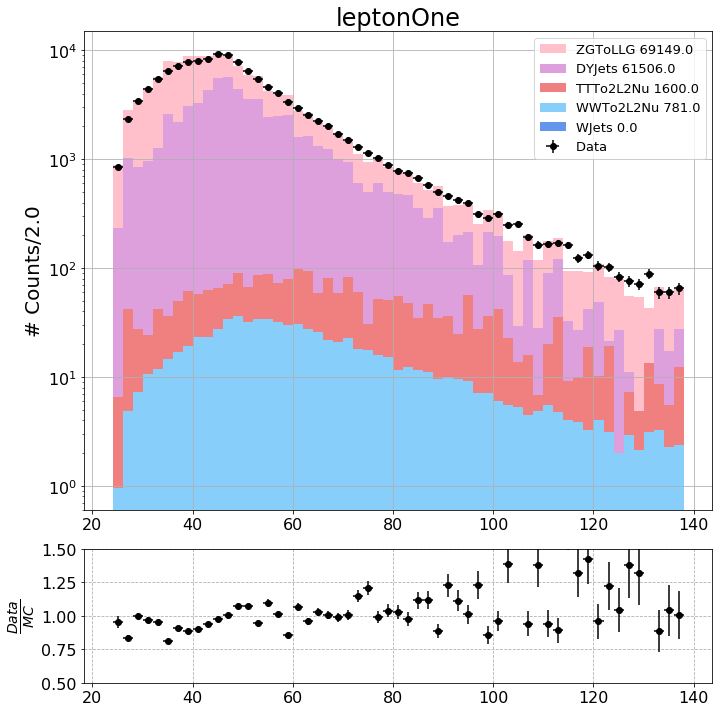

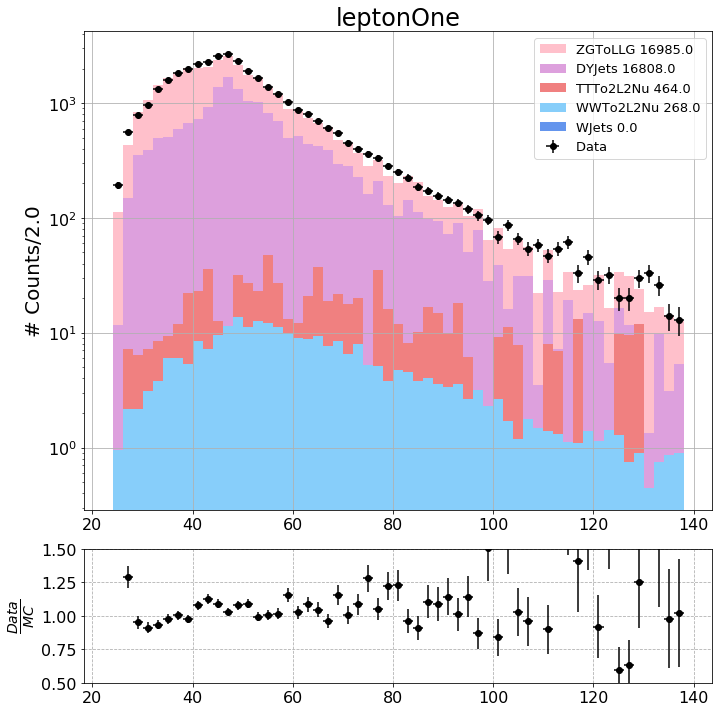

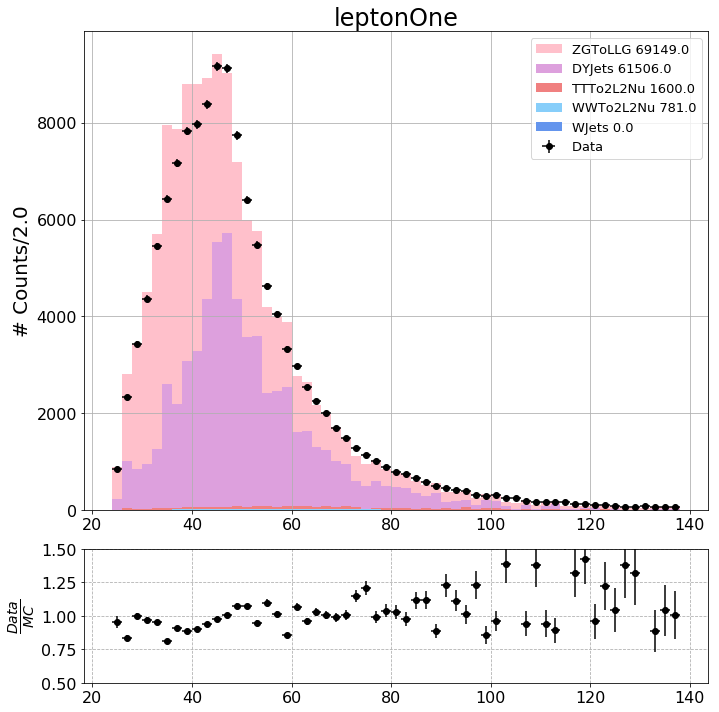

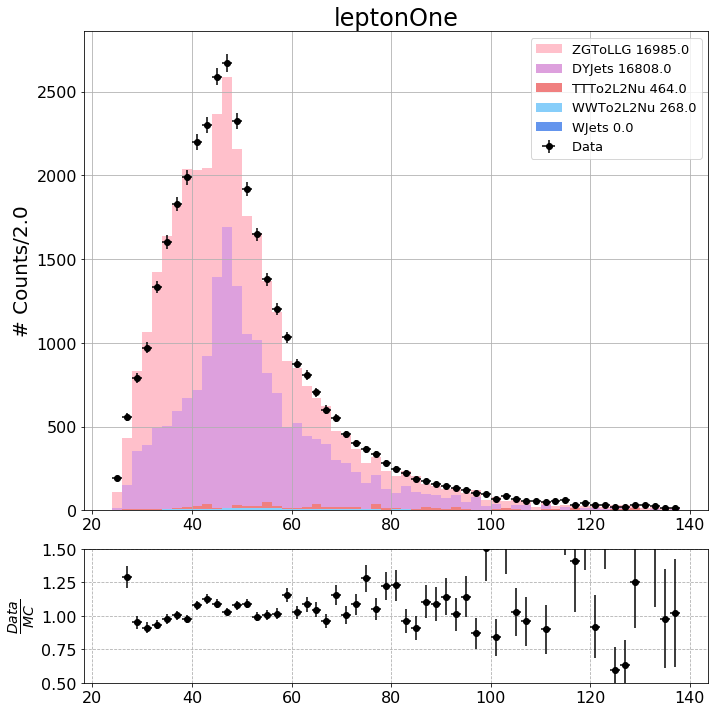

[0, 1.4442]
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0

[1.5666, 2.5] [110.0, 112.0] 7.945617152788789
[1.5666, 2.5] [112.0, 114.0] 10.241934058907002
[1.5666, 2.5] [114.0, 116.0] 7.162143272172207
[1.5666, 2.5] [116.0, 118.0] -3.394167878844035
[1.5666, 2.5] [118.0, 120.0] 10.31804635236736
[1.5666, 2.5] [120.0, 122.0] 4.638463901717854
[1.5666, 2.5] [122.0, 124.0] 4.498880646343325
[1.5666, 2.5] [124.0, 126.0] 0.25040664524938006
[1.5666, 2.5] [126.0, 128.0] -4.168312760077421
[1.5666, 2.5] [128.0, 130.0] 1.3931249285945029
[1.5666, 2.5] [130.0, 132.0] 3.268029225267444
[1.5666, 2.5] [132.0, 134.0] 4.010950204629671
[1.5666, 2.5] [134.0, 136.0] -4.550257163375438
[1.5666, 2.5] [136.0, 138.0] 0.2624162765907341
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[1.5666, 2.5] [70.0, 72.0] 71.82384702053884
[1.5666, 2.5] [72.0, 74.0] 26.743014758150682
[1.5666, 2.5] [74.0, 76.0] 45.9705888124685
[1.5666, 2.5] [76.0, 78.0] 46.951813573090995
[1.5666, 2.5] [78.0, 80.0] 26.655689650150837
[1.5666, 2.5] [80.0, 82.0] 37.72829564914751
[1.5666, 2.5] [82.0, 84.0] 33.42922066646676
[1.5666, 2.5] [84.0, 86.0] 16.426998908216476
[1.5666, 2.5] [86.0, 88.0] -1.3040173745808161
[1.5666, 2.5] [88.0, 90.0] 19.926675551196816
[1.5666, 2.5] [90.0, 92.0] 26.538903986526627
[1.5666, 2.5] [92.0, 94.0] -4.326949564194315
[1.5666, 2.5] [94.0, 96.0] 20.38375518964572
[1.5666, 2.5] [96.0, 98.0] 2.2293290721833867
[1.5666, 2.5] [98.0, 100.0] 17.207163776835987
[1.5666, 2.5] [100.0, 102.0] 14.606584182687635
[1.5666, 2.5] [102.0, 104.0] 6.817745081565223
[1.5666, 2.5] [104.0, 106.0] 18.290623872257342
[1.5666, 2.5] [106.0, 108.0] 15.299686327250992
[1.5666, 2.5] [108.0, 110.0] -1.3989414484560214
[1.5666, 2.5] [110.0, 112.0] 7.945617152788789
[1.5666, 2.5] [112.0, 114.0

[1.5666, 2.5] [30.0, 32.0] 9.498145590469797
[1.5666, 2.5] [32.0, 34.0] 28.23974995442773
[1.5666, 2.5] [34.0, 36.0] 47.44322629925133
[1.5666, 2.5] [36.0, 38.0] 45.03395751416138
[1.5666, 2.5] [38.0, 40.0] 25.27100903615531
[1.5666, 2.5] [40.0, 42.0] 31.314156962345013
[1.5666, 2.5] [42.0, 44.0] 79.9743624693276
[1.5666, 2.5] [44.0, 46.0] 75.9599279431858
[1.5666, 2.5] [46.0, 48.0] 128.3809332685818
[1.5666, 2.5] [48.0, 50.0] 98.25446419887977
[1.5666, 2.5] [50.0, 52.0] 85.77504038491834
[1.5666, 2.5] [52.0, 54.0] 71.78417908576453
[1.5666, 2.5] [54.0, 56.0] 92.78494358265469
[1.5666, 2.5] [56.0, 58.0] 115.66599669570343
[1.5666, 2.5] [58.0, 60.0] 109.13173415820951
[1.5666, 2.5] [60.0, 62.0] 79.73859961760762
[1.5666, 2.5] [62.0, 64.0] 79.42425893593999
[1.5666, 2.5] [64.0, 66.0] 71.19417503711443
[1.5666, 2.5] [66.0, 68.0] 34.26245636351519
[1.5666, 2.5] [68.0, 70.0] 45.6787968517699
[1.5666, 2.5] [70.0, 72.0] 71.82384702053884
[1.5666, 2.5] [72.0, 74.0] 26.743014758150682
[1.5666, 

[1.5666, 2.5] [112.0, 114.0] 10.241934058907002
[1.5666, 2.5] [114.0, 116.0] 7.162143272172207
[1.5666, 2.5] [116.0, 118.0] -3.394167878844035
[1.5666, 2.5] [118.0, 120.0] 10.31804635236736
[1.5666, 2.5] [120.0, 122.0] 4.638463901717854
[1.5666, 2.5] [122.0, 124.0] 4.498880646343325
[1.5666, 2.5] [124.0, 126.0] 0.25040664524938006
[1.5666, 2.5] [126.0, 128.0] -4.168312760077421
[1.5666, 2.5] [128.0, 130.0] 1.3931249285945029
[1.5666, 2.5] [130.0, 132.0] 3.268029225267444
[1.5666, 2.5] [132.0, 134.0] 4.010950204629671
[1.5666, 2.5] [134.0, 136.0] -4.550257163375438
[1.5666, 2.5] [136.0, 138.0] 0.2624162765907341
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 

[1.5666, 2.5] [110.0, 112.0] 7.945617152788789
[1.5666, 2.5] [112.0, 114.0] 10.241934058907002
[1.5666, 2.5] [114.0, 116.0] 7.162143272172207
[1.5666, 2.5] [116.0, 118.0] -3.394167878844035
[1.5666, 2.5] [118.0, 120.0] 10.31804635236736
[1.5666, 2.5] [120.0, 122.0] 4.638463901717854
[1.5666, 2.5] [122.0, 124.0] 4.498880646343325
[1.5666, 2.5] [124.0, 126.0] 0.25040664524938006
[1.5666, 2.5] [126.0, 128.0] -4.168312760077421
[1.5666, 2.5] [128.0, 130.0] 1.3931249285945029
[1.5666, 2.5] [130.0, 132.0] 3.268029225267444
[1.5666, 2.5] [132.0, 134.0] 4.010950204629671
[1.5666, 2.5] [134.0, 136.0] -4.550257163375438
[1.5666, 2.5] [136.0, 138.0] 0.2624162765907341
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.

[1.5666, 2.5] [110.0, 112.0] 7.945617152788789
[1.5666, 2.5] [112.0, 114.0] 10.241934058907002
[1.5666, 2.5] [114.0, 116.0] 7.162143272172207
[1.5666, 2.5] [116.0, 118.0] -3.394167878844035
[1.5666, 2.5] [118.0, 120.0] 10.31804635236736
[1.5666, 2.5] [120.0, 122.0] 4.638463901717854
[1.5666, 2.5] [122.0, 124.0] 4.498880646343325
[1.5666, 2.5] [124.0, 126.0] 0.25040664524938006
[1.5666, 2.5] [126.0, 128.0] -4.168312760077421
[1.5666, 2.5] [128.0, 130.0] 1.3931249285945029
[1.5666, 2.5] [130.0, 132.0] 3.268029225267444
[1.5666, 2.5] [132.0, 134.0] 4.010950204629671
[1.5666, 2.5] [134.0, 136.0] -4.550257163375438
[1.5666, 2.5] [136.0, 138.0] 0.2624162765907341
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[1.5666, 2.5] [112.0, 114.0] 10.241934058907002
[1.5666, 2.5] [114.0, 116.0] 7.162143272172207
[1.5666, 2.5] [116.0, 118.0] -3.394167878844035
[1.5666, 2.5] [118.0, 120.0] 10.31804635236736
[1.5666, 2.5] [120.0, 122.0] 4.638463901717854
[1.5666, 2.5] [122.0, 124.0] 4.498880646343325
[1.5666, 2.5] [124.0, 126.0] 0.25040664524938006
[1.5666, 2.5] [126.0, 128.0] -4.168312760077421
[1.5666, 2.5] [128.0, 130.0] 1.3931249285945029
[1.5666, 2.5] [130.0, 132.0] 3.268029225267444
[1.5666, 2.5] [132.0, 134.0] 4.010950204629671
[1.5666, 2.5] [134.0, 136.0] -4.550257163375438
[1.5666, 2.5] [136.0, 138.0] 0.2624162765907341
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 

[1.5666, 2.5] [132.0, 134.0] 4.010950204629671
[1.5666, 2.5] [134.0, 136.0] -4.550257163375438
[1.5666, 2.5] [136.0, 138.0] 0.2624162765907341
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0,

[1.5666, 2.5] [30.0, 32.0] 9.498145590469797
[1.5666, 2.5] [32.0, 34.0] 28.23974995442773
[1.5666, 2.5] [34.0, 36.0] 47.44322629925133
[1.5666, 2.5] [36.0, 38.0] 45.03395751416138
[1.5666, 2.5] [38.0, 40.0] 25.27100903615531
[1.5666, 2.5] [40.0, 42.0] 31.314156962345013
[1.5666, 2.5] [42.0, 44.0] 79.9743624693276
[1.5666, 2.5] [44.0, 46.0] 75.9599279431858
[1.5666, 2.5] [46.0, 48.0] 128.3809332685818
[1.5666, 2.5] [48.0, 50.0] 98.25446419887977
[1.5666, 2.5] [50.0, 52.0] 85.77504038491834
[1.5666, 2.5] [52.0, 54.0] 71.78417908576453
[1.5666, 2.5] [54.0, 56.0] 92.78494358265469
[1.5666, 2.5] [56.0, 58.0] 115.66599669570343
[1.5666, 2.5] [58.0, 60.0] 109.13173415820951
[1.5666, 2.5] [60.0, 62.0] 79.73859961760762
[1.5666, 2.5] [62.0, 64.0] 79.42425893593999
[1.5666, 2.5] [64.0, 66.0] 71.19417503711443
[1.5666, 2.5] [66.0, 68.0] 34.26245636351519
[1.5666, 2.5] [68.0, 70.0] 45.6787968517699
[1.5666, 2.5] [70.0, 72.0] 71.82384702053884
[1.5666, 2.5] [72.0, 74.0] 26.743014758150682
[1.5666, 

[1.5666, 2.5] [122.0, 124.0] 4.498880646343325
[1.5666, 2.5] [124.0, 126.0] 0.25040664524938006
[1.5666, 2.5] [126.0, 128.0] -4.168312760077421
[1.5666, 2.5] [128.0, 130.0] 1.3931249285945029
[1.5666, 2.5] [130.0, 132.0] 3.268029225267444
[1.5666, 2.5] [132.0, 134.0] 4.010950204629671
[1.5666, 2.5] [134.0, 136.0] -4.550257163375438
[1.5666, 2.5] [136.0, 138.0] 0.2624162765907341
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 25.485279117852556
[0, 1.4442] [26.0, 28.0] 43.88799240257759
[0, 1.4442] [28.0, 30.0] 28.30371633476681
[0, 1.4442] [30.0, 32.0] 55.35568905866244
[0, 1.4442] [32.0, 34.0] 93.28097689845855
[0, 1.4442] [34.0, 36.0] 137.55336851113094
[0, 1.4442] [36.0, 38.0] 161.64282719328162
[0, 1.4442] [38.0, 40.0] 149.9757231053179
[0, 1.4442] [40.0, 42.0] 194.5724202625344
[0, 1.4442] [42.0, 44.0] 251.45403029636685
[0, 1.4442] [44.0, 46.0] 285.5013795012054
[0, 1.4442] [46.0, 48.0] 317.8281247134959
[0, 1.4442] [48.0, 50.0] 286.08468512670385
[0, 1.4442] [50.0, 52.0] 449.4970252938353
[0, 1.4442] [52.0, 54.0] 410.6341005817663
[0, 1.4442] [54.0, 56.0] 319.2362626529217
[0, 1.4442] [56.0, 58.0] 328.38937634107293
[0, 1.4442] [58.0, 60.0] 374.08758990536836
[0, 1.4442] [60.0, 62.0] 399.08046790605937
[0, 1.4442] [62.0, 64.0] 247.34580864527962
[0, 1.4442] [64.0, 66.0] 260.67298035309534
[0, 1.4442] [66.0, 68.0] 327.

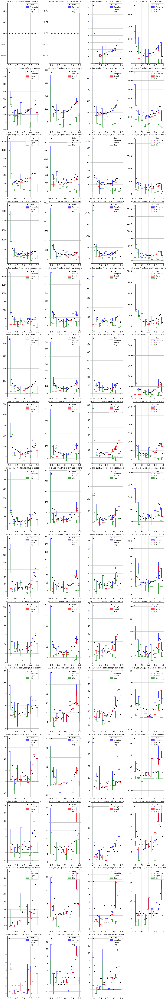

[1.5666, 2.5]
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 75.2621806514742
[0, 1.4442] [26.0, 28.0] 184.57708418624884
[0, 1.4442] [28.0, 30.0] 249.34651570505167
[0, 1.4442] [30.0, 32.0] 415.1755681011138
[0, 1.4442] [32.0, 34.0] 461.1677033023634
[0, 1.4442] [34.0, 36.0] 656.3232808454962
[0, 1.4442] [36.0, 38.0] 739.6630751086686
[0, 1.4442] [38.0, 40.0] 951.3590426673869
[0, 1.4442] [40.0, 42.0] 1056.06500227214
[0, 1.4442] [42.0, 44.0] 1288.2221445687037
[0, 1.4442] [44.0, 46.0] 1498.089370004778
[0, 1.4442] [46.0, 48.0] 2076.4020941146323
[0, 1.4442] [48.0, 50.0] 2125.6804025643796
[0, 1.4442] [50.0, 52.0] 2206.903717540484
[0, 1.4442] [52.0, 54.0] 2020.6047809101597
[0, 1.4442] [54.0, 56.0] 1909.9652996781288
[0, 1.4442] [56.0, 58.0] 2010.7356280836352
[0, 1.4442] [58.0, 60.0] 1720.1569311978842
[0, 1.4442] [60.0, 62.0] 1555.0813284010858
[0, 1.4442] [62.0, 64.0] 1448.1350951027523
[0, 1.4442] [64.0, 66.0] 1518.7484465031403
[0, 1.4442] [66.0, 68.0] 1147

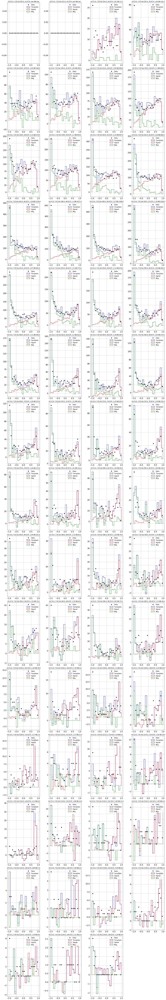

----------- leptonTwoPt -----------
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4

[0, 1.4442] [86.0, 88.0] 4.909799146012783
[0, 1.4442] [88.0, 90.0] 0.0
[0, 1.4442] [90.0, 92.0] 5.384474326410943
[0, 1.4442] [92.0, 94.0] 4.437830084864528
[0, 1.4442] [94.0, 96.0] 3.7088489837847978
[0, 1.4442] [96.0, 98.0] 3.0019747552196314
[0, 1.4442] [98.0, 100.0] 0.0
[0, 1.4442] [100.0, 102.0] 12.803306884061218
[0, 1.4442] [102.0, 104.0] 0.0
[0, 1.4442] [104.0, 106.0] 0.0
[0, 1.4442] [106.0, 108.0] 0.0
[0, 1.4442] [108.0, 110.0] 0.0
[0, 1.4442] [110.0, 112.0] 0.0
[0, 1.4442] [112.0, 114.0] 0.0
[0, 1.4442] [114.0, 116.0] 0.0
[0, 1.4442] [116.0, 118.0] 4.156027166618431
[0, 1.4442] [118.0, 120.0] 0.0
[0, 1.4442] [120.0, 122.0] 0.999630789038461
[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] [130.0, 132.0] 0.0
[0, 1.4442] [132.0, 134.0] 0.0
[0, 1.4442] [134.0, 136.0] 0.0
[0, 1.4442] [136.0, 138.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 22.174656021866646
[1.5666, 2.5] [22.0, 24.0] 15.180156865724346


[0, 1.4442] [20.0, 22.0] 6997.983752043553
[0, 1.4442] [22.0, 24.0] 7269.293257667745
[0, 1.4442] [24.0, 26.0] 7502.978254956307
[0, 1.4442] [26.0, 28.0] 6897.549587416312
[0, 1.4442] [28.0, 30.0] 6032.305317926015
[0, 1.4442] [30.0, 32.0] 5156.463043177405
[0, 1.4442] [32.0, 34.0] 4077.0187045316998
[0, 1.4442] [34.0, 36.0] 3256.010353142794
[0, 1.4442] [36.0, 38.0] 2513.5960743122682
[0, 1.4442] [38.0, 40.0] 2028.6197765612073
[0, 1.4442] [40.0, 42.0] 1669.618148637328
[0, 1.4442] [42.0, 44.0] 1401.6637852034805
[0, 1.4442] [44.0, 46.0] 992.0555982632221
[0, 1.4442] [46.0, 48.0] 609.6600224145235
[0, 1.4442] [48.0, 50.0] 422.0132908360059
[0, 1.4442] [50.0, 52.0] 318.1299584562365
[0, 1.4442] [52.0, 54.0] 238.04704406110784
[0, 1.4442] [54.0, 56.0] 200.1166235077708
[0, 1.4442] [56.0, 58.0] 153.50620289975708
[0, 1.4442] [58.0, 60.0] 122.35435322034596
[0, 1.4442] [60.0, 62.0] 111.83255792499287
[0, 1.4442] [62.0, 64.0] 83.48297808420715
[0, 1.4442] [64.0, 66.0] 78.61607694851091
[0,

[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 118.0] 0.0
[1.5666, 2.5] [118.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 122.0] 0.0
[1.5666, 2.5] [122.0, 124.0] 0.0
[1.5666, 2.5] [124.0, 126.0] 0.0
[1.5666, 2.5] [126.0, 128.0] 0.0
[1.5666, 2.5] [128.0, 130.0] 0.0
[1.5666, 2.5] [130.0, 132.0] 0.0
[1.5666, 2.5] [132.0, 134.0] 0.0
[1.5666, 2.5] [134.0, 136.0] 0.0
[1.5666, 2.5] [136.0, 138.0] 0.0
[0, 1.4442] [20.0, 22.0] 28.015875133400172
[0, 1.4442] [22.0, 24.0] 30.363815132201594
[0, 1.4442] [24.0, 26.0] 32.88009702731327
[0, 1.4442] [26.0, 28.0] 35.57449436225949
[0, 1.4442] [28.0, 30.0] 37.302376079097165
[0, 1.4442] [30.0, 32.0] 38.402234842851456
[0, 1.4442] [32.0, 34.0] 39.606010588844114
[0, 1.4442] [34.0, 36.0] 40.7006856

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 3423
[0, 1.4442] [22.0, 24.0] 3981
[0, 1.4442] [24.0, 26.0] 4428
[0, 1.4442] [26.0, 28.0] 4898
[0, 1.4442] [28.0, 30.0] 5147
[0, 1.4442] [30.0, 32.0] 5194
[0, 1.4442] [32.0, 34.0] 5125
[0, 1.4442] [34.0, 36.0] 4862
[0, 1.4442] [36.0, 38.0] 4700
[0, 1.4442] [38.0, 40.0] 4284
[0, 1.4442] [40.0, 42.0] 3807
[0, 1.4442] [42.0, 44.0] 3259
[0, 1.4442] [44.0, 46.0] 2588
[0, 1.4442] [46.0, 48.0] 1716
[0, 1.4442] [48.0, 50.0] 1191
[0, 1.4442] [50.0, 52.0] 803
[0, 1.4442] [52.0, 54.0] 612
[0, 1.4442] [54.0, 56.0] 460
[0, 1.4442] [56.0, 58.0] 400
[0, 1.4442] [58.0, 60.0] 300
[0, 1.4442] [60.0, 62.0] 243
[0, 1.4442] [62.0, 64.0] 207
[0, 1.4442] [64.0, 66.0] 153
[0, 1.4442] [66.0, 68.0] 144
[0, 1.4442] [68.0, 70.0] 132
[0, 1.4442] [70.0, 72.0] 112
[0, 1.4442] [72.0, 74.0] 78
[0, 1.4442] [74.0, 76.0] 78
[0, 1.4442] [76.0, 78.0] 57
[0, 1.4442] [78.0, 80.0] 61
[0, 1.4442] [80.0, 82.0] 47
[0, 1.4442] [82.0, 84.0] 41
[0, 1.4442] [84.0, 86.0] 28
[0, 1.4442] [86.0, 88.0] 30
[0, 1.4

[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64.0, 66.0] 0.0
[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666, 2.5] [84.0, 86.0] 0.0
[1.5666, 2.5] [86.0, 88.0] 0.0
[1.5666, 2.5] [88.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 92.0] 0.0
[1.5666, 2.5] [92.0, 94.0] 0.0
[1.5666, 2.5] [94.0, 96.0] 0.0
[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64.0, 66.0] 0.0
[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666, 2.5] [84.0, 86.0] 0.0
[1.5666, 2.5] [86.0, 88.0] 0.0
[1.5666, 2.5] [88.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 92.0] 0.0
[1.5666, 2.5] [92.0, 94.0] 0.0
[1.5666, 2.5] [94.0, 96.0] 0.0
[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 118.0] 0.0
[1.5666, 2.5] [118.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 122.0] 0.0
[1.5666, 2.5] [122.0, 124.0] 0.0
[1.5666, 2.5] 

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 118.0] 0.0
[1.5666, 2.5] [118.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 122.0] 0.0
[1.5666, 2.5] [122.0, 124.0] 0.0
[1.5666, 2.5] [124.0, 126.0] 0.0
[1.5666, 2.5] [126.0, 128.0] 0.0
[1.5666, 2.5] [128.0, 130.0] 0.0
[1.5666, 2.5] [130.0, 132.0] 0.0
[1.5666, 2.5] [132.0, 134.0] 0.0
[1.5666, 2.5] [134.0, 136.0] 0.0
[1.5666, 2.5] [136.0, 138.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 4

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

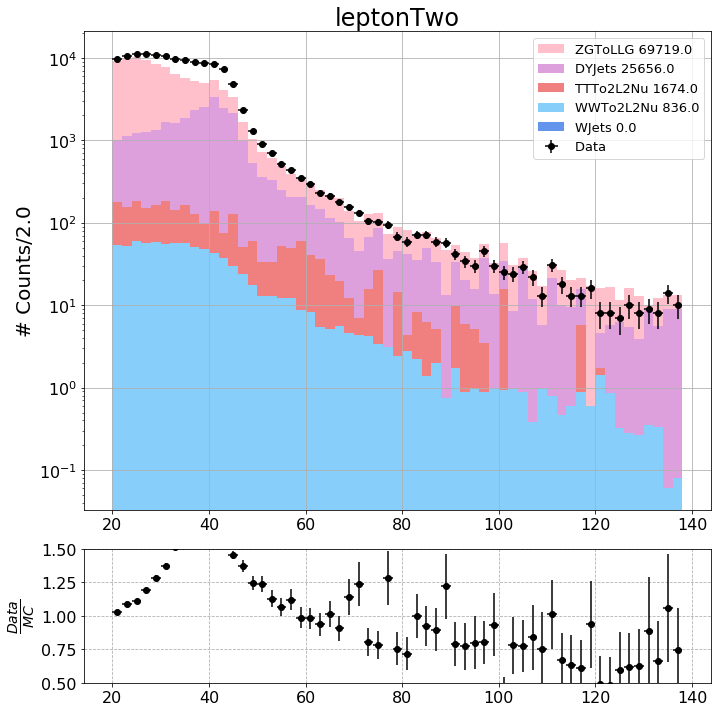

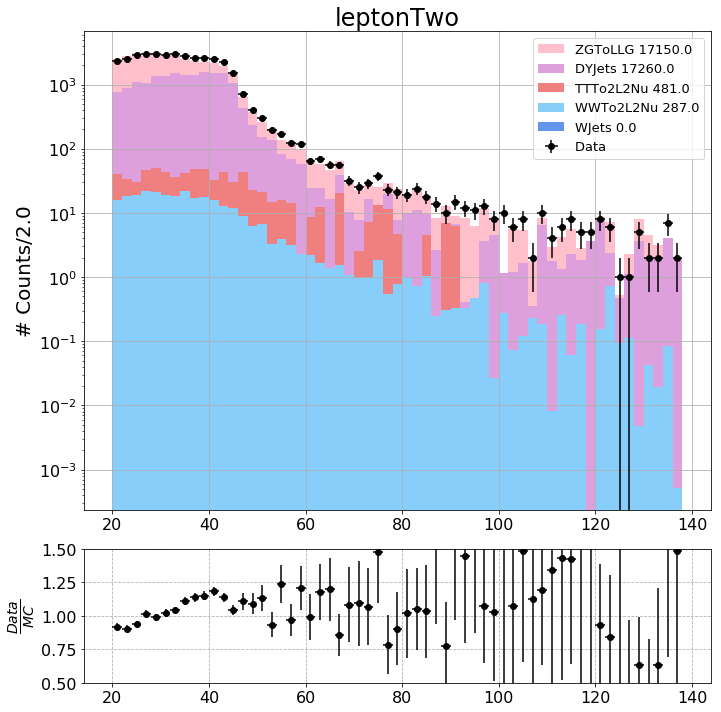

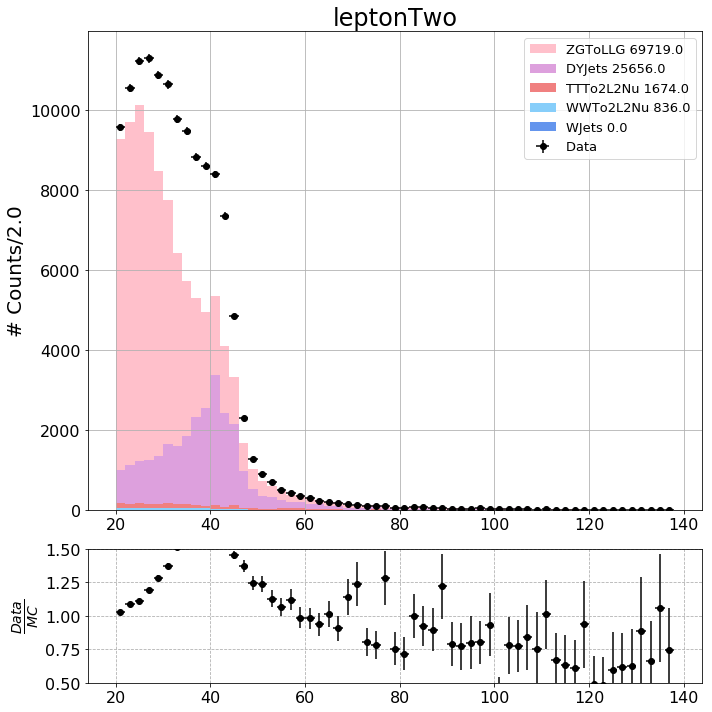

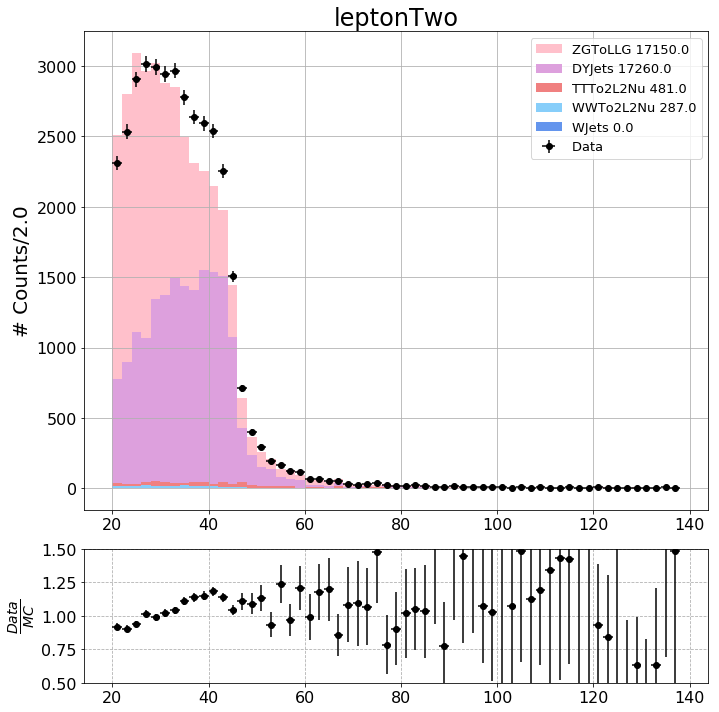

[0, 1.4442]
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [8

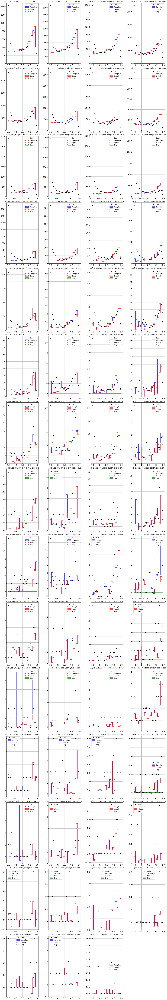

[1.5666, 2.5]
[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [88.0, 90.0] 16.230294338411067
[0, 1.4442] [90.0, 92.0] 14.191271229645642
[0, 1.4442] [92.0, 94.0] 15.353400029269256
[0, 1.4442] [94.0, 96.0] 1.8241901870497563
[0, 1.4442] [96.0, 98.0] 3.157999118506303
[0, 1.4442] [98.0, 100.0] 12.081684132304026
[0, 1.4442] [100.0, 102.0] 15.02937400283331
[0, 1.4442] [102.0, 104.0] 3.155931350628769
[0, 1.4442] [104.0, 106.0] 2.8798933532965227
[0, 1.4442] [106.0, 108.0] 6.727838111212188
[0, 1.4442] [108.0, 110.0] -2.712246976374871
[0, 1.4442] [110.0, 112.0] -4.521847331099972
[0, 1.4442] [112.0, 114.0] 4.308070938759958
[0, 1.4442] [114.0, 116.0] 2.0799672988676248
[0, 1.4442] [116.0, 118.0] 1.8057142382234441
[0, 1.4442] [118.0, 120.0] -0.7517395953647972
[0, 1.4442] [120.0, 122.0] -4.007660293845072
[0, 1.4442] [122.0, 124.0] 7.645286688672698
[0, 1.4442] [124.0, 126.0] 4.6999124309305085
[0, 1.4442] [126.0, 128.0] -2.5544556977450026
[0, 1.4442] [128.0, 130.0] 0.13387670993689116
[0, 1.4442] [130.0, 132.0] -0.68561370310861
[0,

[1.5666, 2.5] [24.0, 26.0] 689.371943604148
[1.5666, 2.5] [26.0, 28.0] 647.9655407293092
[1.5666, 2.5] [28.0, 30.0] 837.5289870517297
[1.5666, 2.5] [30.0, 32.0] 839.9472427474961
[1.5666, 2.5] [32.0, 34.0] 845.6292728454936
[1.5666, 2.5] [34.0, 36.0] 809.2917405438948
[1.5666, 2.5] [36.0, 38.0] 662.1568342878031
[1.5666, 2.5] [38.0, 40.0] 648.2258522629951
[1.5666, 2.5] [40.0, 42.0] 620.2005748425154
[1.5666, 2.5] [42.0, 44.0] 452.0399333990486
[1.5666, 2.5] [44.0, 46.0] 339.8543911192223
[1.5666, 2.5] [46.0, 48.0] 235.94064199105264
[1.5666, 2.5] [48.0, 50.0] 152.65539254295066
[1.5666, 2.5] [50.0, 52.0] 107.28285640503594
[1.5666, 2.5] [52.0, 54.0] 55.1160690847436
[1.5666, 2.5] [54.0, 56.0] 68.93156378472894
[1.5666, 2.5] [56.0, 58.0] 39.43723826287358
[1.5666, 2.5] [58.0, 60.0] 52.4044738454962
[1.5666, 2.5] [60.0, 62.0] 27.684525835132934
[1.5666, 2.5] [62.0, 64.0] 19.638585973487306
[1.5666, 2.5] [64.0, 66.0] 15.77280402897556
[1.5666, 2.5] [66.0, 68.0] 15.089501075865206
[1.5666

[1.5666, 2.5] [22.0, 24.0] 579.4707828729086
[1.5666, 2.5] [24.0, 26.0] 689.371943604148
[1.5666, 2.5] [26.0, 28.0] 647.9655407293092
[1.5666, 2.5] [28.0, 30.0] 837.5289870517297
[1.5666, 2.5] [30.0, 32.0] 839.9472427474961
[1.5666, 2.5] [32.0, 34.0] 845.6292728454936
[1.5666, 2.5] [34.0, 36.0] 809.2917405438948
[1.5666, 2.5] [36.0, 38.0] 662.1568342878031
[1.5666, 2.5] [38.0, 40.0] 648.2258522629951
[1.5666, 2.5] [40.0, 42.0] 620.2005748425154
[1.5666, 2.5] [42.0, 44.0] 452.0399333990486
[1.5666, 2.5] [44.0, 46.0] 339.8543911192223
[1.5666, 2.5] [46.0, 48.0] 235.94064199105264
[1.5666, 2.5] [48.0, 50.0] 152.65539254295066
[1.5666, 2.5] [50.0, 52.0] 107.28285640503594
[1.5666, 2.5] [52.0, 54.0] 55.1160690847436
[1.5666, 2.5] [54.0, 56.0] 68.93156378472894
[1.5666, 2.5] [56.0, 58.0] 39.43723826287358
[1.5666, 2.5] [58.0, 60.0] 52.4044738454962
[1.5666, 2.5] [60.0, 62.0] 27.684525835132934
[1.5666, 2.5] [62.0, 64.0] 19.638585973487306
[1.5666, 2.5] [64.0, 66.0] 15.77280402897556
[1.5666,

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[0, 1.4442] [66.0, 68.0] 57.86179186408568
[0, 1.4442] [68.0, 70.0] 25.948998206582313
[0, 1.4442] [70.0, 72.0] 40.86592650642302
[0, 1.4442] [72.0, 74.0] 57.21369927362588
[0,

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

[0, 1.4442] [20.0, 22.0] 1895.7237964082226
[0, 1.4442] [22.0, 24.0] 1912.9525724492603
[0, 1.4442] [24.0, 26.0] 2441.2490397666893
[0, 1.4442] [26.0, 28.0] 2777.603685479851
[0, 1.4442] [28.0, 30.0] 2952.567415897797
[0, 1.4442] [30.0, 32.0] 3378.721859977533
[0, 1.4442] [32.0, 34.0] 3236.446343961391
[0, 1.4442] [34.0, 36.0] 2819.5124044293952
[0, 1.4442] [36.0, 38.0] 2773.3786091270103
[0, 1.4442] [38.0, 40.0] 2468.0359393725516
[0, 1.4442] [40.0, 42.0] 2185.5157743971295
[0, 1.4442] [42.0, 44.0] 1891.6308239802868
[0, 1.4442] [44.0, 46.0] 1337.3061474541053
[0, 1.4442] [46.0, 48.0] 1000.3984132611091
[0, 1.4442] [48.0, 50.0] 562.8305710032238
[0, 1.4442] [50.0, 52.0] 340.9588816595467
[0, 1.4442] [52.0, 54.0] 263.7558577729161
[0, 1.4442] [54.0, 56.0] 234.47282027898757
[0, 1.4442] [56.0, 58.0] 155.81678488644948
[0, 1.4442] [58.0, 60.0] 132.8578449414276
[0, 1.4442] [60.0, 62.0] 78.4483507988582
[0, 1.4442] [62.0, 64.0] 95.0173026272203
[0, 1.4442] [64.0, 66.0] 79.36859628591222
[

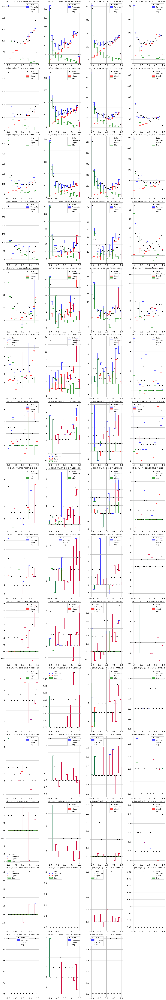

----------- photonOnePt -----------
[0, 1.4442] [15.0, 20.0] 0.0
[0, 1.4442] [20.0, 25.0] 0.0
[0, 1.4442] [25.0, 30.0] 0.0
[0, 1.4442] [30.0, 35.0] 0.0
[0, 1.4442] [35.0, 40.0] 0.0
[0, 1.4442] [40.0, 45.0] 0.0
[0, 1.4442] [45.0, 50.0] 0.0
[0, 1.4442] [50.0, 55.0] 0.0
[0, 1.4442] [55.0, 60.0] 0.0
[0, 1.4442] [60.0, 65.0] 0.0
[0, 1.4442] [65.0, 70.0] 0.0
[0, 1.4442] [70.0, 75.0] 0.0
[0, 1.4442] [75.0, 80.0] 0.0
[0, 1.4442] [80.0, 85.0] 0.0
[0, 1.4442] [85.0, 90.0] 0.0
[0, 1.4442] [90.0, 95.0] 0.0
[0, 1.4442] [95.0, 100.0] 0.0
[0, 1.4442] [100.0, 105.0] 0.0
[0, 1.4442] [105.0, 110.0] 0.0
[0, 1.4442] [110.0, 115.0] 0.0
[0, 1.4442] [115.0, 120.0] 0.0
[0, 1.4442] [120.0, 125.0] 0.0
[0, 1.4442] [125.0, 130.0] 0.0
[0, 1.4442] [130.0, 135.0] 0.0
[0, 1.4442] [135.0, 140.0] 0.0
[0, 1.4442] [140.0, 145.0] 0.0
[1.5666, 2.5] [15.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 25.0] 0.0
[1.5666, 2.5] [25.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 35.0] 0.0
[1.5666, 2.5] [35.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 45.0] 0.0
[1.56

[0, 1.4442] [15.0, 20.0] 63211
[0, 1.4442] [20.0, 25.0] 29247
[0, 1.4442] [25.0, 30.0] 14401
[0, 1.4442] [30.0, 35.0] 7303
[0, 1.4442] [35.0, 40.0] 4291
[0, 1.4442] [40.0, 45.0] 2783
[0, 1.4442] [45.0, 50.0] 1965
[0, 1.4442] [50.0, 55.0] 1417
[0, 1.4442] [55.0, 60.0] 1082
[0, 1.4442] [60.0, 65.0] 853
[0, 1.4442] [65.0, 70.0] 653
[0, 1.4442] [70.0, 75.0] 517
[0, 1.4442] [75.0, 80.0] 431
[0, 1.4442] [80.0, 85.0] 340
[0, 1.4442] [85.0, 90.0] 273
[0, 1.4442] [90.0, 95.0] 201
[0, 1.4442] [95.0, 100.0] 207
[0, 1.4442] [100.0, 105.0] 139
[0, 1.4442] [105.0, 110.0] 151
[0, 1.4442] [110.0, 115.0] 99
[0, 1.4442] [115.0, 120.0] 107
[0, 1.4442] [120.0, 125.0] 90
[0, 1.4442] [125.0, 130.0] 79
[0, 1.4442] [130.0, 135.0] 65
[0, 1.4442] [135.0, 140.0] 62
[0, 1.4442] [140.0, 145.0] 54
[1.5666, 2.5] [15.0, 20.0] 16838
[1.5666, 2.5] [20.0, 25.0] 8071
[1.5666, 2.5] [25.0, 30.0] 4248
[1.5666, 2.5] [30.0, 35.0] 2285
[1.5666, 2.5] [35.0, 40.0] 1416
[1.5666, 2.5] [40.0, 45.0] 892
[1.5666, 2.5] [45.0, 50.0] 65

[1.5666, 2.5] [125.0, 130.0] -0.2413027568169992
[1.5666, 2.5] [130.0, 135.0] 2.125945339105213
[1.5666, 2.5] [135.0, 140.0] 0.04953684077454451
[1.5666, 2.5] [140.0, 145.0] 0.0
[0, 1.4442] [15.0, 20.0] 24779
[0, 1.4442] [20.0, 25.0] 13542
[0, 1.4442] [25.0, 30.0] 7821
[0, 1.4442] [30.0, 35.0] 4797
[0, 1.4442] [35.0, 40.0] 3128
[0, 1.4442] [40.0, 45.0] 2141
[0, 1.4442] [45.0, 50.0] 1533
[0, 1.4442] [50.0, 55.0] 1131
[0, 1.4442] [55.0, 60.0] 822
[0, 1.4442] [60.0, 65.0] 630
[0, 1.4442] [65.0, 70.0] 473
[0, 1.4442] [70.0, 75.0] 408
[0, 1.4442] [75.0, 80.0] 293
[0, 1.4442] [80.0, 85.0] 269
[0, 1.4442] [85.0, 90.0] 174
[0, 1.4442] [90.0, 95.0] 168
[0, 1.4442] [95.0, 100.0] 117
[0, 1.4442] [100.0, 105.0] 93
[0, 1.4442] [105.0, 110.0] 106
[0, 1.4442] [110.0, 115.0] 73
[0, 1.4442] [115.0, 120.0] 65
[0, 1.4442] [120.0, 125.0] 51
[0, 1.4442] [125.0, 130.0] 49
[0, 1.4442] [130.0, 135.0] 42
[0, 1.4442] [135.0, 140.0] 39
[0, 1.4442] [140.0, 145.0] 26
[1.5666, 2.5] [15.0, 20.0] 5967
[1.5666, 2.5] [

[0, 1.4442] [15.0, 20.0] 0.0
[0, 1.4442] [20.0, 25.0] 0.0
[0, 1.4442] [25.0, 30.0] 0.0
[0, 1.4442] [30.0, 35.0] 0.0
[0, 1.4442] [35.0, 40.0] 0.0
[0, 1.4442] [40.0, 45.0] 0.0
[0, 1.4442] [45.0, 50.0] 0.0
[0, 1.4442] [50.0, 55.0] 0.0
[0, 1.4442] [55.0, 60.0] 0.0
[0, 1.4442] [60.0, 65.0] 0.0
[0, 1.4442] [65.0, 70.0] 0.0
[0, 1.4442] [70.0, 75.0] 0.0
[0, 1.4442] [75.0, 80.0] 0.0
[0, 1.4442] [80.0, 85.0] 0.0
[0, 1.4442] [85.0, 90.0] 0.0
[0, 1.4442] [90.0, 95.0] 0.0
[0, 1.4442] [95.0, 100.0] 0.0
[0, 1.4442] [100.0, 105.0] 0.0
[0, 1.4442] [105.0, 110.0] 0.0
[0, 1.4442] [110.0, 115.0] 0.0
[0, 1.4442] [115.0, 120.0] 0.0
[0, 1.4442] [120.0, 125.0] 0.0
[0, 1.4442] [125.0, 130.0] 0.0
[0, 1.4442] [130.0, 135.0] 0.0
[0, 1.4442] [135.0, 140.0] 0.0
[0, 1.4442] [140.0, 145.0] 0.0
[1.5666, 2.5] [15.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 25.0] 0.0
[1.5666, 2.5] [25.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 35.0] 0.0
[1.5666, 2.5] [35.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 45.0] 0.0
[1.5666, 2.5] [45.0, 50.0] 0.0
[1.5666, 2

[0, 1.4442] [15.0, 20.0] 0.0
[0, 1.4442] [20.0, 25.0] 0.0
[0, 1.4442] [25.0, 30.0] 0.0
[0, 1.4442] [30.0, 35.0] 0.0
[0, 1.4442] [35.0, 40.0] 0.0
[0, 1.4442] [40.0, 45.0] 0.0
[0, 1.4442] [45.0, 50.0] 0.0
[0, 1.4442] [50.0, 55.0] 0.0
[0, 1.4442] [55.0, 60.0] 0.0
[0, 1.4442] [60.0, 65.0] 0.0
[0, 1.4442] [65.0, 70.0] 0.0
[0, 1.4442] [70.0, 75.0] 0.0
[0, 1.4442] [75.0, 80.0] 0.0
[0, 1.4442] [80.0, 85.0] 0.0
[0, 1.4442] [85.0, 90.0] 0.0
[0, 1.4442] [90.0, 95.0] 0.0
[0, 1.4442] [95.0, 100.0] 0.0
[0, 1.4442] [100.0, 105.0] 0.0
[0, 1.4442] [105.0, 110.0] 0.0
[0, 1.4442] [110.0, 115.0] 0.0
[0, 1.4442] [115.0, 120.0] 0.0
[0, 1.4442] [120.0, 125.0] 0.0
[0, 1.4442] [125.0, 130.0] 0.0
[0, 1.4442] [130.0, 135.0] 0.0
[0, 1.4442] [135.0, 140.0] 0.0
[0, 1.4442] [140.0, 145.0] 0.0
[1.5666, 2.5] [15.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 25.0] 0.0
[1.5666, 2.5] [25.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 35.0] 0.0
[1.5666, 2.5] [35.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 45.0] 0.0
[1.5666, 2.5] [45.0, 50.0] 0.0
[1.5666, 2

[0, 1.4442] [15.0, 20.0] 0.0
[0, 1.4442] [20.0, 25.0] 0.0
[0, 1.4442] [25.0, 30.0] 0.0
[0, 1.4442] [30.0, 35.0] 0.0
[0, 1.4442] [35.0, 40.0] 0.0
[0, 1.4442] [40.0, 45.0] 0.0
[0, 1.4442] [45.0, 50.0] 0.0
[0, 1.4442] [50.0, 55.0] 0.0
[0, 1.4442] [55.0, 60.0] 0.0
[0, 1.4442] [60.0, 65.0] 0.0
[0, 1.4442] [65.0, 70.0] 0.0
[0, 1.4442] [70.0, 75.0] 0.0
[0, 1.4442] [75.0, 80.0] 0.0
[0, 1.4442] [80.0, 85.0] 0.0
[0, 1.4442] [85.0, 90.0] 0.0
[0, 1.4442] [90.0, 95.0] 0.0
[0, 1.4442] [95.0, 100.0] 0.0
[0, 1.4442] [100.0, 105.0] 0.0
[0, 1.4442] [105.0, 110.0] 0.0
[0, 1.4442] [110.0, 115.0] 0.0
[0, 1.4442] [115.0, 120.0] 0.0
[0, 1.4442] [120.0, 125.0] 0.0
[0, 1.4442] [125.0, 130.0] 0.0
[0, 1.4442] [130.0, 135.0] 0.0
[0, 1.4442] [135.0, 140.0] 0.0
[0, 1.4442] [140.0, 145.0] 0.0
[1.5666, 2.5] [15.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 25.0] 0.0
[1.5666, 2.5] [25.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 35.0] 0.0
[1.5666, 2.5] [35.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 45.0] 0.0
[1.5666, 2.5] [45.0, 50.0] 0.0
[1.5666, 2

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

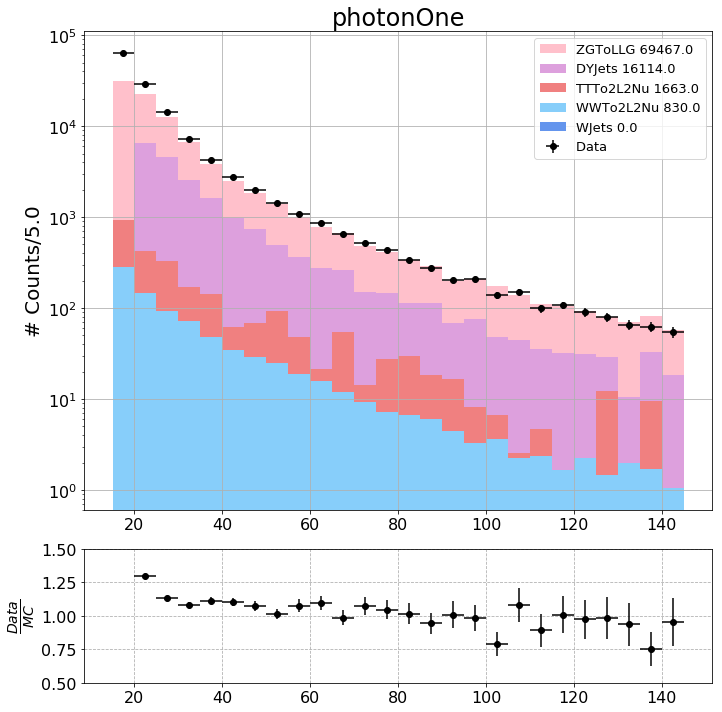

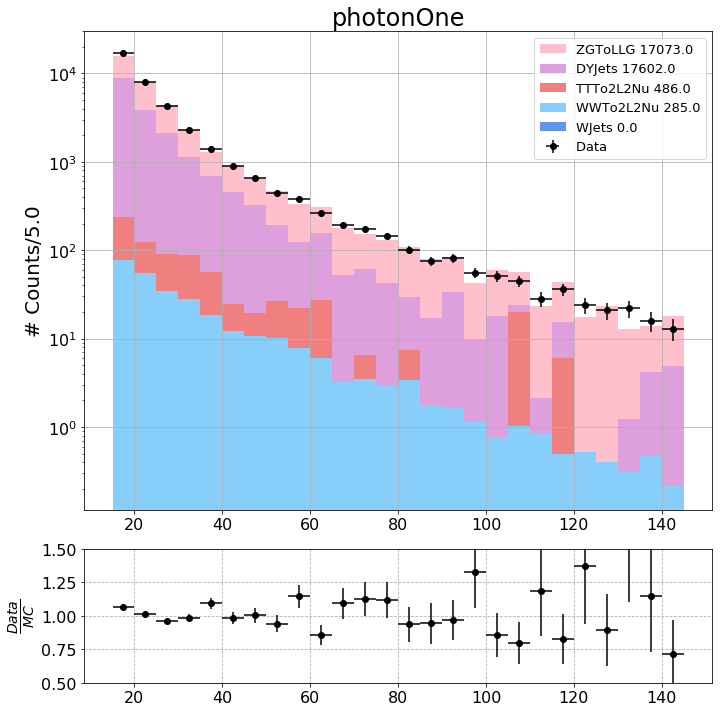

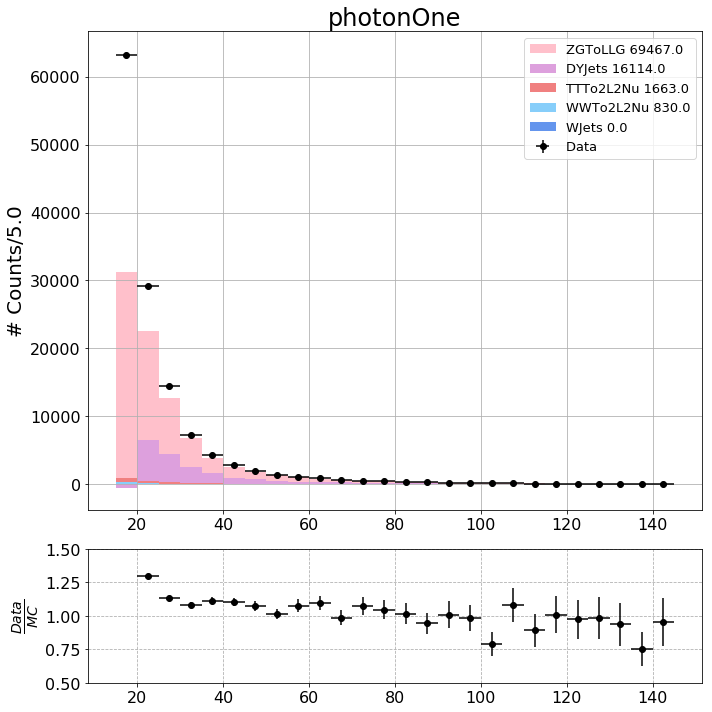

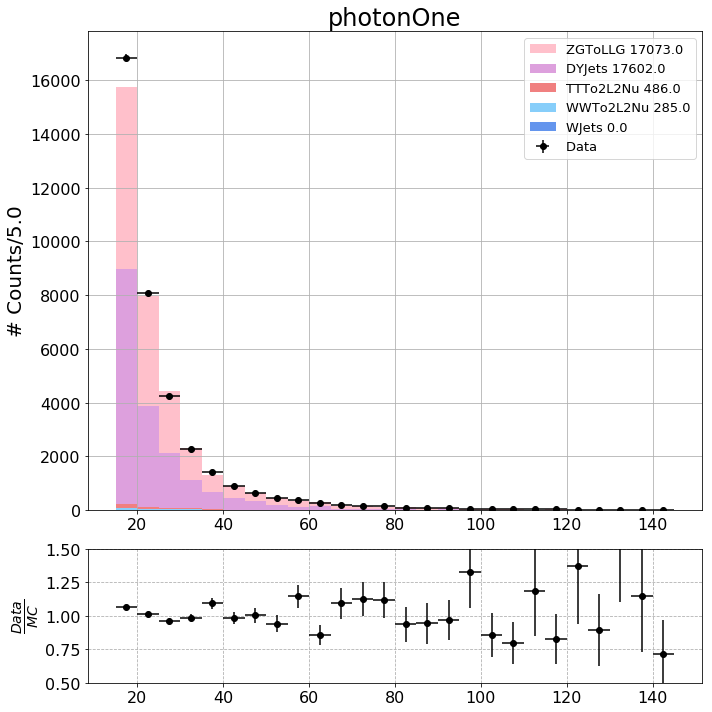

[0, 1.4442]
[0, 1.4442] [15.0, 20.0] 0.0
[0, 1.4442] [20.0, 25.0] 0.0
[0, 1.4442] [25.0, 30.0] 0.0
[0, 1.4442] [30.0, 35.0] 0.0
[0, 1.4442] [35.0, 40.0] 0.0
[0, 1.4442] [40.0, 45.0] 0.0
[0, 1.4442] [45.0, 50.0] 0.0
[0, 1.4442] [50.0, 55.0] 0.0
[0, 1.4442] [55.0, 60.0] 0.0
[0, 1.4442] [60.0, 65.0] 0.0
[0, 1.4442] [65.0, 70.0] 0.0
[0, 1.4442] [70.0, 75.0] 0.0
[0, 1.4442] [75.0, 80.0] 0.0
[0, 1.4442] [80.0, 85.0] 0.0
[0, 1.4442] [85.0, 90.0] 0.0
[0, 1.4442] [90.0, 95.0] 0.0
[0, 1.4442] [95.0, 100.0] 0.0
[0, 1.4442] [100.0, 105.0] 0.0
[0, 1.4442] [105.0, 110.0] 0.0
[0, 1.4442] [110.0, 115.0] 0.0
[0, 1.4442] [115.0, 120.0] 0.0
[0, 1.4442] [120.0, 125.0] 0.0
[0, 1.4442] [125.0, 130.0] 0.0
[0, 1.4442] [130.0, 135.0] 0.0
[0, 1.4442] [135.0, 140.0] 0.0
[0, 1.4442] [140.0, 145.0] 0.0
[1.5666, 2.5] [15.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 25.0] 0.0
[1.5666, 2.5] [25.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 35.0] 0.0
[1.5666, 2.5] [35.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 45.0] 0.0
[1.5666, 2.5] [45.0, 50.0] 0.

[1.5666, 2.5] [110.0, 115.0] 0.0
[1.5666, 2.5] [115.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 125.0] 0.0
[1.5666, 2.5] [125.0, 130.0] 0.0
[1.5666, 2.5] [130.0, 135.0] 0.0
[1.5666, 2.5] [135.0, 140.0] 0.0
[1.5666, 2.5] [140.0, 145.0] 0.0
[0, 1.4442] [15.0, 20.0] 0.0
[0, 1.4442] [20.0, 25.0] 0.0
[0, 1.4442] [25.0, 30.0] 0.0
[0, 1.4442] [30.0, 35.0] 0.0
[0, 1.4442] [35.0, 40.0] 0.0
[0, 1.4442] [40.0, 45.0] 0.0
[0, 1.4442] [45.0, 50.0] 0.0
[0, 1.4442] [50.0, 55.0] 0.0
[0, 1.4442] [55.0, 60.0] 0.0
[0, 1.4442] [60.0, 65.0] 0.0
[0, 1.4442] [65.0, 70.0] 0.0
[0, 1.4442] [70.0, 75.0] 0.0
[0, 1.4442] [75.0, 80.0] 0.0
[0, 1.4442] [80.0, 85.0] 0.0
[0, 1.4442] [85.0, 90.0] 0.0
[0, 1.4442] [90.0, 95.0] 0.0
[0, 1.4442] [95.0, 100.0] 0.0
[0, 1.4442] [100.0, 105.0] 0.0
[0, 1.4442] [105.0, 110.0] 0.0
[0, 1.4442] [110.0, 115.0] 0.0
[0, 1.4442] [115.0, 120.0] 0.0
[0, 1.4442] [120.0, 125.0] 0.0
[0, 1.4442] [125.0, 130.0] 0.0
[0, 1.4442] [130.0, 135.0] 0.0
[0, 1.4442] [135.0, 140.0] 0.0
[0, 1.4442] [140.0, 145.0] 

[0, 1.4442] [15.0, 20.0] 0.0
[0, 1.4442] [20.0, 25.0] 0.0
[0, 1.4442] [25.0, 30.0] 0.0
[0, 1.4442] [30.0, 35.0] 0.0
[0, 1.4442] [35.0, 40.0] 0.0
[0, 1.4442] [40.0, 45.0] 0.0
[0, 1.4442] [45.0, 50.0] 0.0
[0, 1.4442] [50.0, 55.0] 0.0
[0, 1.4442] [55.0, 60.0] 0.0
[0, 1.4442] [60.0, 65.0] 0.0
[0, 1.4442] [65.0, 70.0] 0.0
[0, 1.4442] [70.0, 75.0] 0.0
[0, 1.4442] [75.0, 80.0] 0.0
[0, 1.4442] [80.0, 85.0] 0.0
[0, 1.4442] [85.0, 90.0] 0.0
[0, 1.4442] [90.0, 95.0] 0.0
[0, 1.4442] [95.0, 100.0] 0.0
[0, 1.4442] [100.0, 105.0] 0.0
[0, 1.4442] [105.0, 110.0] 0.0
[0, 1.4442] [110.0, 115.0] 0.0
[0, 1.4442] [115.0, 120.0] 0.0
[0, 1.4442] [120.0, 125.0] 0.0
[0, 1.4442] [125.0, 130.0] 0.0
[0, 1.4442] [130.0, 135.0] 0.0
[0, 1.4442] [135.0, 140.0] 0.0
[0, 1.4442] [140.0, 145.0] 0.0
[1.5666, 2.5] [15.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 25.0] 0.0
[1.5666, 2.5] [25.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 35.0] 0.0
[1.5666, 2.5] [35.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 45.0] 0.0
[1.5666, 2.5] [45.0, 50.0] 0.0
[1.5666, 2

[1.5666, 2.5] [15.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 25.0] 0.0
[1.5666, 2.5] [25.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 35.0] 0.0
[1.5666, 2.5] [35.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 45.0] 0.0
[1.5666, 2.5] [45.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 55.0] 0.0
[1.5666, 2.5] [55.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 65.0] 0.0
[1.5666, 2.5] [65.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 75.0] 0.0
[1.5666, 2.5] [75.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 85.0] 0.0
[1.5666, 2.5] [85.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 95.0] 0.0
[1.5666, 2.5] [95.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 105.0] 0.0
[1.5666, 2.5] [105.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 115.0] 0.0
[1.5666, 2.5] [115.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 125.0] 0.0
[1.5666, 2.5] [125.0, 130.0] 0.0
[1.5666, 2.5] [130.0, 135.0] 0.0
[1.5666, 2.5] [135.0, 140.0] 0.0
[1.5666, 2.5] [140.0, 145.0] 0.0
[0, 1.4442] [15.0, 20.0] 0.0
[0, 1.4442] [20.0, 25.0] 0.0
[0, 1.4442] [25.0, 30.0] 0.0
[0, 1.4442] [30.0, 35.0] 0.0
[0, 1.4442] [35.0, 40.0] 0.0
[0, 1.4442] [40.0, 45.0] 0.0
[

[1.5666, 2.5] [70.0, 75.0] 0.0
[1.5666, 2.5] [75.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 85.0] 0.0
[1.5666, 2.5] [85.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 95.0] 0.0
[1.5666, 2.5] [95.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 105.0] 0.0
[1.5666, 2.5] [105.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 115.0] 0.0
[1.5666, 2.5] [115.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 125.0] 0.0
[1.5666, 2.5] [125.0, 130.0] 0.0
[1.5666, 2.5] [130.0, 135.0] 0.0
[1.5666, 2.5] [135.0, 140.0] 0.0
[1.5666, 2.5] [140.0, 145.0] 0.0
[0, 1.4442] [15.0, 20.0] 0.0
[0, 1.4442] [20.0, 25.0] 0.0
[0, 1.4442] [25.0, 30.0] 0.0
[0, 1.4442] [30.0, 35.0] 0.0
[0, 1.4442] [35.0, 40.0] 0.0
[0, 1.4442] [40.0, 45.0] 0.0
[0, 1.4442] [45.0, 50.0] 0.0
[0, 1.4442] [50.0, 55.0] 0.0
[0, 1.4442] [55.0, 60.0] 0.0
[0, 1.4442] [60.0, 65.0] 0.0
[0, 1.4442] [65.0, 70.0] 0.0
[0, 1.4442] [70.0, 75.0] 0.0
[0, 1.4442] [75.0, 80.0] 0.0
[0, 1.4442] [80.0, 85.0] 0.0
[0, 1.4442] [85.0, 90.0] 0.0
[0, 1.4442] [90.0, 95.0] 0.0
[0, 1.4442] [95.0, 100.0] 0.0
[0, 1.4442] [100.0, 10

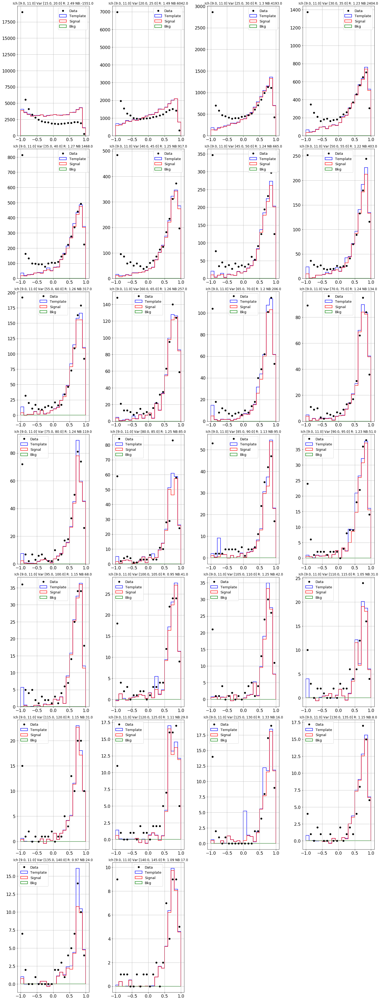

[1.5666, 2.5]
[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

[0, 1.4442] [15.0, 20.0] 14981.640758862097
[0, 1.4442] [20.0, 25.0] 7428.020385308557
[0, 1.4442] [25.0, 30.0] 4087.830210828384
[0, 1.4442] [30.0, 35.0] 2716.126828762539
[0, 1.4442] [35.0, 40.0] 1635.2000269998937
[0, 1.4442] [40.0, 45.0] 1001.9154912052372
[0, 1.4442] [45.0, 50.0] 771.0642467386391
[0, 1.4442] [50.0, 55.0] 626.562315024348
[0, 1.4442] [55.0, 60.0] 524.5039152295452
[0, 1.4442] [60.0, 65.0] 370.56222527899666
[0, 1.4442] [65.0, 70.0] 265.21226748078016
[0, 1.4442] [70.0, 75.0] 156.06824567060593
[0, 1.4442] [75.0, 80.0] 166.73353788049178
[0, 1.4442] [80.0, 85.0] 168.19410711314208
[0, 1.4442] [85.0, 90.0] 100.56479445704956
[0, 1.4442] [90.0, 95.0] 91.70037258740797
[0, 1.4442] [95.0, 100.0] 61.305457143462505
[0, 1.4442] [100.0, 105.0] 52.05924138435977
[0, 1.4442] [105.0, 110.0] 18.284901910228562
[0, 1.4442] [110.0, 115.0] 44.312486937646916
[0, 1.4442] [115.0, 120.0] 58.539338102829454
[0, 1.4442] [120.0, 125.0] 16.671558531581745
[0, 1.4442] [125.0, 130.0] 17.

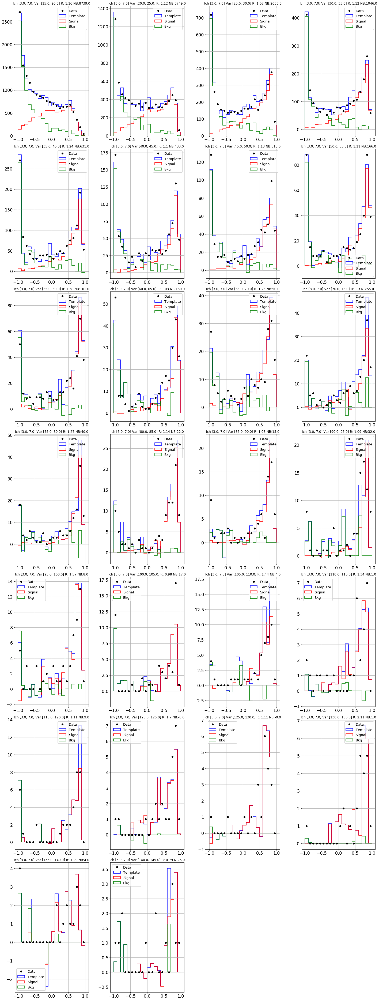

----------- dileptonPt -----------
[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0

[0, 1.4442] [130.0, 132.0] 11.851306399183324
[0, 1.4442] [132.0, 134.0] 9.138613468131691
[0, 1.4442] [134.0, 136.0] 36.488552660717794
[0, 1.4442] [136.0, 138.0] 28.184489458399746
[0, 1.4442] [138.0, 140.0] 48.94804544363268
[0, 1.4442] [140.0, 142.0] 1.9912709539447446
[0, 1.4442] [142.0, 144.0] 18.810773884216022
[1.5666, 2.5] [0.0, 2.0] 801.468578714612
[1.5666, 2.5] [2.0, 4.0] 1493.8738043909927
[1.5666, 2.5] [4.0, 6.0] 1577.063533423428
[1.5666, 2.5] [6.0, 8.0] 1384.6378709549972
[1.5666, 2.5] [8.0, 10.0] 1189.4011090540303
[1.5666, 2.5] [10.0, 12.0] 905.1433700201404
[1.5666, 2.5] [12.0, 14.0] 813.5569980485507
[1.5666, 2.5] [14.0, 16.0] 829.4105308466073
[1.5666, 2.5] [16.0, 18.0] 659.0949043137282
[1.5666, 2.5] [18.0, 20.0] 704.7873589786883
[1.5666, 2.5] [20.0, 22.0] 605.7198229282857
[1.5666, 2.5] [22.0, 24.0] 592.0453606729475
[1.5666, 2.5] [24.0, 26.0] 634.9079209947455
[1.5666, 2.5] [26.0, 28.0] 592.6260797116975
[1.5666, 2.5] [28.0, 30.0] 481.2902068937362
[1.5666, 2.5

[0, 1.4442] [16.0, 18.0] 6516
[0, 1.4442] [18.0, 20.0] 6442
[0, 1.4442] [20.0, 22.0] 6294
[0, 1.4442] [22.0, 24.0] 5853
[0, 1.4442] [24.0, 26.0] 5305
[0, 1.4442] [26.0, 28.0] 4714
[0, 1.4442] [28.0, 30.0] 4209
[0, 1.4442] [30.0, 32.0] 3795
[0, 1.4442] [32.0, 34.0] 3467
[0, 1.4442] [34.0, 36.0] 3083
[0, 1.4442] [36.0, 38.0] 2848
[0, 1.4442] [38.0, 40.0] 2617
[0, 1.4442] [40.0, 42.0] 2331
[0, 1.4442] [42.0, 44.0] 2187
[0, 1.4442] [44.0, 46.0] 1983
[0, 1.4442] [46.0, 48.0] 1889
[0, 1.4442] [48.0, 50.0] 1696
[0, 1.4442] [50.0, 52.0] 1623
[0, 1.4442] [52.0, 54.0] 1459
[0, 1.4442] [54.0, 56.0] 1337
[0, 1.4442] [56.0, 58.0] 1337
[0, 1.4442] [58.0, 60.0] 1168
[0, 1.4442] [60.0, 62.0] 1043
[0, 1.4442] [62.0, 64.0] 1002
[0, 1.4442] [64.0, 66.0] 989
[0, 1.4442] [66.0, 68.0] 869
[0, 1.4442] [68.0, 70.0] 796
[0, 1.4442] [70.0, 72.0] 789
[0, 1.4442] [72.0, 74.0] 672
[0, 1.4442] [74.0, 76.0] 658
[0, 1.4442] [76.0, 78.0] 598
[0, 1.4442] [78.0, 80.0] 552
[0, 1.4442] [80.0, 82.0] 509
[0, 1.4442] [82.0, 

[0, 1.4442] [0.0, 2.0] 0.4191091217090932
[0, 1.4442] [2.0, 4.0] 1.6446173779729087
[0, 1.4442] [4.0, 6.0] 3.2970454233629014
[0, 1.4442] [6.0, 8.0] 4.458476826310471
[0, 1.4442] [8.0, 10.0] 4.67171545990502
[0, 1.4442] [10.0, 12.0] 6.783779238066457
[0, 1.4442] [12.0, 14.0] 7.4516676475270875
[0, 1.4442] [14.0, 16.0] 8.31126594933805
[0, 1.4442] [16.0, 18.0] 9.45349980894424
[0, 1.4442] [18.0, 20.0] 9.413380151389655
[0, 1.4442] [20.0, 22.0] 12.195814406346912
[0, 1.4442] [22.0, 24.0] 11.518597284558032
[0, 1.4442] [24.0, 26.0] 11.605151363822284
[0, 1.4442] [26.0, 28.0] 12.531244529948138
[0, 1.4442] [28.0, 30.0] 14.234673101724875
[0, 1.4442] [30.0, 32.0] 11.86099080720306
[0, 1.4442] [32.0, 34.0] 12.734847797460064
[0, 1.4442] [34.0, 36.0] 13.619752267952817
[0, 1.4442] [36.0, 38.0] 12.394076393422434
[0, 1.4442] [38.0, 40.0] 13.344332601447604
[0, 1.4442] [40.0, 42.0] 11.581700434526825
[0, 1.4442] [42.0, 44.0] 14.020392833625879
[0, 1.4442] [44.0, 46.0] 11.567622270502486
[0, 1.4

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 133
[0, 1.4442] [2.0, 4.0] 394
[0, 1.4442] [4.0, 6.0] 535
[0, 1.4442] [6.0, 8.0] 706
[0, 1.4442] [8.0, 10.0] 724
[0, 1.4442] [10.0, 12.0] 883
[0, 1.4442] [12.0, 14.0] 989
[0, 1.4442] [14.0, 16.0] 1117
[0, 1.4442] [16.0, 18.0] 1261
[0, 1.4442] [18.0, 20.0] 1393
[0, 1.4442] [20.0, 22.0] 1521
[0, 1.4442] [22.0, 24.0] 1613
[0, 1.4442] [24.0, 26.0] 1747
[0, 1.4442] [26.0, 28.0] 1855
[0, 1.4442] [28.0, 30.0] 1957
[0, 1.4442] [30.0, 32.0] 2061
[0, 1.4442] [32.0, 34.0] 2059
[0, 1.4442] [34.0, 36.0] 2095
[0, 1.4442] [36.0, 38.0] 2288
[0, 1.4442] [38.0, 40.0] 2187
[0, 1.4442] [40.0, 42.0] 2071
[0, 1.4442] [42.0, 44.0] 2036
[0, 1.4442] [44.0, 46.0] 1937
[0, 1.4442] [46.0, 48.0] 1875
[0, 1.4442] [48.0, 50.0] 1862
[0, 1.4442] [50.0, 52.0] 1772
[0, 1.4442] [52.0, 54.0] 1580
[0, 1.4442] [54.0, 56.0] 1547
[0, 1.4442] [56.0, 58.0] 1348
[0, 1.4442] [58.0, 60.0] 1264
[0, 1.4442] [60.0, 62.0] 1173
[0, 1.4442] [62.0, 64.0] 1158
[0, 1.4442] [64.0, 66.0] 1034
[0, 1.4442] [66.0, 68.0] 1

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64.0, 66.0] 0.0
[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666,

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64.0, 66.0] 0.0
[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666, 2.5] [84.0, 86.0] 0.0
[1.5666, 2.5] [86.0, 88.0] 0.0
[1.5666, 2.5] [88.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 92.0] 0.0
[1.5666, 2.5] [92.0, 94.0] 0.0
[1.5666, 2.5] [94.0, 96.0] 0.0
[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64.0, 66.0] 0.0
[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666, 2.5] [84.0, 86.0] 0.0
[1.5666, 2.5] [86.0, 88.0] 0.0
[1.5666, 2.5] [88.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 92.0] 0.0
[1.5666, 2.5] [92.0, 94.0] 0.0
[1.5666, 2.5] [94.0, 96.0] 0.0
[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 118.0] 0.0
[1.5666, 2.5] [118.0, 120.0] 0.0
[1.5666, 2.5] [120

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [90.0, 92.0] 0.0
[0, 1.4442] [92.0, 94.0] 0.0
[0, 1.4442] [94.0, 96.0] 0.0
[0, 1.4442] [96.0, 98.0] 0.0
[0, 1.4442] [98.0, 100.0] 0.0
[0, 1.4442] [100.0, 102.0] 0.0
[0, 1.4442] [102.0, 104.0] 0.0
[0, 1.4442] [104.0, 106.0] 0.0
[0, 1.4442] [106.0, 108.0] 0.0
[0, 1.4442] [108.0, 110.0] 0.0
[0, 1.4442] [110.0, 112.0] 0.0
[0, 1.4442] [112.0, 114.0] 0.0
[0, 1.4442] [114.0, 116.0] 0.0
[0, 1.4442] [116.0, 118.0] 0.0
[0, 1.4442] [118.0, 120.0] 0.0
[0, 1.4442] [120.0, 122.0] 0.0
[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] [130.0, 132.0] 0.0
[0, 1.4442] [132.0, 134.0] 0.0
[0, 1.4442] [134.0, 136.0] 0.0
[0, 1.4442] [136.0, 138.0] 0.0
[0, 1.4442] [138.0, 140.0] 0.0
[0, 1.4442] [140.0, 142.0] 0.0
[0, 1.4442] [142.0, 144.0] 0.0
[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0]

[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [88.0, 90.0] 0.0
[0, 1.4442] [90.0, 92.0] 0.0
[0, 1.4442] [92.0, 94.0] 0.0
[0, 1.4442] [94.0, 96.0] 0.0
[0, 1.4442] [96.0, 98.0] 0.0
[0, 1.4442] [98.0, 100.0] 0.0
[0, 1.4442] [100.0, 102.0] 0.0
[0, 1.4442] [102.0, 104.0] 0.0
[0, 1.4442] [104.0, 106.0] 0.0
[0, 1.4442] [106.0, 108.0] 0.0
[0, 1.4442] [108.0, 110.0] 0.0
[0, 1.4442] [110.0, 112.0] 0.0
[0, 1.4442] [112.0, 114.0] 0.0
[0, 1.4442] [114.0, 116.0] 0.0
[0, 1.4442] [116.0, 118.0] 0.0
[0, 1.4442] [118.0, 120.0] 0.0
[0, 1.4442] [120.0, 122.0] 0.0
[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] 

[0, 1.4442] [142.0, 144.0] 0.0
[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62

[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 118.0] 0.0
[1.5666, 2.5] [118.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 122.0] 0.0
[1.5666, 2.5] [122.0, 124.0] 0.0
[1.5666, 2.5] [124.0, 126.0] 0.0
[1.5666, 2.5] [126.0, 128.0] 0.0
[1.5666, 2.5] [128.0, 130.0] 0.0
[1.5666, 2.5] [130.0, 132.0] 0.0
[1.5666, 2.5] [132.0, 134.0] 0.0
[1.5666, 2.5] [134.0, 136.0] 0.0
[1.5666, 2.5] [136.0, 138.0] 0.0
[1.5666, 2.5] [138.0, 140.0] 0.0
[1.5666, 2.5] [140.0, 142.0] 0.0
[1.5666, 2.5] [142.0, 144.0] 0.0
[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [134.0, 136.0] 0.0
[0, 1.4442] [136.0, 138.0] 0.0
[0, 1.4442] [138.0, 140.0] 0.0
[0, 1.4442] [140.0, 142.0] 0.0
[0, 1.4442] [142.0, 144.0] 0.0
[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54

[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666, 2.5] [84.0, 86.0] 0.0
[1.5666, 2.5] [86.0, 88.0] 0.0
[1.5666, 2.5] [88.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 92.0] 0.0
[1.5666, 2.5] [92.0, 94.0] 0.0
[1.5666, 2.5] [94.0, 96.0] 0.0
[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 118.0] 0.0
[1.5666, 2.5] [118.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 122.0] 0.0
[1.5666, 2.5] [122.0, 124.0] 0.0
[1.5666, 2.5] [124.0, 126.0] 0.0
[1.5666, 2.5] [126.0, 128.0] 0.0
[1.5666, 2

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666, 2.5] [84.0, 86.0] 0.0
[1.5666, 2.5] [86.0, 88.0] 0.0
[1.5666, 2.5] [88.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 92.0] 0.0
[1.5666, 2.5] [92.0, 94.0] 0.0
[1.5666, 2.5] [94.0, 96.0] 0.0
[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 118.0] 0.0
[1.5666, 2.5] [118.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 122.0] 0.0
[1.5666, 2.5] [122.0, 124.0] 0.0
[1.5666, 2.5] [124.0, 126.0] 0.0
[1.5666, 2.5] [126.0, 128.0] 0.0
[1.5666, 2.5] [128.0, 130.0] 0.0
[1.5666, 2.5] [130.0, 132.0] 0.0
[1.5666, 2.5] [132.0, 134.0] 0.0
[1.5

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64.0, 66.0] 0.0
[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666, 2.5] [84.0, 86.0] 0.0
[1.5666, 2.5] [86.0, 88.0] 0.0
[1.5666, 2.5] [88.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 92.0] 0.0
[1.5666, 2.5] [92.0, 94.0] 0.0
[1.5666, 2.5] [94.0, 96.0] 0.0
[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666,

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64.0, 66.0] 0.0
[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666, 2.5] [84.0, 86.0] 0.0
[1.5666, 2.5] [86.0, 88.0] 0.0
[1.5666, 2.5] [88.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 92.0] 0.0
[1.5666, 2.5] [92.0, 94.0] 0.0
[1.5666, 2.5] [94.0, 96.0] 0.0
[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666,

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [88.0, 90.0] 0.0
[1.5666, 2.5] [90.0, 92.0] 0.0
[1.5666, 2.5] [92.0, 94.0] 0.0
[1.5666, 2.5] [94.0, 96.0] 0.0
[1.5666, 2.5] [96.0, 98.0] 0.0
[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 118.0] 0.0
[1.5666, 2.5] [118.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 122.0] 0.0
[1.5666, 2.5] [122.0, 124.0] 0.0
[1.5666, 2.5] [124.0, 126.0] 0.0
[1.5666, 2.5] [126.0, 128.0] 0.0
[1.5666, 2.5] [128.0, 130.0] 0.0
[1.5666, 2.5] [130.0, 132.0] 0.0
[1.5666, 2.5] [132.0, 134.0] 0.0
[1.5666, 2.5] [134.0, 136.0] 0.0
[1.5666, 2.5] [136.0, 138.0] 0.0
[1.5666, 2.5] [138.0, 140.0] 0.0
[1.5666, 2.5] [140.0, 142.0] 0.0
[1.5666, 2.5] [142.0, 144.0] 0.0
[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

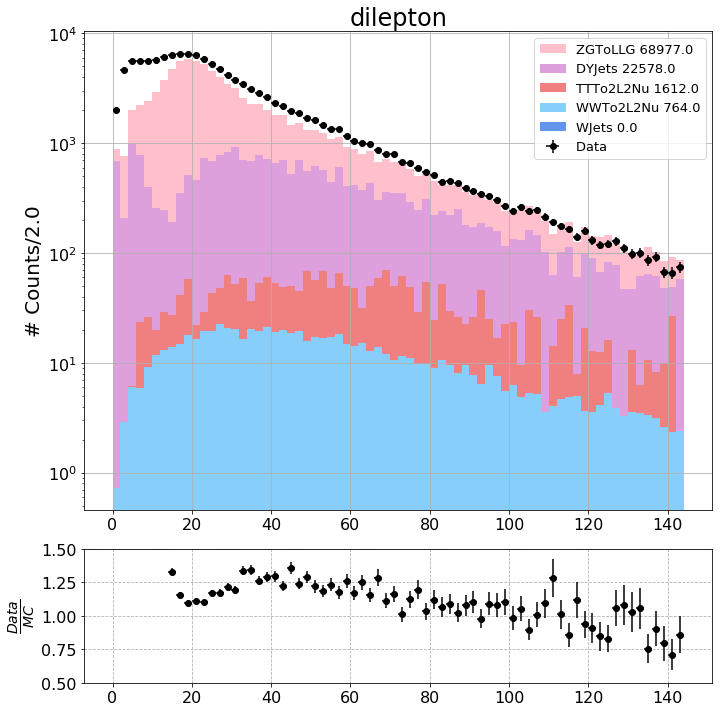

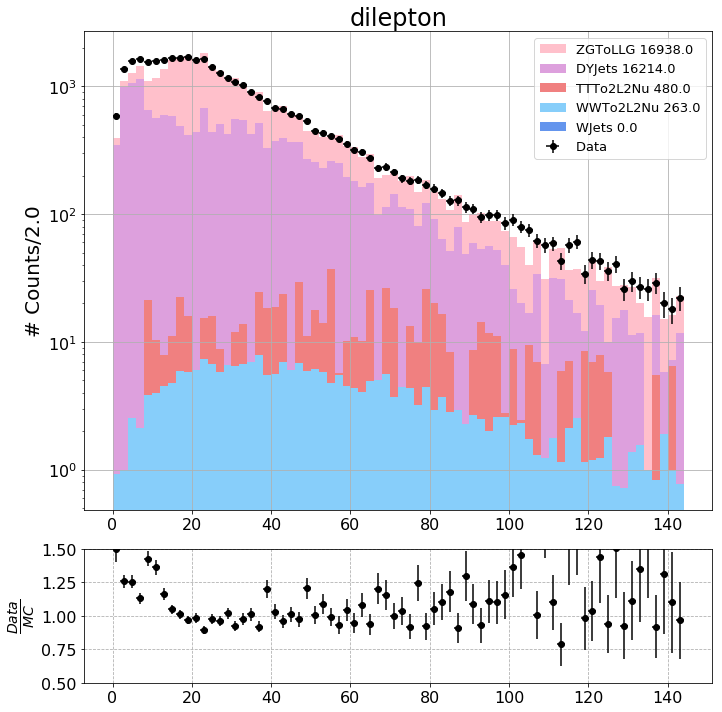

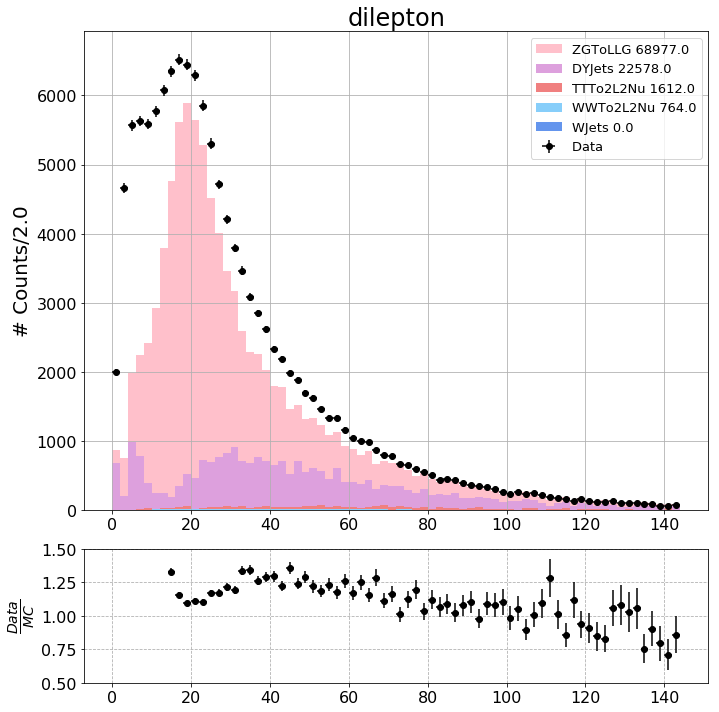

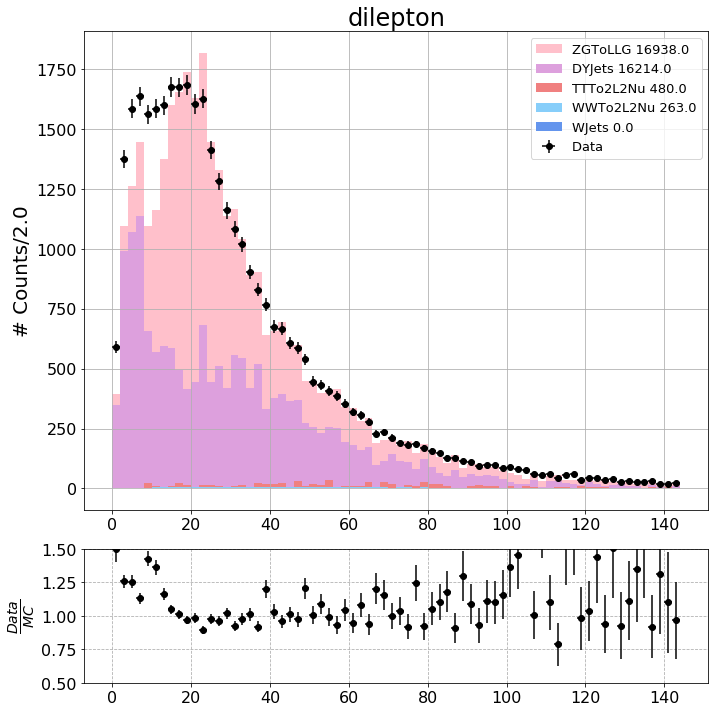

[0, 1.4442]
[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442]

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

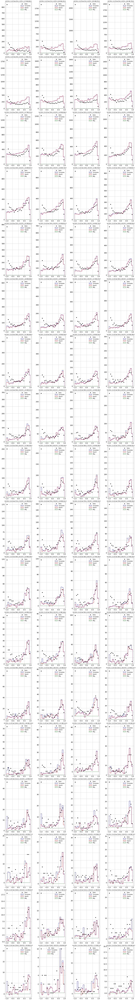

[1.5666, 2.5]
[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.14897

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

[0, 1.4442] [0.0, 2.0] 96.49612314505714
[0, 1.4442] [2.0, 4.0] 308.83706191251923
[0, 1.4442] [4.0, 6.0] 295.74400590728845
[0, 1.4442] [6.0, 8.0] 352.9558916409682
[0, 1.4442] [8.0, 10.0] 468.72741288548417
[0, 1.4442] [10.0, 12.0] 512.9521852118146
[0, 1.4442] [12.0, 14.0] 592.1572422027217
[0, 1.4442] [14.0, 16.0] 631.075723983275
[0, 1.4442] [16.0, 18.0] 658.0016697378189
[0, 1.4442] [18.0, 20.0] 738.5182422261755
[0, 1.4442] [20.0, 22.0] 1106.4929474911876
[0, 1.4442] [22.0, 24.0] 1100.9434483523928
[0, 1.4442] [24.0, 26.0] 1219.3475915919967
[0, 1.4442] [26.0, 28.0] 1213.4090069972283
[0, 1.4442] [28.0, 30.0] 1204.6010075112206
[0, 1.4442] [30.0, 32.0] 1449.7714421690282
[0, 1.4442] [32.0, 34.0] 1352.1546549901525
[0, 1.4442] [34.0, 36.0] 1312.8273674138188
[0, 1.4442] [36.0, 38.0] 1347.7322743939965
[0, 1.4442] [38.0, 40.0] 1419.8409913199928
[0, 1.4442] [40.0, 42.0] 1414.5057500337145
[0, 1.4442] [42.0, 44.0] 1389.6195525887638
[0, 1.4442] [44.0, 46.0] 1106.148976563106
[0, 1.

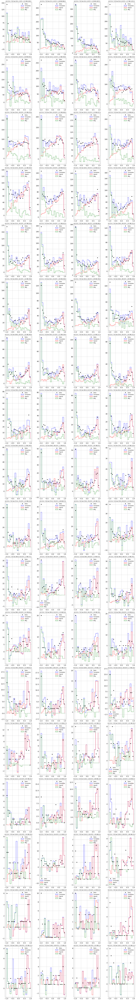

----------- llgPt -----------
[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.

[0, 1.4442] [0.0, 2.0] 229.14567378461265
[0, 1.4442] [2.0, 4.0] 761.2073028226215
[0, 1.4442] [4.0, 6.0] 1084.7869824993204
[0, 1.4442] [6.0, 8.0] 1476.624953215236
[0, 1.4442] [8.0, 10.0] 2018.812763219375
[0, 1.4442] [10.0, 12.0] 2490.0716677925984
[0, 1.4442] [12.0, 14.0] 3335.9647547941204
[0, 1.4442] [14.0, 16.0] 3926.097555581521
[0, 1.4442] [16.0, 18.0] 4310.729574817946
[0, 1.4442] [18.0, 20.0] 4494.993340939654
[0, 1.4442] [20.0, 22.0] 4004.8514628277653
[0, 1.4442] [22.0, 24.0] 3783.6035169524175
[0, 1.4442] [24.0, 26.0] 3144.8097844944496
[0, 1.4442] [26.0, 28.0] 2544.353117863012
[0, 1.4442] [28.0, 30.0] 2607.6886023383613
[0, 1.4442] [30.0, 32.0] 1962.5036533751866
[0, 1.4442] [32.0, 34.0] 1903.2790234660586
[0, 1.4442] [34.0, 36.0] 1698.9216109152603
[0, 1.4442] [36.0, 38.0] 1512.741387399343
[0, 1.4442] [38.0, 40.0] 1344.4580346670093
[0, 1.4442] [40.0, 42.0] 1108.979378227568
[0, 1.4442] [42.0, 44.0] 1024.4722671745778
[0, 1.4442] [44.0, 46.0] 886.5457396448596
[0, 1.4

[0, 1.4442] [0.0, 2.0] 2186
[0, 1.4442] [2.0, 4.0] 5263
[0, 1.4442] [4.0, 6.0] 6194
[0, 1.4442] [6.0, 8.0] 6373
[0, 1.4442] [8.0, 10.0] 6371
[0, 1.4442] [10.0, 12.0] 6374
[0, 1.4442] [12.0, 14.0] 6639
[0, 1.4442] [14.0, 16.0] 6880
[0, 1.4442] [16.0, 18.0] 6977
[0, 1.4442] [18.0, 20.0] 6805
[0, 1.4442] [20.0, 22.0] 6424
[0, 1.4442] [22.0, 24.0] 5995
[0, 1.4442] [24.0, 26.0] 5146
[0, 1.4442] [26.0, 28.0] 4708
[0, 1.4442] [28.0, 30.0] 4254
[0, 1.4442] [30.0, 32.0] 3724
[0, 1.4442] [32.0, 34.0] 3316
[0, 1.4442] [34.0, 36.0] 3040
[0, 1.4442] [36.0, 38.0] 2686
[0, 1.4442] [38.0, 40.0] 2430
[0, 1.4442] [40.0, 42.0] 2200
[0, 1.4442] [42.0, 44.0] 1924
[0, 1.4442] [44.0, 46.0] 1745
[0, 1.4442] [46.0, 48.0] 1666
[0, 1.4442] [48.0, 50.0] 1466
[0, 1.4442] [50.0, 52.0] 1345
[0, 1.4442] [52.0, 54.0] 1205
[0, 1.4442] [54.0, 56.0] 1099
[0, 1.4442] [56.0, 58.0] 1074
[0, 1.4442] [58.0, 60.0] 986
[0, 1.4442] [60.0, 62.0] 904
[0, 1.4442] [62.0, 64.0] 795
[0, 1.4442] [64.0, 66.0] 713
[0, 1.4442] [66.0, 68.0

[1.5666, 2.5] [16.0, 18.0] 3.5768362328774055
[1.5666, 2.5] [18.0, 20.0] 3.721708520853922
[1.5666, 2.5] [20.0, 22.0] 3.401712220047021
[1.5666, 2.5] [22.0, 24.0] 4.367996766244121
[1.5666, 2.5] [24.0, 26.0] 4.351727169698706
[1.5666, 2.5] [26.0, 28.0] 5.113548643285142
[1.5666, 2.5] [28.0, 30.0] 4.638650499621231
[1.5666, 2.5] [30.0, 32.0] 3.836304742839294
[1.5666, 2.5] [32.0, 34.0] 4.130491342195089
[1.5666, 2.5] [34.0, 36.0] 4.2797461843776725
[1.5666, 2.5] [36.0, 38.0] 4.212199345730702
[1.5666, 2.5] [38.0, 40.0] 3.951001103587732
[1.5666, 2.5] [40.0, 42.0] 4.276518998723583
[1.5666, 2.5] [42.0, 44.0] 3.339756039848907
[1.5666, 2.5] [44.0, 46.0] 3.0319997696720113
[1.5666, 2.5] [46.0, 48.0] 3.2640397318646253
[1.5666, 2.5] [48.0, 50.0] 3.9039092521813687
[1.5666, 2.5] [50.0, 52.0] 3.036627854728264
[1.5666, 2.5] [52.0, 54.0] 3.326450767625952
[1.5666, 2.5] [54.0, 56.0] 3.787209957240788
[1.5666, 2.5] [56.0, 58.0] 3.8961413328802945
[1.5666, 2.5] [58.0, 60.0] 2.8644123048464962
[1.

[0, 1.4442] [0.0, 2.0] 155.97083930788926
[0, 1.4442] [2.0, 4.0] 493.7482178232394
[0, 1.4442] [4.0, 6.0] 842.4039618684853
[0, 1.4442] [6.0, 8.0] 1172.5992348918676
[0, 1.4442] [8.0, 10.0] 1563.6354761929695
[0, 1.4442] [10.0, 12.0] 1609.1695355821873
[0, 1.4442] [12.0, 14.0] 1811.0487954276234
[0, 1.4442] [14.0, 16.0] 2103.018253298592
[0, 1.4442] [16.0, 18.0] 1917.212549817045
[0, 1.4442] [18.0, 20.0] 1909.1385346337245
[0, 1.4442] [20.0, 22.0] 1880.80767119619
[0, 1.4442] [22.0, 24.0] 1601.1642255892245
[0, 1.4442] [24.0, 26.0] 1398.8235829601317
[0, 1.4442] [26.0, 28.0] 1474.4893961303258
[0, 1.4442] [28.0, 30.0] 1366.5332901212737
[0, 1.4442] [30.0, 32.0] 1232.9535315113603
[0, 1.4442] [32.0, 34.0] 1104.259778730927
[0, 1.4442] [34.0, 36.0] 1001.9838229637282
[0, 1.4442] [36.0, 38.0] 999.4272437814947
[0, 1.4442] [38.0, 40.0] 682.8810041648146
[0, 1.4442] [40.0, 42.0] 696.911524395814
[0, 1.4442] [42.0, 44.0] 634.0072807826165
[0, 1.4442] [44.0, 46.0] 552.0540452421466
[0, 1.4442

[0, 1.4442] [0.0, 2.0] 234
[0, 1.4442] [2.0, 4.0] 779
[0, 1.4442] [4.0, 6.0] 1244
[0, 1.4442] [6.0, 8.0] 1620
[0, 1.4442] [8.0, 10.0] 2031
[0, 1.4442] [10.0, 12.0] 2399
[0, 1.4442] [12.0, 14.0] 2517
[0, 1.4442] [14.0, 16.0] 2784
[0, 1.4442] [16.0, 18.0] 2895
[0, 1.4442] [18.0, 20.0] 2928
[0, 1.4442] [20.0, 22.0] 2901
[0, 1.4442] [22.0, 24.0] 2884
[0, 1.4442] [24.0, 26.0] 2588
[0, 1.4442] [26.0, 28.0] 2449
[0, 1.4442] [28.0, 30.0] 2421
[0, 1.4442] [30.0, 32.0] 2243
[0, 1.4442] [32.0, 34.0] 2025
[0, 1.4442] [34.0, 36.0] 1837
[0, 1.4442] [36.0, 38.0] 1757
[0, 1.4442] [38.0, 40.0] 1569
[0, 1.4442] [40.0, 42.0] 1479
[0, 1.4442] [42.0, 44.0] 1330
[0, 1.4442] [44.0, 46.0] 1151
[0, 1.4442] [46.0, 48.0] 1128
[0, 1.4442] [48.0, 50.0] 1036
[0, 1.4442] [50.0, 52.0] 962
[0, 1.4442] [52.0, 54.0] 911
[0, 1.4442] [54.0, 56.0] 810
[0, 1.4442] [56.0, 58.0] 832
[0, 1.4442] [58.0, 60.0] 686
[0, 1.4442] [60.0, 62.0] 628
[0, 1.4442] [62.0, 64.0] 627
[0, 1.4442] [64.0, 66.0] 556
[0, 1.4442] [66.0, 68.0] 486


[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [88.0, 90.0] 0.0
[0, 1.4442] [90.0, 92.0] 0.0
[0, 1.4442] [92.0, 94.0] 0.0
[0, 1.4442] [94.0, 96.0] 0.0
[0, 1.4442] [96.0, 98.0] 0.0
[0, 1.4442] [98.0, 100.0] 0.0
[0, 1.4442] [100.0, 102.0] 0.0
[0, 1.4442] [102.0, 104.0] 0.0
[0, 1.4442] [104.0, 106.0] 0.0
[0, 1.4442] [106.0, 108.0] 0.0
[0, 1.4442] [108.0, 110.0] 0.0
[0, 1.4442] [110.0, 112.0] 0.0
[0, 1.4442] [112.0, 114.0] 0.0
[0, 1.4442] [114.0, 116.0] 0.0
[0, 1.4442] [116.0, 118.0] 0.0
[0, 1.4442] [118.0, 120.0] 0.0
[0, 1.4442] [120.0, 122.0] 0.0
[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] [130.0, 132.0] 0.0
[0, 1.4442] [132.0, 134.0] 0.0
[0, 1.4442] [134.0, 136.0] 0.0
[0, 1.4442] [136.0, 138.0] 0.0
[0, 1.4442] [138.0, 140.0] 0.0
[0, 1.4442] [140.0, 142.0] 0.0
[0, 1.4442] [142.0, 144.0] 0.0
[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.

[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64

[1.5666, 2.5] [98.0, 100.0] 0.0
[1.5666, 2.5] [100.0, 102.0] 0.0
[1.5666, 2.5] [102.0, 104.0] 0.0
[1.5666, 2.5] [104.0, 106.0] 0.0
[1.5666, 2.5] [106.0, 108.0] 0.0
[1.5666, 2.5] [108.0, 110.0] 0.0
[1.5666, 2.5] [110.0, 112.0] 0.0
[1.5666, 2.5] [112.0, 114.0] 0.0
[1.5666, 2.5] [114.0, 116.0] 0.0
[1.5666, 2.5] [116.0, 118.0] 0.0
[1.5666, 2.5] [118.0, 120.0] 0.0
[1.5666, 2.5] [120.0, 122.0] 0.0
[1.5666, 2.5] [122.0, 124.0] 0.0
[1.5666, 2.5] [124.0, 126.0] 0.0
[1.5666, 2.5] [126.0, 128.0] 0.0
[1.5666, 2.5] [128.0, 130.0] 0.0
[1.5666, 2.5] [130.0, 132.0] 0.0
[1.5666, 2.5] [132.0, 134.0] 0.0
[1.5666, 2.5] [134.0, 136.0] 0.0
[1.5666, 2.5] [136.0, 138.0] 0.0
[1.5666, 2.5] [138.0, 140.0] 0.0
[1.5666, 2.5] [140.0, 142.0] 0.0
[1.5666, 2.5] [142.0, 144.0] 0.0
[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [88.0, 90.0] 0.0
[0, 1.4442] [90.0, 92.0] 0.0
[0, 1.4442] [92.0, 94.0] 0.0
[0, 1.4442] [94.0, 96.0] 0.0
[0, 1.4442] [96.0, 98.0] 0.0
[0, 1.4442] [98.0, 100.0] 0.0
[0, 1.4442] [100.0, 102.0] 0.0
[0, 1.4442] [102.0, 104.0] 0.0
[0, 1.4442] [104.0, 106.0] 0.0
[0, 1.4442] [106.0, 108.0] 0.0
[0, 1.4442] [108.0, 110.0] 0.0
[0, 1.4442] [110.0, 112.0] 0.0
[0, 1.4442] [112.0, 114.0] 0.0
[0, 1.4442] [114.0, 116.0] 0.0
[0, 1.4442] [116.0, 118.0] 0.0
[0, 1.4442] [118.0, 120.0] 0.0
[0, 1.4442] [120.0, 122.0] 0.0
[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] 

[0, 1.4442] [100.0, 102.0] 0.0
[0, 1.4442] [102.0, 104.0] 0.0
[0, 1.4442] [104.0, 106.0] 0.0
[0, 1.4442] [106.0, 108.0] 0.0
[0, 1.4442] [108.0, 110.0] 0.0
[0, 1.4442] [110.0, 112.0] 0.0
[0, 1.4442] [112.0, 114.0] 0.0
[0, 1.4442] [114.0, 116.0] 0.0
[0, 1.4442] [116.0, 118.0] 0.0
[0, 1.4442] [118.0, 120.0] 0.0
[0, 1.4442] [120.0, 122.0] 0.0
[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] [130.0, 132.0] 0.0
[0, 1.4442] [132.0, 134.0] 0.0
[0, 1.4442] [134.0, 136.0] 0.0
[0, 1.4442] [136.0, 138.0] 0.0
[0, 1.4442] [138.0, 140.0] 0.0
[0, 1.4442] [140.0, 142.0] 0.0
[0, 1.4442] [142.0, 144.0] 0.0
[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [88.0, 90.0] 0.0
[0, 1.4442] [90.0, 92.0] 0.0
[0, 1.4442] [92.0, 94.0] 0.0
[0, 1.4442] [94.0, 96.0] 0.0
[0, 1.4442] [96.0, 98.0] 0.0
[0, 1.4442] [98.0, 100.0] 0.0
[0, 1.4442] [100.0, 102.0] 0.0
[0, 1.4442] [102.0, 104.0] 0.0
[0, 1.4442] [104.0, 106.0] 0.0
[0, 1.4442] [106.0, 108.0] 0.0
[0, 1.4442] [108.0, 110.0] 0.0
[0, 1.4442] [110.0, 112.0] 0.0
[0, 1.4442] [112.0, 114.0] 0.0
[0, 1.4442] [114.0, 116.0] 0.0
[0, 1.4442] [116.0, 118.0] 0.0
[0, 1.4442] [118.0, 120.0] 0.0
[0, 1.4442] [120.0, 122.0] 0.0
[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] [130.0, 132.0] 0.0
[0, 1.4442] [132.0, 134.0] 0.0
[0, 1.4442] [134.0, 136.0] 0.0
[0, 1.4442] [136.0, 138.0] 0.0
[0, 1.4442] [138.0, 140.0] 0.0
[0, 1.4442] [140.0, 142.0] 0.0


[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64

[0, 1.4442] [116.0, 118.0] 0.0
[0, 1.4442] [118.0, 120.0] 0.0
[0, 1.4442] [120.0, 122.0] 0.0
[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] [130.0, 132.0] 0.0
[0, 1.4442] [132.0, 134.0] 0.0
[0, 1.4442] [134.0, 136.0] 0.0
[0, 1.4442] [136.0, 138.0] 0.0
[0, 1.4442] [138.0, 140.0] 0.0
[0, 1.4442] [140.0, 142.0] 0.0
[0, 1.4442] [142.0, 144.0] 0.0
[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36

[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] [130.0, 132.0] 0.0
[0, 1.4442] [132.0, 134.0] 0.0
[0, 1.4442] [134.0, 136.0] 0.0
[0, 1.4442] [136.0, 138.0] 0.0
[0, 1.4442] [138.0, 140.0] 0.0
[0, 1.4442] [140.0, 142.0] 0.0
[0, 1.4442] [142.0, 144.0] 0.0
[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42

[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64

[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64.0, 66.0] 0.0
[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666, 2.5] [76.0, 78.0] 0.0
[1.5666, 2.5] [78.0, 80.0] 0.0
[1.5666, 2.5] [80.0, 82.0] 0.0
[1.5666, 2.5] [82.0, 84.0] 0.0
[1.5666, 2.5] [84.0, 86.0] 0.0
[1.5666, 2.5] [86.0, 88.0] 0.0
[1.5666,

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64

[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [88.0, 90.0] 0.0
[0, 1.4442] [90.0, 92.0] 0.0
[0, 1.4442] [92.0, 94.0] 0.0
[0, 1.4442] [94.0, 96.0] 0.0
[0, 1.4442] [96.0, 98.0] 0.0
[0, 1.4442] [98.0, 100.0] 0.0
[0, 1.4442] [100.0, 102.0] 0.0
[0, 1.4442] [102.0, 104.0] 0.0
[0, 1.4442] [104.0, 106.0] 0.0
[0, 1.4442] [106.0, 108.0] 0.0
[0, 1.4442] [108.0, 110.0] 0.0
[0, 1.4442] [110.0, 112.0] 0.0
[0, 1.4442] [112.0, 114.0] 0.0
[0, 1.4442] [114.0, 116.0] 0.0
[0, 1.4442] [116.0, 118.0] 0.0
[0, 1.4442] [118.0, 120.0] 0.0
[0, 1.4442] [120.0, 122.0] 0.0
[0, 1.4442] [122.0, 124.0] 0.0
[0, 1.4442] [124.0, 126.0] 0.0
[0, 1.4442] [126.0, 128.0] 0.0
[0, 1.4442] [128.0, 130.0] 0.0
[0, 1.4442] 

[1.5666, 2.5] [0.0, 2.0] 0.0
[1.5666, 2.5] [2.0, 4.0] 0.0
[1.5666, 2.5] [4.0, 6.0] 0.0
[1.5666, 2.5] [6.0, 8.0] 0.0
[1.5666, 2.5] [8.0, 10.0] 0.0
[1.5666, 2.5] [10.0, 12.0] 0.0
[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64

[1.5666, 2.5] [12.0, 14.0] 0.0
[1.5666, 2.5] [14.0, 16.0] 0.0
[1.5666, 2.5] [16.0, 18.0] 0.0
[1.5666, 2.5] [18.0, 20.0] 0.0
[1.5666, 2.5] [20.0, 22.0] 0.0
[1.5666, 2.5] [22.0, 24.0] 0.0
[1.5666, 2.5] [24.0, 26.0] 0.0
[1.5666, 2.5] [26.0, 28.0] 0.0
[1.5666, 2.5] [28.0, 30.0] 0.0
[1.5666, 2.5] [30.0, 32.0] 0.0
[1.5666, 2.5] [32.0, 34.0] 0.0
[1.5666, 2.5] [34.0, 36.0] 0.0
[1.5666, 2.5] [36.0, 38.0] 0.0
[1.5666, 2.5] [38.0, 40.0] 0.0
[1.5666, 2.5] [40.0, 42.0] 0.0
[1.5666, 2.5] [42.0, 44.0] 0.0
[1.5666, 2.5] [44.0, 46.0] 0.0
[1.5666, 2.5] [46.0, 48.0] 0.0
[1.5666, 2.5] [48.0, 50.0] 0.0
[1.5666, 2.5] [50.0, 52.0] 0.0
[1.5666, 2.5] [52.0, 54.0] 0.0
[1.5666, 2.5] [54.0, 56.0] 0.0
[1.5666, 2.5] [56.0, 58.0] 0.0
[1.5666, 2.5] [58.0, 60.0] 0.0
[1.5666, 2.5] [60.0, 62.0] 0.0
[1.5666, 2.5] [62.0, 64.0] 0.0
[1.5666, 2.5] [64.0, 66.0] 0.0
[1.5666, 2.5] [66.0, 68.0] 0.0
[1.5666, 2.5] [68.0, 70.0] 0.0
[1.5666, 2.5] [70.0, 72.0] 0.0
[1.5666, 2.5] [72.0, 74.0] 0.0
[1.5666, 2.5] [74.0, 76.0] 0.0
[1.5666,

[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [88.0, 90.0] 0.0
[0, 1.4442] [90.0, 92.0] 0.0
[0, 1.4442] [92.0, 94.0] 0.0
[0, 1.4442] [94.0, 96.0] 0.0
[0, 1.4442] [96.0, 98.0] 0.0
[0, 1.4442] [98.0, 100.0] 0.0
[0, 1.4442] [100.0, 102.0] 0.0
[0, 1.4442]

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [88.0, 90.0] 0.0
[0, 1.4442] [90.0, 92.0] 0.0
[0, 1.4442] [9

[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0] 0.0
[0, 1.4442] [70.0, 72.0] 0.0
[0, 1.4442] [72.0, 74.0] 0.0
[0, 1.4442] [74.0, 76.0] 0.0
[0, 1.4442] [76.0, 78.0] 0.0
[0, 1.4442] [78.0, 80.0] 0.0
[0, 1.4442] [80.0, 82.0] 0.0
[0, 1.4442] [82.0, 84.0] 0.0
[0, 1.4442] [84.0, 86.0] 0.0
[0, 1.4442] [86.0, 88.0] 0.0
[0, 1.4442] [88.0, 90.0] 0.0
[0, 1.4442] [90.0, 92.0] 0.0
[0, 1.4442] [92.0, 94.0] 0.0
[0, 1.4442] [9

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 0.0
[0, 1.4442] [2.0, 4.0] 0.0
[0, 1.4442] [4.0, 6.0] 0.0
[0, 1.4442] [6.0, 8.0] 0.0
[0, 1.4442] [8.0, 10.0] 0.0
[0, 1.4442] [10.0, 12.0] 0.0
[0, 1.4442] [12.0, 14.0] 0.0
[0, 1.4442] [14.0, 16.0] 0.0
[0, 1.4442] [16.0, 18.0] 0.0
[0, 1.4442] [18.0, 20.0] 0.0
[0, 1.4442] [20.0, 22.0] 0.0
[0, 1.4442] [22.0, 24.0] 0.0
[0, 1.4442] [24.0, 26.0] 0.0
[0, 1.4442] [26.0, 28.0] 0.0
[0, 1.4442] [28.0, 30.0] 0.0
[0, 1.4442] [30.0, 32.0] 0.0
[0, 1.4442] [32.0, 34.0] 0.0
[0, 1.4442] [34.0, 36.0] 0.0
[0, 1.4442] [36.0, 38.0] 0.0
[0, 1.4442] [38.0, 40.0] 0.0
[0, 1.4442] [40.0, 42.0] 0.0
[0, 1.4442] [42.0, 44.0] 0.0
[0, 1.4442] [44.0, 46.0] 0.0
[0, 1.4442] [46.0, 48.0] 0.0
[0, 1.4442] [48.0, 50.0] 0.0
[0, 1.4442] [50.0, 52.0] 0.0
[0, 1.4442] [52.0, 54.0] 0.0
[0, 1.4442] [54.0, 56.0] 0.0
[0, 1.4442] [56.0, 58.0] 0.0
[0, 1.4442] [58.0, 60.0] 0.0
[0, 1.4442] [60.0, 62.0] 0.0
[0, 1.4442] [62.0, 64.0] 0.0
[0, 1.4442] [64.0, 66.0] 0.0
[0, 1.4442] [66.0, 68.0] 0.0
[0, 1.4442] [68.0, 70.0

[0, 1.4442] [0.0, 2.0] 155.97083930788926
[0, 1.4442] [2.0, 4.0] 493.7482178232394
[0, 1.4442] [4.0, 6.0] 842.4039618684853
[0, 1.4442] [6.0, 8.0] 1172.5992348918676
[0, 1.4442] [8.0, 10.0] 1563.6354761929695
[0, 1.4442] [10.0, 12.0] 1609.1695355821873
[0, 1.4442] [12.0, 14.0] 1811.0487954276234
[0, 1.4442] [14.0, 16.0] 2103.018253298592
[0, 1.4442] [16.0, 18.0] 1917.212549817045
[0, 1.4442] [18.0, 20.0] 1909.1385346337245
[0, 1.4442] [20.0, 22.0] 1880.80767119619
[0, 1.4442] [22.0, 24.0] 1601.1642255892245
[0, 1.4442] [24.0, 26.0] 1398.8235829601317
[0, 1.4442] [26.0, 28.0] 1474.4893961303258
[0, 1.4442] [28.0, 30.0] 1366.5332901212737
[0, 1.4442] [30.0, 32.0] 1232.9535315113603
[0, 1.4442] [32.0, 34.0] 1104.259778730927
[0, 1.4442] [34.0, 36.0] 1001.9838229637282
[0, 1.4442] [36.0, 38.0] 999.4272437814947
[0, 1.4442] [38.0, 40.0] 682.8810041648146
[0, 1.4442] [40.0, 42.0] 696.911524395814
[0, 1.4442] [42.0, 44.0] 634.0072807826165
[0, 1.4442] [44.0, 46.0] 552.0540452421466
[0, 1.4442

[0, 1.4442] [0.0, 2.0] 155.97083930788926
[0, 1.4442] [2.0, 4.0] 493.7482178232394
[0, 1.4442] [4.0, 6.0] 842.4039618684853
[0, 1.4442] [6.0, 8.0] 1172.5992348918676
[0, 1.4442] [8.0, 10.0] 1563.6354761929695
[0, 1.4442] [10.0, 12.0] 1609.1695355821873
[0, 1.4442] [12.0, 14.0] 1811.0487954276234
[0, 1.4442] [14.0, 16.0] 2103.018253298592
[0, 1.4442] [16.0, 18.0] 1917.212549817045
[0, 1.4442] [18.0, 20.0] 1909.1385346337245
[0, 1.4442] [20.0, 22.0] 1880.80767119619
[0, 1.4442] [22.0, 24.0] 1601.1642255892245
[0, 1.4442] [24.0, 26.0] 1398.8235829601317
[0, 1.4442] [26.0, 28.0] 1474.4893961303258
[0, 1.4442] [28.0, 30.0] 1366.5332901212737
[0, 1.4442] [30.0, 32.0] 1232.9535315113603
[0, 1.4442] [32.0, 34.0] 1104.259778730927
[0, 1.4442] [34.0, 36.0] 1001.9838229637282
[0, 1.4442] [36.0, 38.0] 999.4272437814947
[0, 1.4442] [38.0, 40.0] 682.8810041648146
[0, 1.4442] [40.0, 42.0] 696.911524395814
[0, 1.4442] [42.0, 44.0] 634.0072807826165
[0, 1.4442] [44.0, 46.0] 552.0540452421466
[0, 1.4442

[0, 1.4442] [0.0, 2.0] 155.97083930788926
[0, 1.4442] [2.0, 4.0] 493.7482178232394
[0, 1.4442] [4.0, 6.0] 842.4039618684853
[0, 1.4442] [6.0, 8.0] 1172.5992348918676
[0, 1.4442] [8.0, 10.0] 1563.6354761929695
[0, 1.4442] [10.0, 12.0] 1609.1695355821873
[0, 1.4442] [12.0, 14.0] 1811.0487954276234
[0, 1.4442] [14.0, 16.0] 2103.018253298592
[0, 1.4442] [16.0, 18.0] 1917.212549817045
[0, 1.4442] [18.0, 20.0] 1909.1385346337245
[0, 1.4442] [20.0, 22.0] 1880.80767119619
[0, 1.4442] [22.0, 24.0] 1601.1642255892245
[0, 1.4442] [24.0, 26.0] 1398.8235829601317
[0, 1.4442] [26.0, 28.0] 1474.4893961303258
[0, 1.4442] [28.0, 30.0] 1366.5332901212737
[0, 1.4442] [30.0, 32.0] 1232.9535315113603
[0, 1.4442] [32.0, 34.0] 1104.259778730927
[0, 1.4442] [34.0, 36.0] 1001.9838229637282
[0, 1.4442] [36.0, 38.0] 999.4272437814947
[0, 1.4442] [38.0, 40.0] 682.8810041648146
[0, 1.4442] [40.0, 42.0] 696.911524395814
[0, 1.4442] [42.0, 44.0] 634.0072807826165
[0, 1.4442] [44.0, 46.0] 552.0540452421466
[0, 1.4442

[0, 1.4442] [0.0, 2.0] 155.97083930788926
[0, 1.4442] [2.0, 4.0] 493.7482178232394
[0, 1.4442] [4.0, 6.0] 842.4039618684853
[0, 1.4442] [6.0, 8.0] 1172.5992348918676
[0, 1.4442] [8.0, 10.0] 1563.6354761929695
[0, 1.4442] [10.0, 12.0] 1609.1695355821873
[0, 1.4442] [12.0, 14.0] 1811.0487954276234
[0, 1.4442] [14.0, 16.0] 2103.018253298592
[0, 1.4442] [16.0, 18.0] 1917.212549817045
[0, 1.4442] [18.0, 20.0] 1909.1385346337245
[0, 1.4442] [20.0, 22.0] 1880.80767119619
[0, 1.4442] [22.0, 24.0] 1601.1642255892245
[0, 1.4442] [24.0, 26.0] 1398.8235829601317
[0, 1.4442] [26.0, 28.0] 1474.4893961303258
[0, 1.4442] [28.0, 30.0] 1366.5332901212737
[0, 1.4442] [30.0, 32.0] 1232.9535315113603
[0, 1.4442] [32.0, 34.0] 1104.259778730927
[0, 1.4442] [34.0, 36.0] 1001.9838229637282
[0, 1.4442] [36.0, 38.0] 999.4272437814947
[0, 1.4442] [38.0, 40.0] 682.8810041648146
[0, 1.4442] [40.0, 42.0] 696.911524395814
[0, 1.4442] [42.0, 44.0] 634.0072807826165
[0, 1.4442] [44.0, 46.0] 552.0540452421466
[0, 1.4442

[0, 1.4442] [0.0, 2.0] 155.97083930788926
[0, 1.4442] [2.0, 4.0] 493.7482178232394
[0, 1.4442] [4.0, 6.0] 842.4039618684853
[0, 1.4442] [6.0, 8.0] 1172.5992348918676
[0, 1.4442] [8.0, 10.0] 1563.6354761929695
[0, 1.4442] [10.0, 12.0] 1609.1695355821873
[0, 1.4442] [12.0, 14.0] 1811.0487954276234
[0, 1.4442] [14.0, 16.0] 2103.018253298592
[0, 1.4442] [16.0, 18.0] 1917.212549817045
[0, 1.4442] [18.0, 20.0] 1909.1385346337245
[0, 1.4442] [20.0, 22.0] 1880.80767119619
[0, 1.4442] [22.0, 24.0] 1601.1642255892245
[0, 1.4442] [24.0, 26.0] 1398.8235829601317
[0, 1.4442] [26.0, 28.0] 1474.4893961303258
[0, 1.4442] [28.0, 30.0] 1366.5332901212737
[0, 1.4442] [30.0, 32.0] 1232.9535315113603
[0, 1.4442] [32.0, 34.0] 1104.259778730927
[0, 1.4442] [34.0, 36.0] 1001.9838229637282
[0, 1.4442] [36.0, 38.0] 999.4272437814947
[0, 1.4442] [38.0, 40.0] 682.8810041648146
[0, 1.4442] [40.0, 42.0] 696.911524395814
[0, 1.4442] [42.0, 44.0] 634.0072807826165
[0, 1.4442] [44.0, 46.0] 552.0540452421466
[0, 1.4442

[0, 1.4442] [0.0, 2.0] 155.97083930788926
[0, 1.4442] [2.0, 4.0] 493.7482178232394
[0, 1.4442] [4.0, 6.0] 842.4039618684853
[0, 1.4442] [6.0, 8.0] 1172.5992348918676
[0, 1.4442] [8.0, 10.0] 1563.6354761929695
[0, 1.4442] [10.0, 12.0] 1609.1695355821873
[0, 1.4442] [12.0, 14.0] 1811.0487954276234
[0, 1.4442] [14.0, 16.0] 2103.018253298592
[0, 1.4442] [16.0, 18.0] 1917.212549817045
[0, 1.4442] [18.0, 20.0] 1909.1385346337245
[0, 1.4442] [20.0, 22.0] 1880.80767119619
[0, 1.4442] [22.0, 24.0] 1601.1642255892245
[0, 1.4442] [24.0, 26.0] 1398.8235829601317
[0, 1.4442] [26.0, 28.0] 1474.4893961303258
[0, 1.4442] [28.0, 30.0] 1366.5332901212737
[0, 1.4442] [30.0, 32.0] 1232.9535315113603
[0, 1.4442] [32.0, 34.0] 1104.259778730927
[0, 1.4442] [34.0, 36.0] 1001.9838229637282
[0, 1.4442] [36.0, 38.0] 999.4272437814947
[0, 1.4442] [38.0, 40.0] 682.8810041648146
[0, 1.4442] [40.0, 42.0] 696.911524395814
[0, 1.4442] [42.0, 44.0] 634.0072807826165
[0, 1.4442] [44.0, 46.0] 552.0540452421466
[0, 1.4442

KeyboardInterrupt: 

In [29]:
#DataDriven = False
DataDriven = True

#ZGDataDriven = True
ZGDataDriven = False

#PlotFits = False
PlotFits = True

#PlotType = 'All'
PlotType = 'Pt'
#PlotType = 'M'
#PlotType = 'Ang'

PLOT(DataDriven=DataDriven, PlotFits = PlotFits,PlotType = PlotType,ZGDataDriven = ZGDataDriven)

----------- leptonOnePt -----------


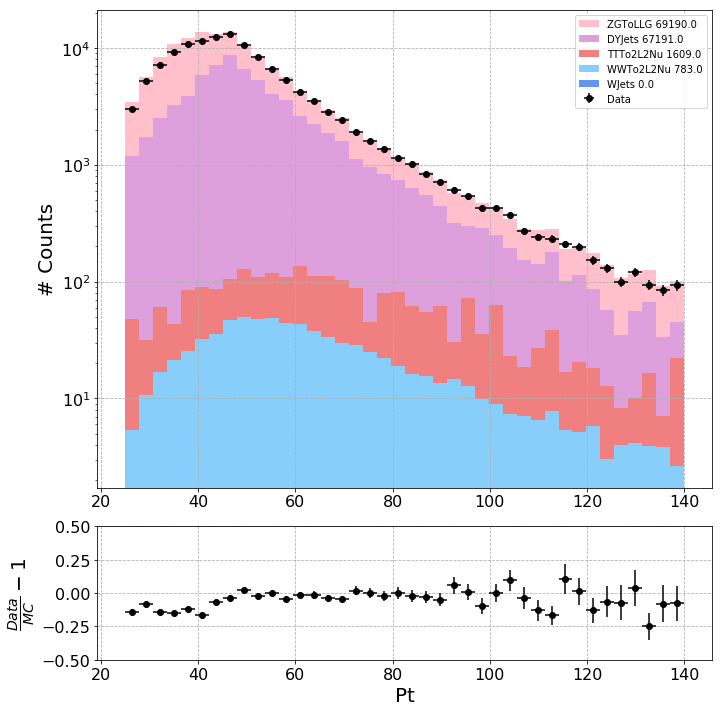

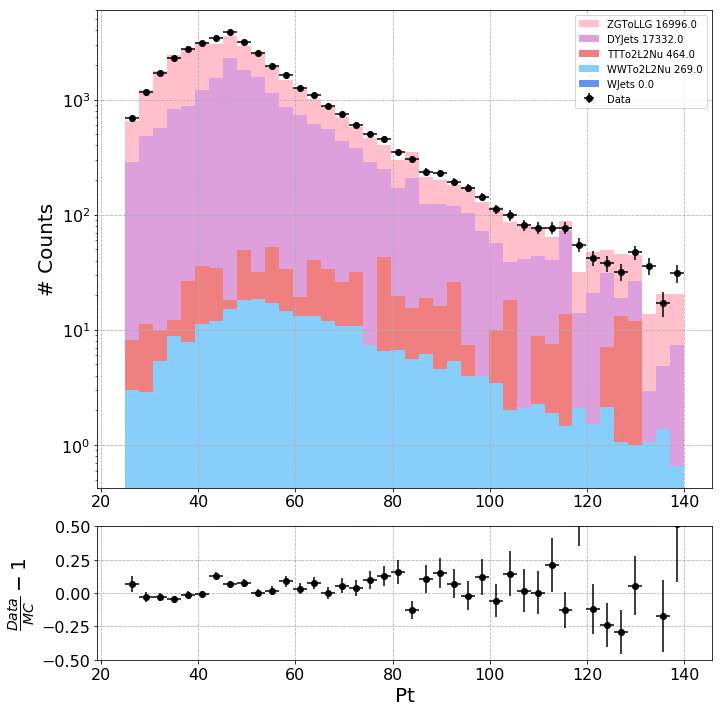

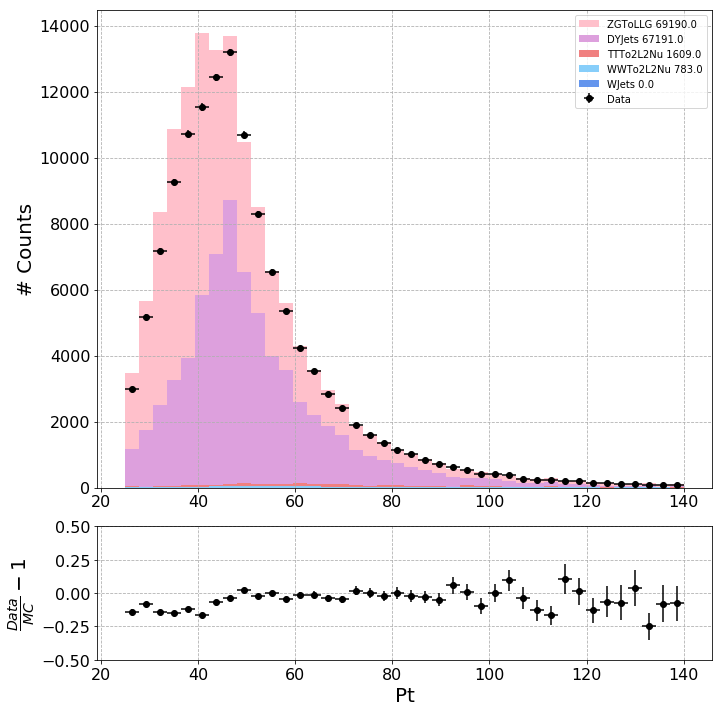

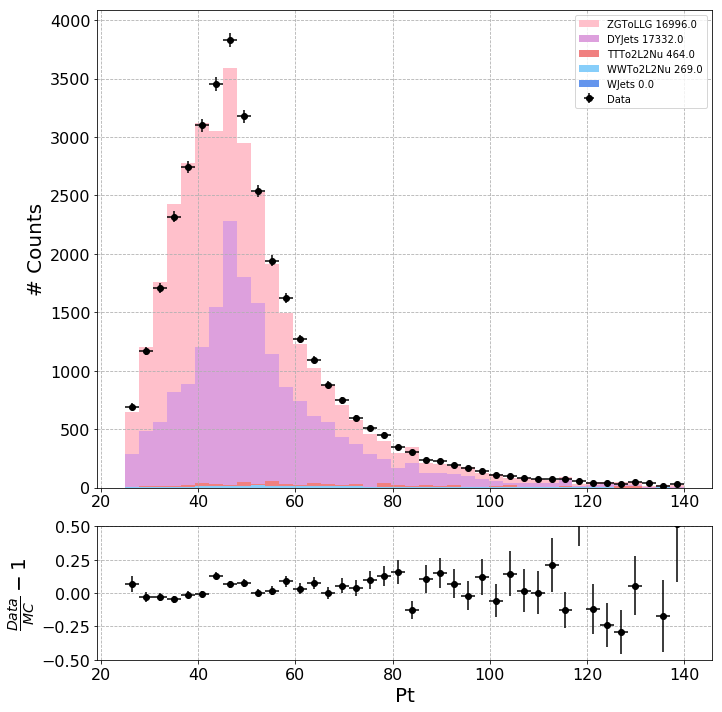

40 40
40 40
----------- leptonTwoPt -----------


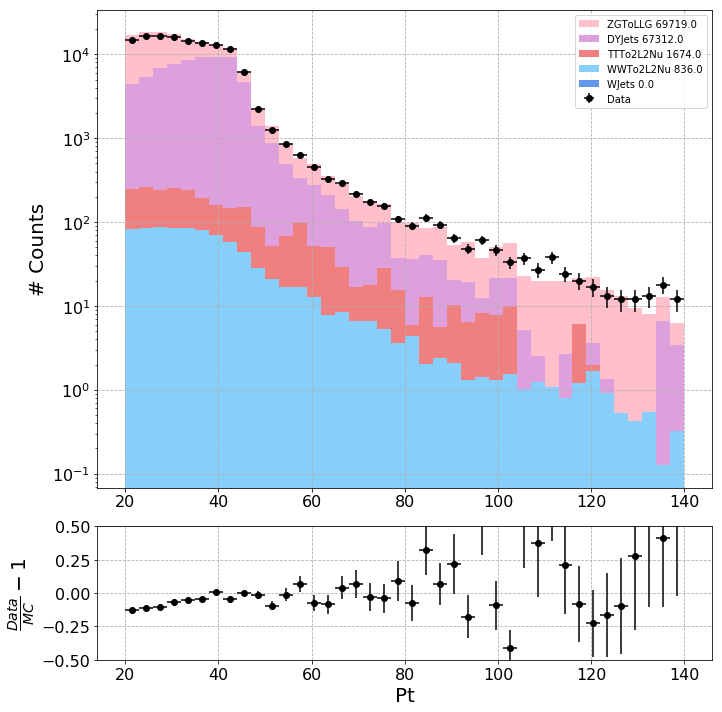

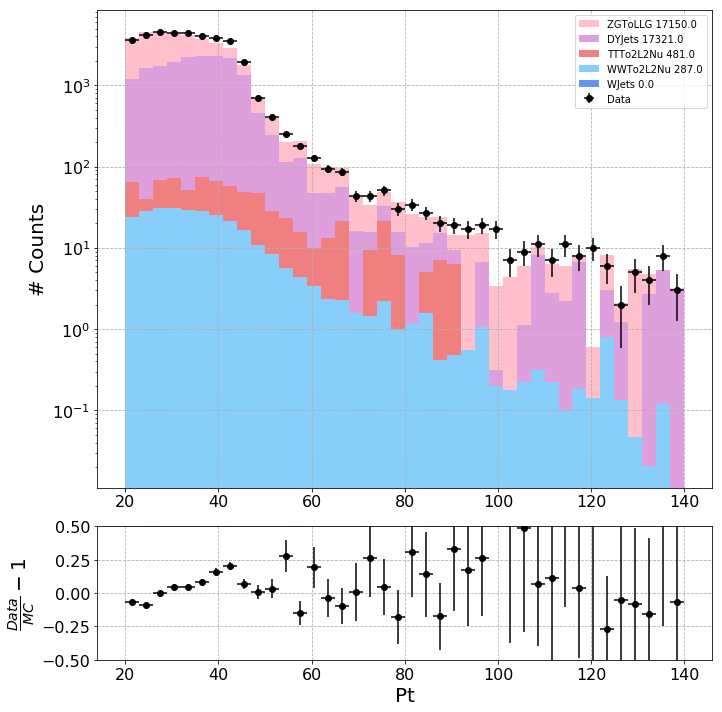

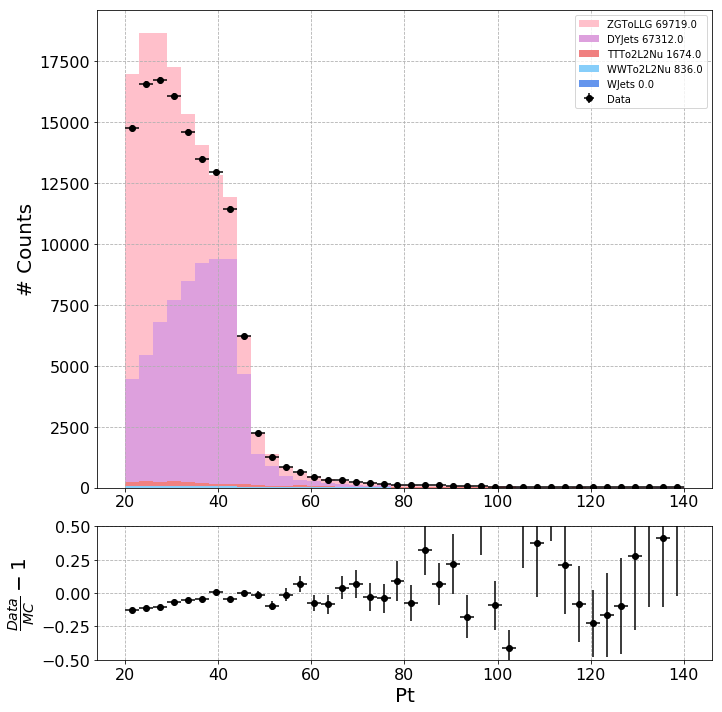

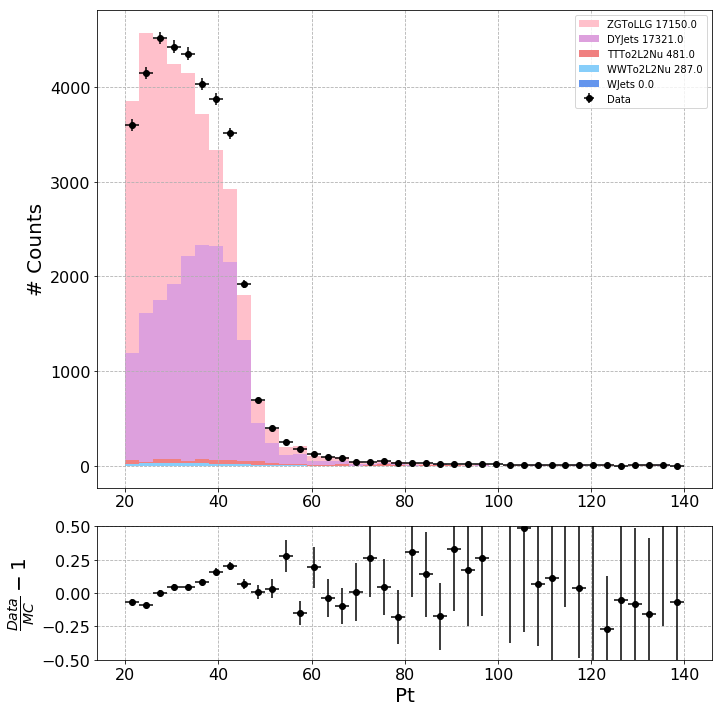

40 40
40 40
----------- photonOnePt -----------


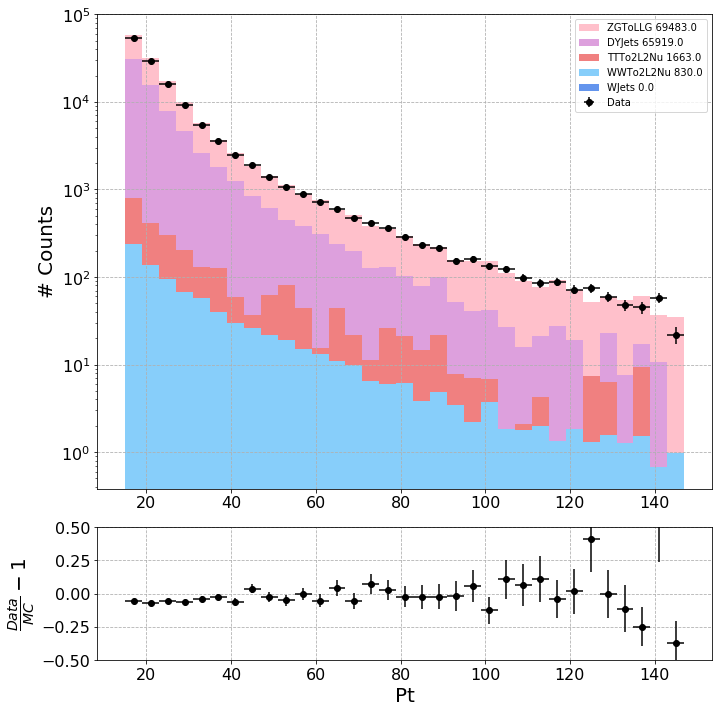

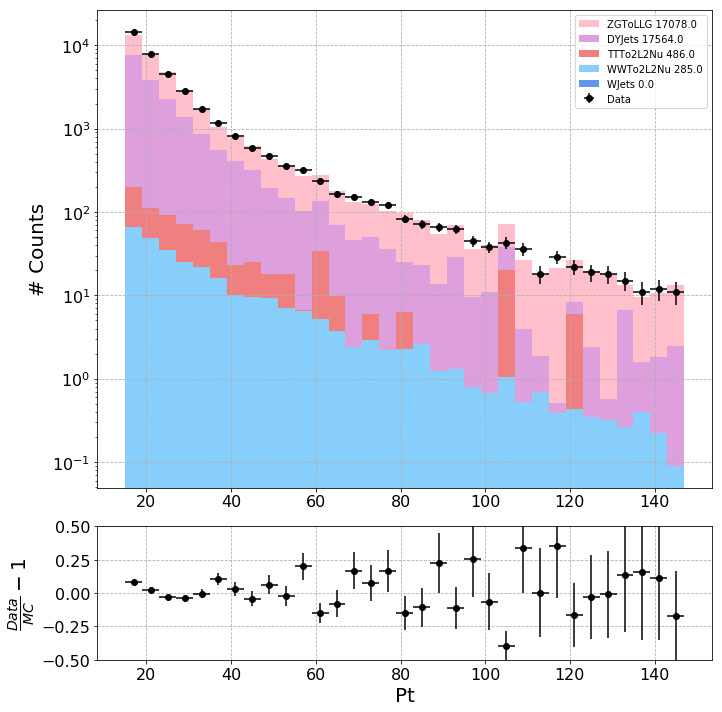

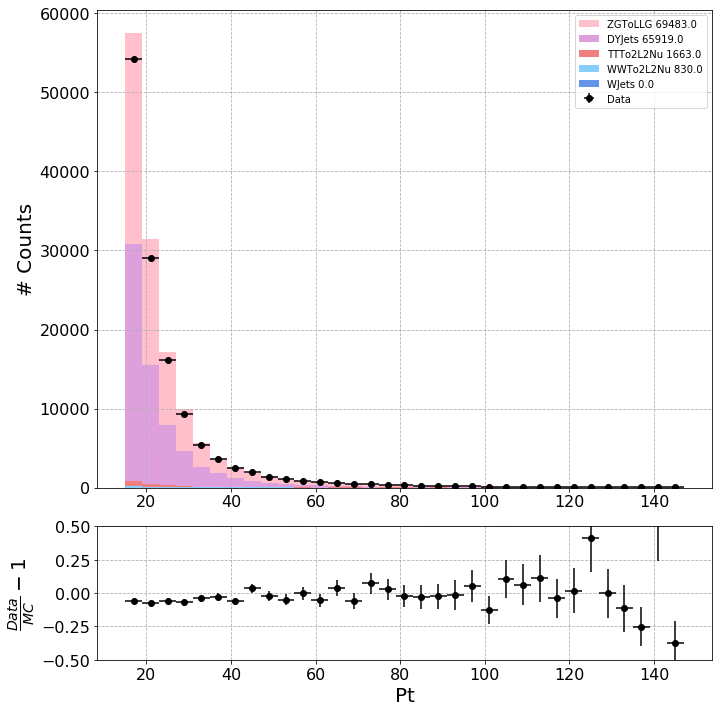

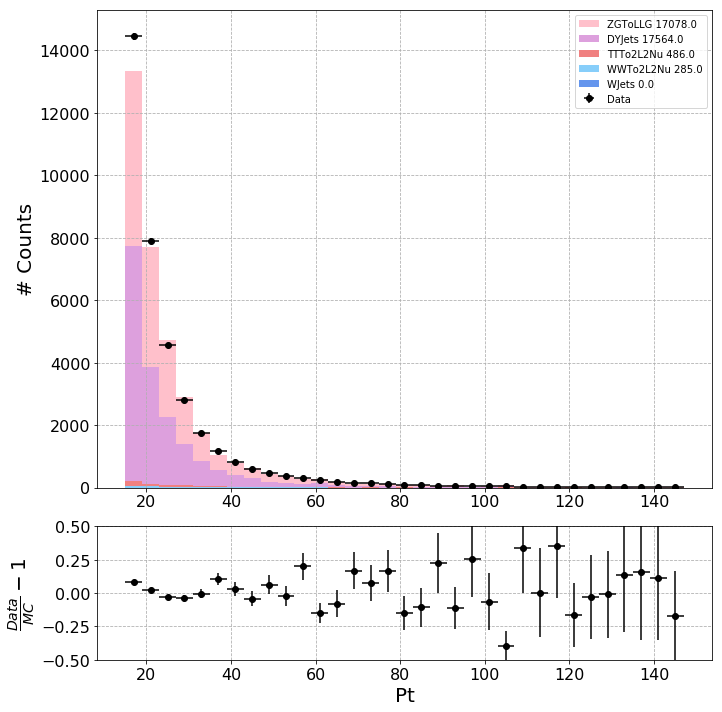

33 33
33 33
----------- dileptonPt -----------


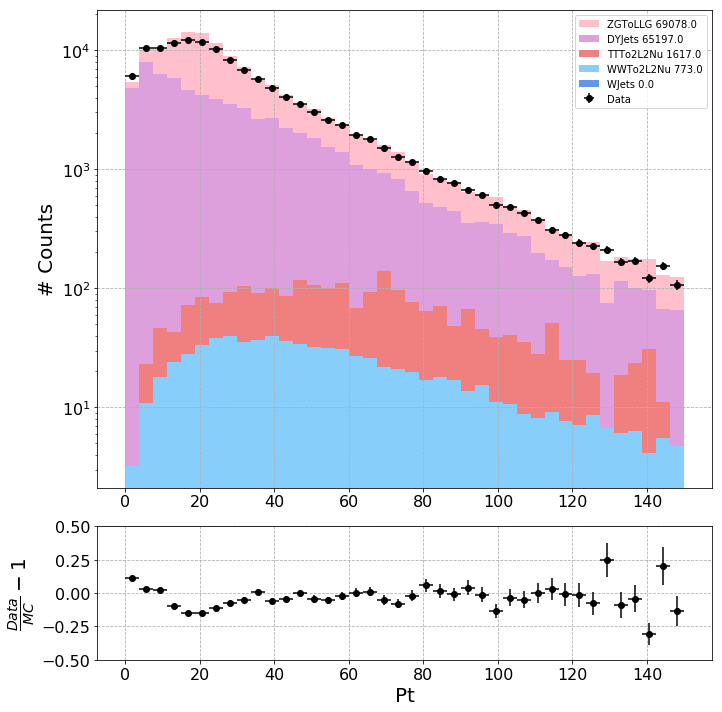

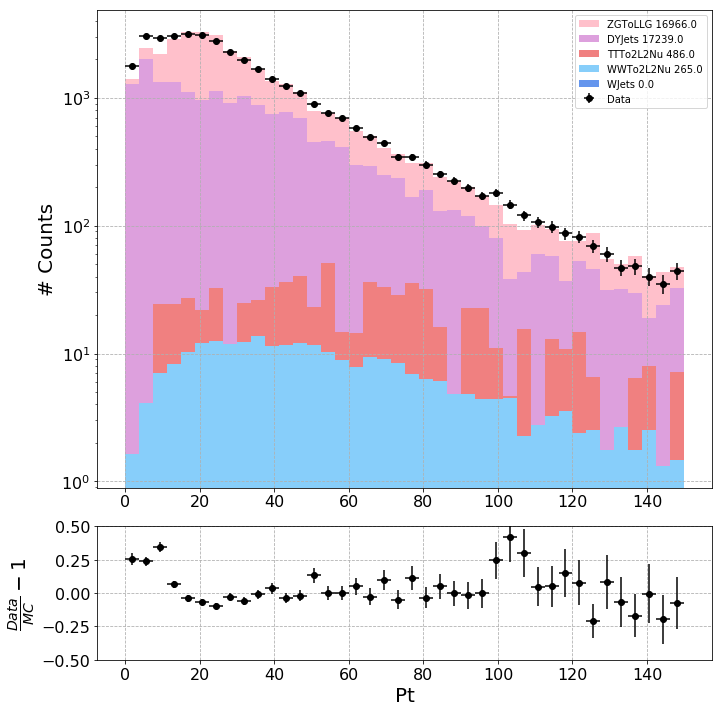

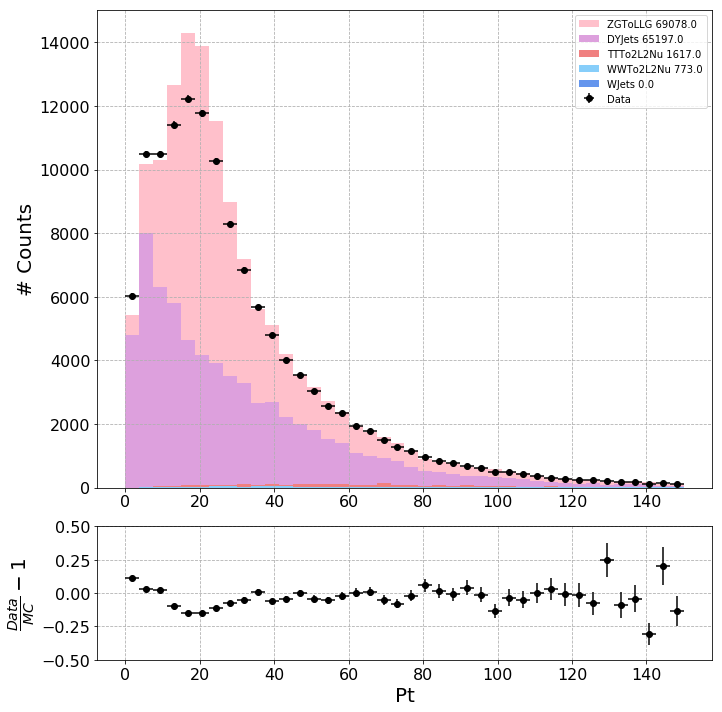

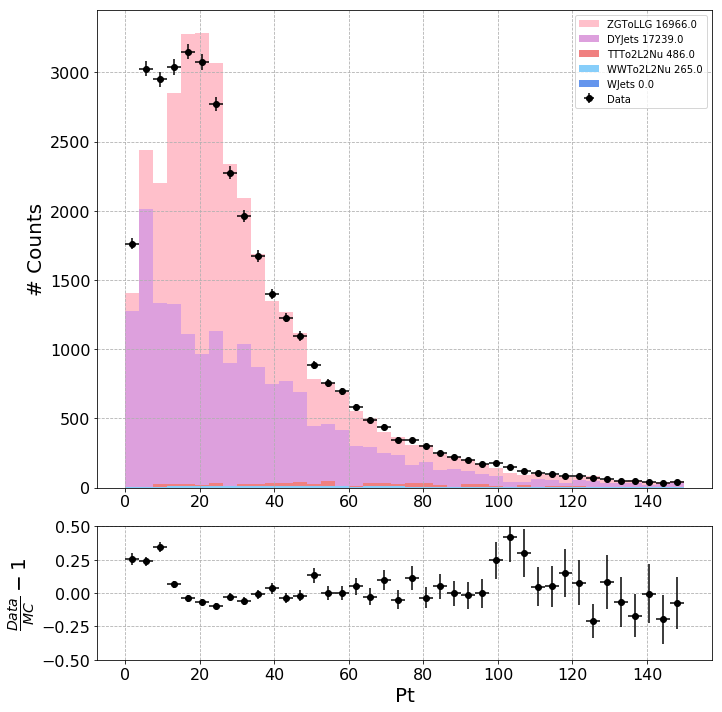

40 40
40 40
----------- llgPt -----------


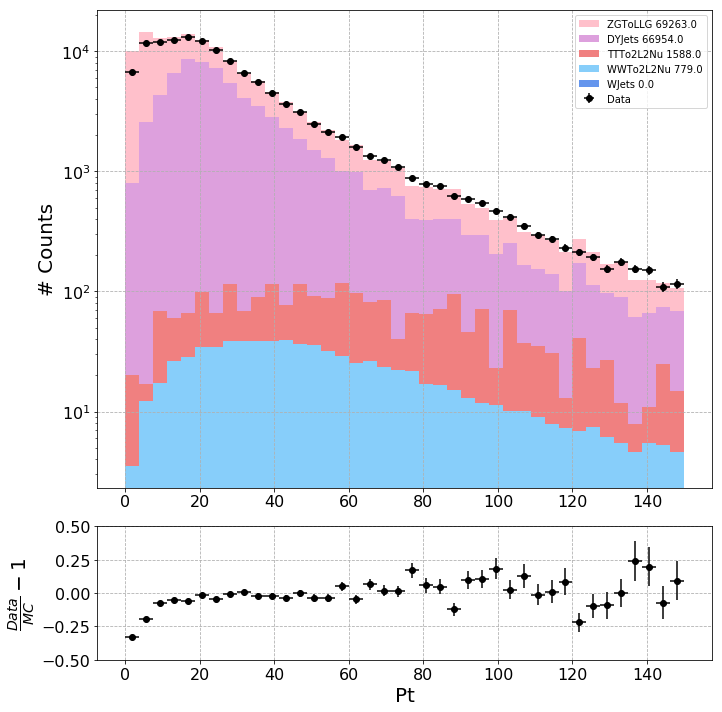

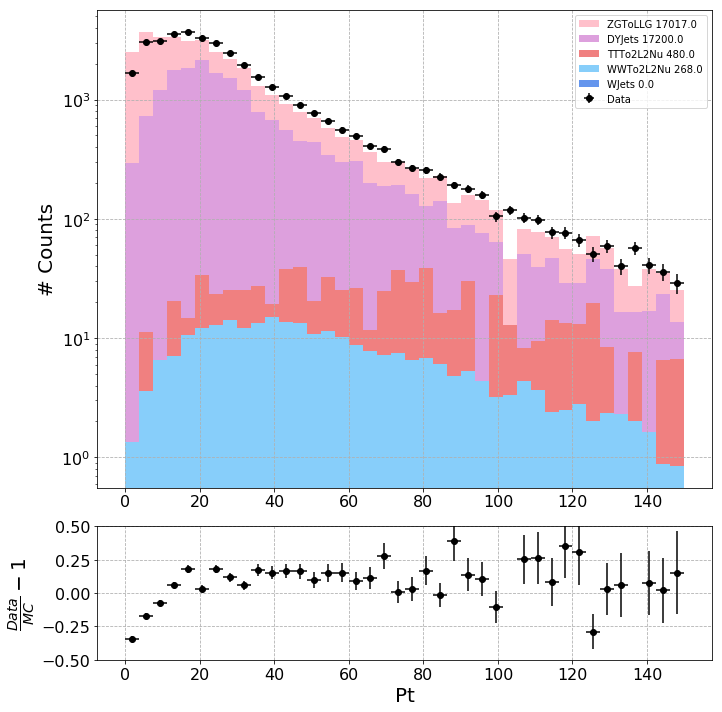

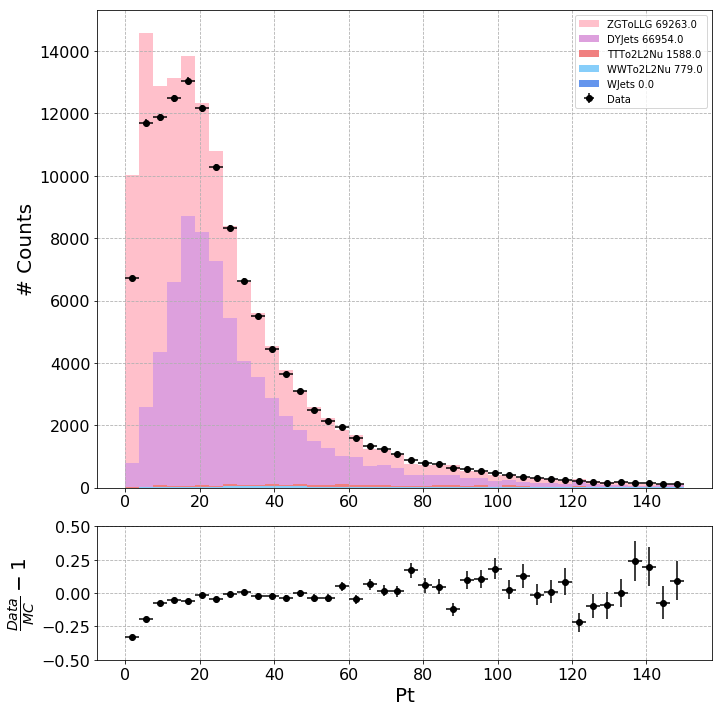

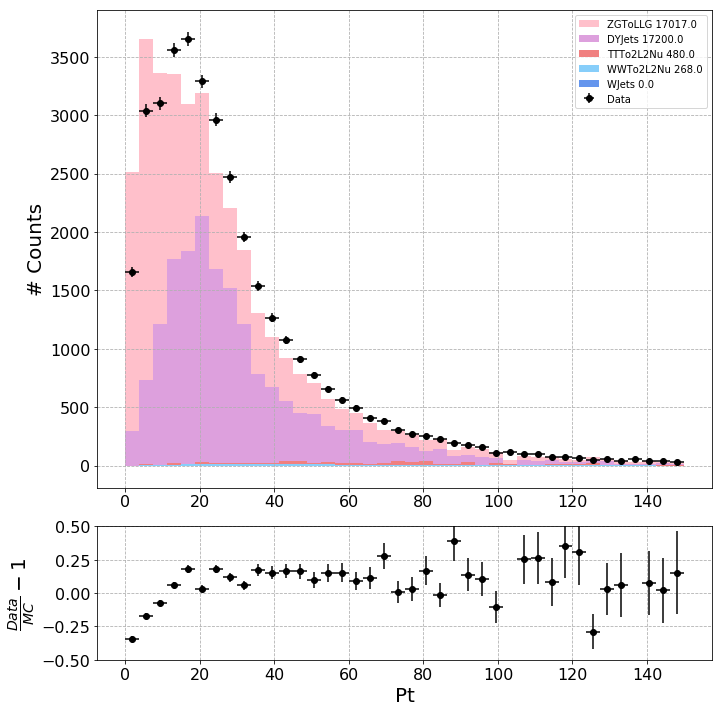

40 40
40 40


"\n##############################################        \n\npart = ['dilepton','llg']\nvar = ['Pt','M']\nph = ''\nfor p in part:\n    for v in var:\n        print('-----------',p+v,'-----------')\n        h,Template,FIT,Bins,Sig, Bkg, PlotVars = Plotting(data,part=p,var=v,ph=ph,DataDriven = DataDriven,ZGDataDriven = ZGDataDriven)        \n        SaveDataMC(part=p,var=v,ph=ph,Bins=Bins,PlotVars=PlotVars,Plot = False)\n        \n##############################################                \n        \npart = ['dilepton','l1Photon','l2Photon','dileptonPhoton']\nvar = ['DEta','DPhi','DR']\nph = ''\nfor p in part:\n    for v in var:\n        print('-----------',p+v,'-----------')\n        h,Template,FIT,Bins,Sig, Bkg, PlotVars = Plotting(data,part=p,var=v,ph=ph,DataDriven = DataDriven,ZGDataDriven = ZGDataDriven)        \n        SaveDataMC(part=p,var=v,ph=ph,Bins=Bins,PlotVars=PlotVars,Plot = False)\n"

In [51]:

ZGDataDriven = False
DataDriven = True
#DataDriven = False

##############################################        

part = ['leptonOne','leptonTwo','photonOne','dilepton','llg']
var = ['Pt']
ph = ''
for p in part:
    for v in var:
        print('-----------',p+v,'-----------')
        h,Template,FIT,Bins,Sig, Bkg, PlotVars = Plotting(data,part=p,var=v,ph=ph,DataDriven = DataDriven,ZGDataDriven = ZGDataDriven)        
        SaveDataMC(part=p,var=v,ph=ph,Bins=Bins,PlotVars=PlotVars,Plot = False)
        

##############################################        

part = ['dilepton','llg']
var = ['Pt','M']
ph = ''
for p in part:
    for v in var:
        print('-----------',p+v,'-----------')
        h,Template,FIT,Bins,Sig, Bkg, PlotVars = Plotting(data,part=p,var=v,ph=ph,DataDriven = DataDriven,ZGDataDriven = ZGDataDriven)        
        SaveDataMC(part=p,var=v,ph=ph,Bins=Bins,PlotVars=PlotVars,Plot = False)
   

##############################################                
        
part = ['dilepton','l1Photon','l2Photon','dileptonPhoton']
var = ['DEta','DPhi','DR']
ph = ''
for p in part:
    for v in var:
        print('-----------',p+v,'-----------')
        h,Template,FIT,Bins,Sig, Bkg, PlotVars = Plotting(data,part=p,var=v,ph=ph,DataDriven = DataDriven,ZGDataDriven = ZGDataDriven)        
        SaveDataMC(part=p,var=v,ph=ph,Bins=Bins,PlotVars=PlotVars,Plot = False)


In [74]:
M = []
name  = 'ZGToLLG'
for varS in h['Sig'][name]['[0, 1.4442]'].keys():
    M.append(np.sum(h['Sig'][name]['[0, 1.4442]'][varS][0]))

(array([ 845.9594362 , 1081.53199417, 1454.79377271, 1712.39453322,
        2135.82961725, 2610.97053967, 3022.29115455, 3468.64116605,
        3620.74139217, 3850.24863598, 3636.60915   , 3033.32364313,
        2328.99259757, 1582.03766743, 1042.80865368,  817.0653538 ,
         768.48859017,  982.42313585, 1583.61940007, 3682.34350931,
        6189.37621367, 3936.37312426, 1503.30405071,  683.76484344,
         394.26204784,  288.072779  ,  293.83377653,  378.48789443,
         271.44910907,  177.35748318,  156.40796241,  140.12763562,
         115.49468684,   98.38524898,   92.04554787,  100.55679699,
          72.42239402,   68.84372372,   60.70143792,   41.38490251,
          92.75920697,   69.33950404,   55.94118262,   49.34898672,
          37.21783978,   73.46300185]),
 array([ 51. ,  53. ,  55. ,  57. ,  59. ,  61. ,  63. ,  65. ,  67. ,
         69. ,  71. ,  73. ,  75. ,  77. ,  79. ,  81. ,  83. ,  85. ,
         87. ,  89. ,  91. ,  93. ,  95. ,  97. ,  99. , 101. , 103.5,

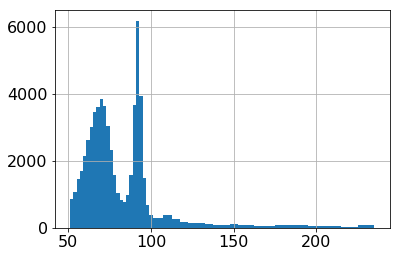

In [75]:
plt.hist(Help.BinFormat(Bins=Bins[part+var+ph],Type = 'center'),
         bins = Help.BinFormat(Bins=Bins[part+var+ph],Type = 'center'),
         weights = M)

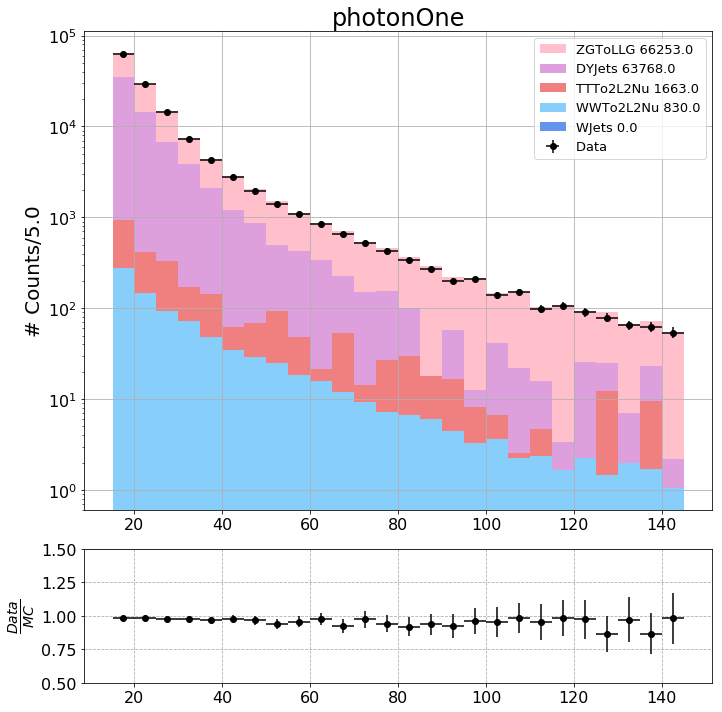

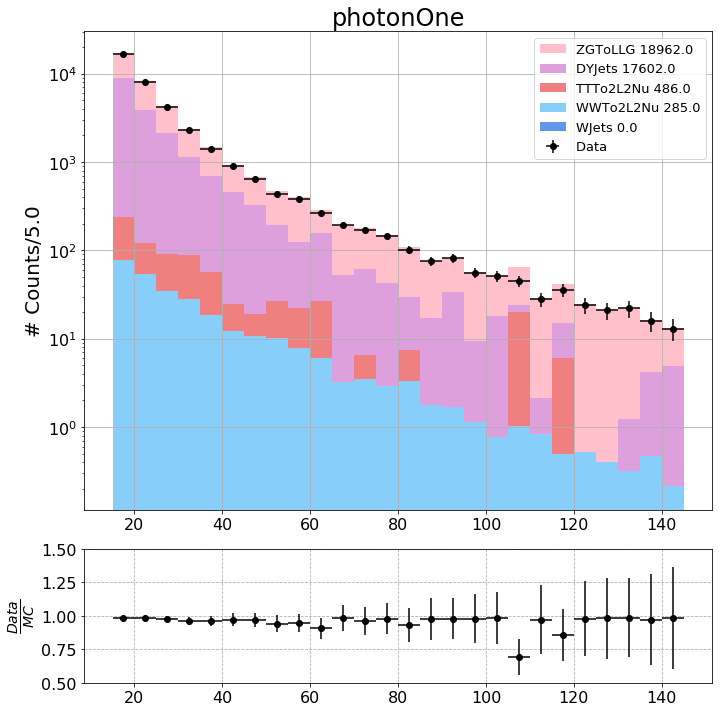

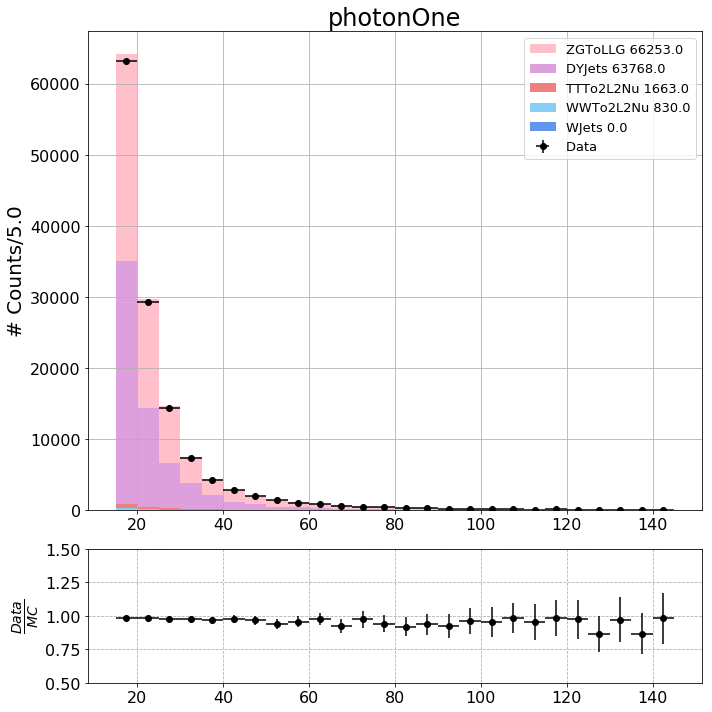

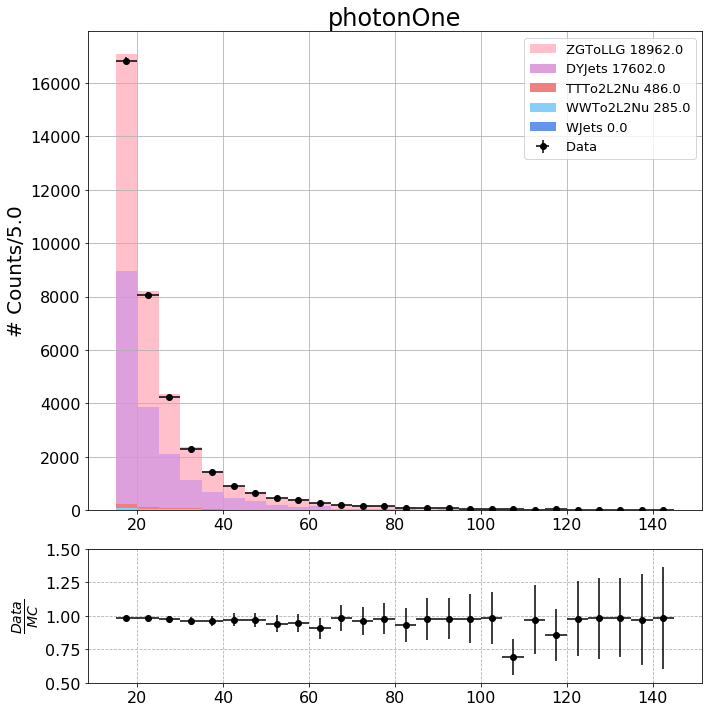

26 26
26 26


In [36]:
#p = 'dilepton'
#v = 'M'
#ph = ''

p = 'photonOne'
v = 'Pt'
ph = ''

DataDriven = True
ZGDataDriven = True

h,Template,FIT,Bins,Sig, Bkg, PlotVars = Plotting(data,part=p,var=v,ph=ph,DataDriven = DataDriven,ZGDataDriven = ZGDataDriven,IchRanges=IchRanges)        
SaveDataMC(part=p,var=v,ph=ph,Bins=Bins,PlotVars=PlotVars,Plot = False)

# Look at the High Pt

In [32]:
for d in data['Sig']:
    try:
        d.ResetCuts()
        d.AddCuts(np.array(d.df.photonOnePt) > 300)
    except:
        continue
    
VAR = [d.GetWithCuts('photonOnePt') for d in data['Sig']]
WEI = [d.GetWithCuts('weights') for d in data['Sig']]
    

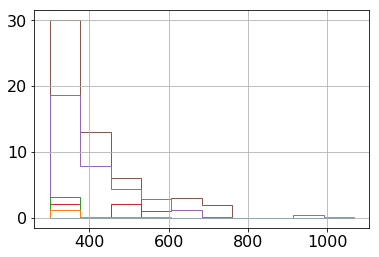

In [33]:
H = plt.hist(VAR,
             histtype = 'step',
             weights = WEI,
            )

In [34]:
for h,name in zip(H[0][:-1], data['Sig'][:-1]):
    print(np.sum(h),name.name)

0.0 WJets
1.506639573657084 WWTo2L2Nu
3.1205747434694504 TTTo2L2Nu
4.1431443972727 DYJets
35.42840250273679 ZGToLLG


# Template Plotting

In [35]:
def PlotTemplate(data,part,var,ph,h,Template,Bins,Signal=True):
    Names = np.array([d.name for d in data['Sig']])
    DYJets = np.array(data['Inv Sig'])[Names=='DYJets'][0]
    
    for eta in Bins['photonOneEta']: 
        etaS = str(eta)

        fig = plt.figure(figsize=(15,40))


        print(etaS)
        for var1, j in zip(Bins[part+var+ph], range(len(Bins[part+var+ph]))):
            var1S = str(var1)

            plt.subplot( np.ceil(len(IchRanges[part+var+ph][etaS])/4.0),4, j+1)

            #####################################

            ichConvert = [float(f) for f in IchRanges[part+var+ph][etaS][j].replace(']','').replace('[','').replace(',','').split(' ')]
            ichLow  = ichConvert[0]
            ichHigh = ichConvert[1]

            DYJets.ResetCuts()
            Ich = DYJets.GetWithCuts('photonOneIch')   
            DYJets.AddCuts(np.logical_and(Ich > ichLow, Ich < ichHigh))
            h['Inv Sig']['DYJets'],Bins = FindRegionInSideband(DYJets,part=part,var=var,ph=ph)

            ######################################

            Temp = lambda NSig,NBkg: NSig*np.array(Template['ZGToLLG'][etaS][var1S]) + NBkg*np.array(Template['DYJets'][etaS][var1S])

            NSig = FIT[etaS][var1S][0][0]
            NBkg = FIT[etaS][var1S][0][1]

            ####################################################################

            x = np.array(h['Sig']['DoubleMuon_2017'][etaS][var1S][1])
            xc = (x[:-1] + x[1:])/2
            bins = np.arange(-1,1.1,step=0.1)


            
            if Signal:
                plt.hist(
                        xc,
                        bins      = bins,
                        weights   = h['Sig']['ZGToLLG'][etaS][var1S][0],
                        color     = 'r',
                        histtype  = 'step',
                        linewidth = 1.5,
                        label     = 'Signal '+str(round(np.sum(h['Sig']['ZGToLLG'][etaS][var1S][0]),0)),
                        )
                plt.hist(
                        xc,
                        bins      = bins,
                        weights   = NSig*np.array(Template['ZGToLLG'][etaS][var1S]),
                        color     = 'purple',
                        histtype  = 'step',
                        linewidth = 1.5,
                        label     = 'Signal Temp ' + str(round(NSig,0)),
                        )
            else:
                plt.hist(
                        xc,
                        bins      = bins,
                        weights   = h['Sig']['DYJets'][etaS][var1S][0],
                        color     = 'b',
                        histtype  = 'step',
                        linewidth = 1.5,
                        label     = 'Bkg ' + str(round(np.sum(h['Sig']['DYJets'][etaS][var1S][0]),0)),
                        )      
                
                plt.hist(
                        xc,
                        bins      = bins,
                        weights   = NBkg*np.array(Template['DYJets'][etaS][var1S]),
                        color     = 'g',
                        histtype  = 'step',
                        linewidth = 1.5,
                        label     = 'Bkg Temp '+str(round(NBkg,0)),
                        )      
            
        
            
            Title = 'Ich' + IchRanges[part+var+ph][etaS][j] + \
                    ' Var' + var1S 
            plt.title(Title,fontsize=12)
            plt.legend()

            ax = plt.gca()

        plt.tight_layout()
        plt.show()
        
        if etaS == '[0, 1.4666]' or etaS == '[-1.4666, 0]':
            phType = 'EB'
        elif etaS == '[1.4666, 2.5]' or etaS == '[-2.5, -1.4666]':
            phType = 'EE'
            
            
        if Signal:
            fig.savefig(figpath+'TemplatesSignal_'+part+var+ph+'_'+phType+'.png')
        else:
            fig.savefig(figpath+'TemplatesBackground_'+part+var+ph+'_'+phType+'.png')

----------- dileptonM -----------


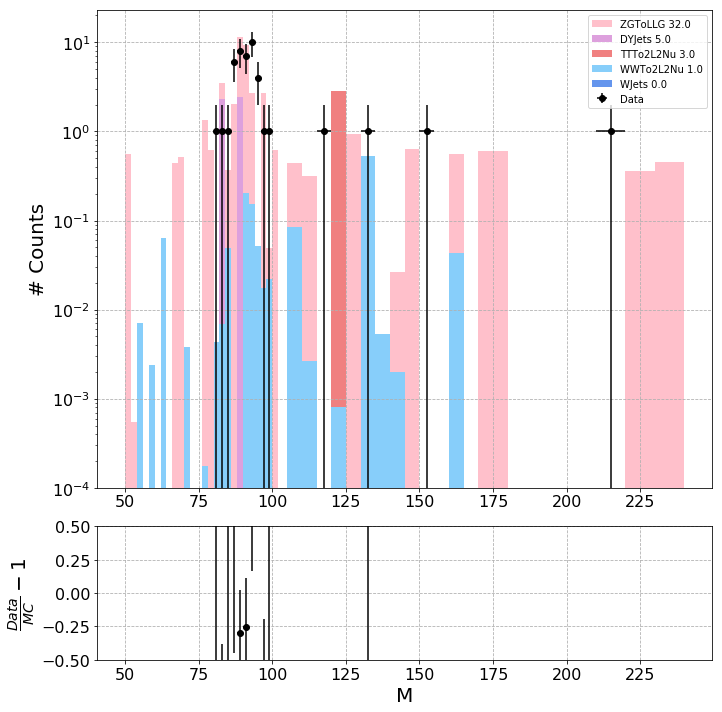

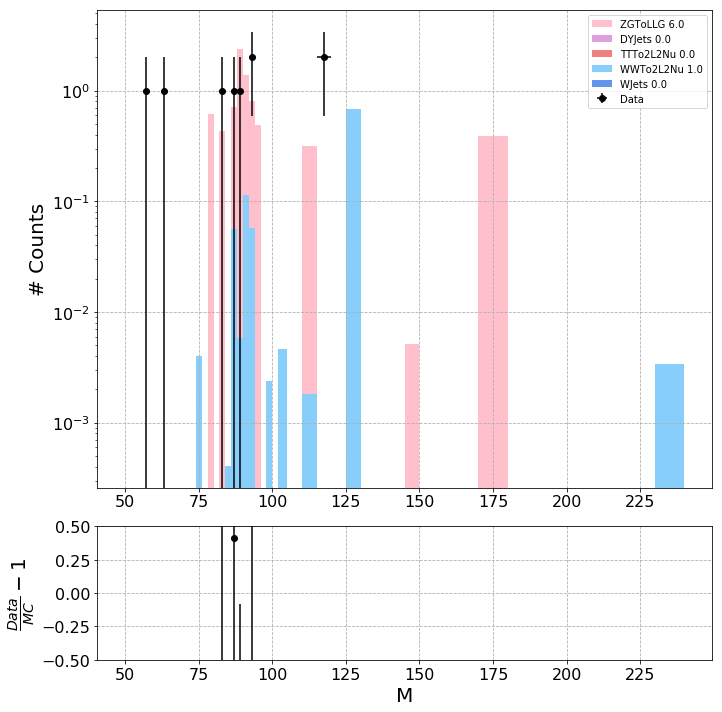

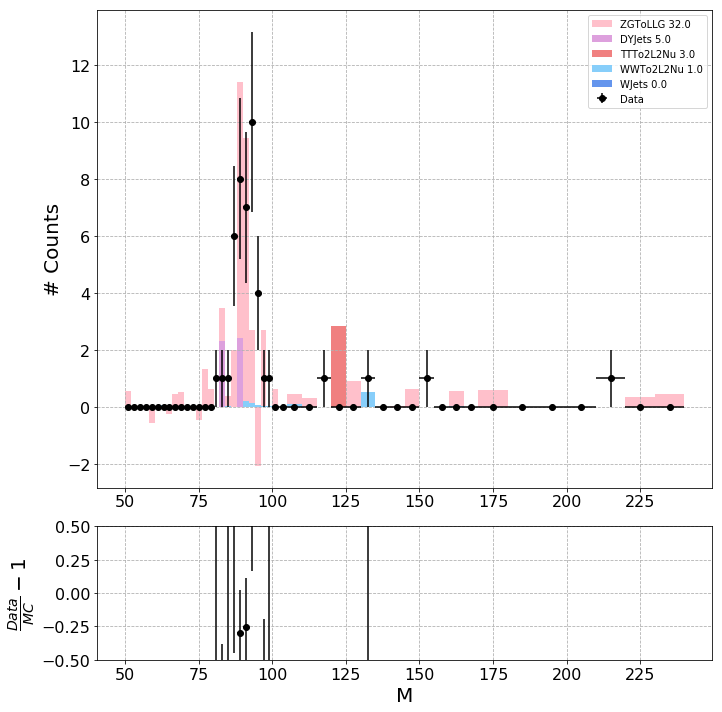

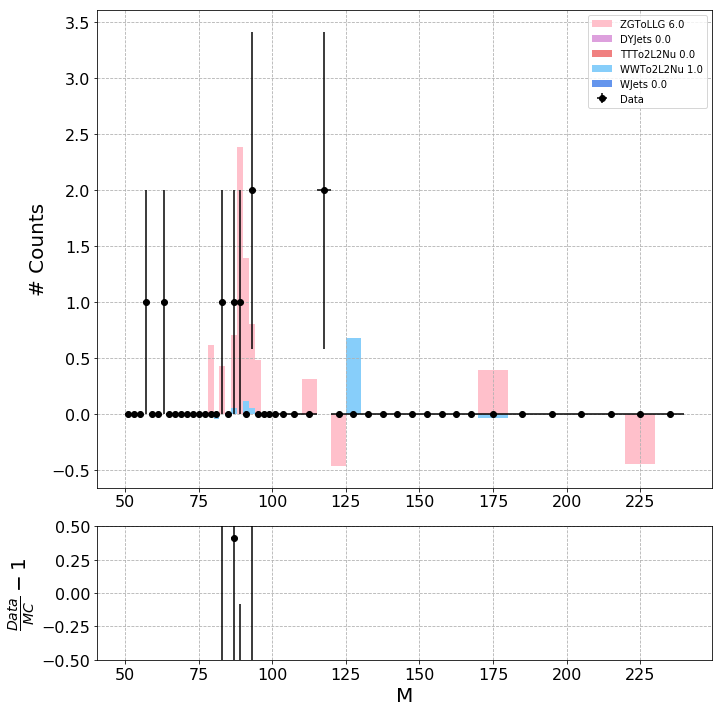

In [37]:
#DataDriven = True
DataDriven = False

#ZGDataDriven = True
ZGDataDriven = False
    
#part = ['dilepton','llg']    
part = ['dilepton']
#part = ['photonOne']
var  = ['M']     
#var  = ['DPhi']

for p in part:
    for v in var:
        print('-----------',p+v,'-----------')
        #h,Template,FIT,Bins = Plotting(data,part=p,var=v,ph=ph,DataDriven = DataDriven, ZGDataDriven = ZGDataDriven)
        HH = Plotting(data,part=p,var=v,ph=ph,DataDriven = DataDriven, ZGDataDriven = ZGDataDriven)
        #PlotTemplate(data,part=p,var=v,ph=ph,h=h,Template=Template,Bins=Bins,Signal=Signal)

In [41]:
#HH[0]

In [38]:
SFDataDriven = {}
for etaS in HH[0]['Sig']['ZGToLLG'].keys():
    SFDataDriven[etaS] = []
    
    x = []
    DD,MC = [],[]
    for i,varS in zip(range(len(HH[0]['Sig']['ZGToLLG'][etaS])),HH[0]['Sig']['ZGToLLG'][etaS].keys()):

        x.append(np.mean(ConvertToFloat(varS)))
        SFDataDriven[etaS].append(HH[-2][etaS][i]/np.sum(HH[0]['Sig']['ZGToLLG'][etaS][varS][0]))
        
        DD.append(HH[-2][etaS][i])
        MC.append(np.sum(HH[0]['Sig']['ZGToLLG'][etaS][varS][0]))

KeyError: 'Sig'

No handles with labels found to put in legend.


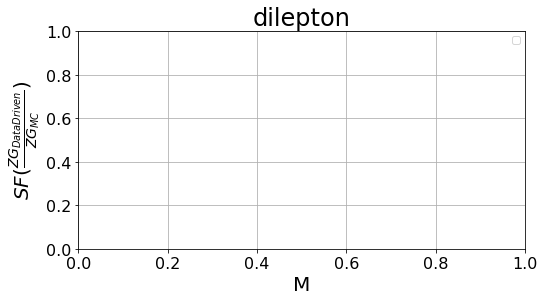

In [42]:
colorSF = {'[0, 1.4666]':'b',
           '[1.4666, 2.5]':'r'}

plt.figure(figsize = (8,4))
for etaS in SFDataDriven.keys():
    plt.plot(x,SFDataDriven[etaS],
             linewidth  = 1,
             marker     = 'o',
             color      = colorSF[etaS],
             markersize = 4,
             label      = etaS,
            )
plt.title(part[0])
plt.xlabel(var[0])
plt.ylabel(r'$SF(\frac{ZG_{DataDriven}}{ZG_{MC}})$')
plt.legend()

In [43]:
plt.plot(DD,label = 'DD')
plt.plot(MC,label = 'MC')
plt.legend()

NameError: name 'DD' is not defined

In [44]:
HH[0]['Sig']['ZGToLLG'][etaS][varS][0]

KeyError: 'Sig'

In [45]:
MC

NameError: name 'MC' is not defined

In [57]:
part = 'dilepton'
var = 'M'
ph = ''


for eta in Bins['photonOneEta']: 
    etaS = str(eta)
    
    plt.figure(figsize=(15,40))
    
    
    print(etaS)
    for var1, j in zip(Bins[part+var+ph], range(len(Bins[part+var+ph]))):
        var1S = str(var1)
        
        #plt.subplot( np.ceil(len(IchRanges[part+var+ph][etaS])/4.0),4, j+1)
        
        #####################################
        
        ichConvert = [float(f) for f in IchRanges[part+var+ph][etaS][j].replace(']','').replace('[','').replace(',','').split(' ')]
        ichLow  = ichConvert[0]
        ichHigh = ichConvert[1]
        
        DYJets.ResetCuts()
        Ich = DYJets.GetWithCuts('photonOneIch')   
        DYJets.AddCuts(np.logical_and(Ich > ichLow, Ich < ichHigh))
        h[Region]['DYJets'],Bins = FindRegionInSideband(DYJets,part=part,var=var,ph=ph)

        ######################################

        Temp = lambda NSig,NBkg: NSig*np.array(Template['ZGToLLG'][etaS][var1S]) + NBkg*np.array(Template['DYJets'][etaS][var1S])

        #NSig = FIT[etaS][var1S][0][0]
        #NBkg = FIT[etaS][var1S][0][1]
        NSig = 1
        NBkg = 1
        ####################################################################

        x = np.array(h['Sig']['DoubleMuon_2017'][etaS][var1S][1])
        xc = (x[:-1] + x[1:])/2
        bins = np.arange(-1,1.1,step=0.1)

        '''
        plt.hist(
                xc,
                bins      = bins,
                weights   = NSig*np.array(Template['ZGToLLG'][etaS][var1S]),
                color     = 'r',
                histtype  = 'step',
                linewidth = 1.5,
                label     = 'Signal',
                )
        ''';

        plt.hist(
                xc,
                bins      = bins,
                weights   = NBkg*np.array(Template['DYJets'][etaS][var1S]),
                #weights = h['Inv Sig']['DYJets'][etaS][var1S][0]/np.sum(h['Inv Sig']['DYJets'][etaS][var1S][0]),
                color     = 'g',
                histtype  = 'step',
                linewidth = 1.5,
                label     = 'Bkg',
                )       
        plt.title(var1S+'['+str(ichLow)+' '+str(ichHigh)+']')
        plt.ylabel(np.sum(DYJets.cuts))
        plt.legend()

        ax = plt.gca()
        #ax.set_yscale('log')
    plt.tight_layout()
    plt.show()





[0, 1.4442]


KeyError: 'dileptonM'

<Figure size 1080x2880 with 0 Axes>

In [56]:
Bins

{'photonOneEta': [[0, 1.4442], [1.5666, 2.5]],
 'dileptonM': [[50.0, 52.0],
  [52.0, 54.0],
  [54.0, 56.0],
  [56.0, 58.0],
  [58.0, 60.0],
  [60.0, 62.0],
  [62.0, 64.0],
  [64.0, 66.0],
  [66.0, 68.0],
  [68.0, 70.0],
  [70.0, 72.0],
  [72.0, 74.0],
  [74.0, 76.0],
  [76.0, 78.0],
  [78.0, 80.0],
  [80.0, 82.0],
  [82.0, 84.0],
  [84.0, 86.0],
  [86.0, 88.0],
  [88.0, 90.0],
  [90.0, 92.0],
  [92.0, 94.0],
  [94.0, 96.0],
  [96.0, 98.0],
  [98.0, 100.0],
  [100.0, 102.0],
  [102.0, 105.0],
  [105.0, 110.0],
  [110.0, 115.0],
  [115.0, 120.0],
  [120.0, 125.0],
  [125.0, 130.0],
  [130.0, 135.0],
  [135.0, 140.0],
  [140.0, 145.0],
  [145.0, 150.0],
  [150.0, 155.0],
  [155.0, 160.0],
  [160.0, 165.0],
  [165.0, 170.0],
  [170.0, 180.0],
  [180.0, 190.0],
  [190.0, 200.0],
  [200.0, 210.0],
  [210.0, 220.0],
  [220.0, 230.0],
  [230.0, 240.0]]}